In [1]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:38943")
client

<Client: 'tcp://127.0.0.1:38943' processes=8 threads=32, memory=125.85 GiB>

In [2]:
import numpy as np
import xarray as xr
import pandas as pd
import os.path as op
import os
import gsw
import xrft
import xwavelet
from scipy.interpolate import griddata
from scipy.stats import bootstrap
from xgcm.grid import Grid
import MITgcmutils as mitutils
from xmitgcm import open_mdsdataset
# from fastjmd95 import rho as densjmd95
import matplotlib.colors as clr
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
ddir = '/tank/chaocean/qjamet/RUNS/ORAR/reruns2/'
gdir = '/tank/chaocean/grid_chaO/gridMIT_update1/'
savedir = '/tank/topog/tuchida/Wavelet-spectrum/'
spec = '/tank/spectre/tuchida/NA-wavelets/'

In [4]:
grav = 9.81
nensembs = 5
Kh = 20.
K4 = 1e10
Kr = 1e-5
thetaMax = 1e20
rhoConst = 9.998e2
# Cp = 3.994e3
Cp = 3989.244953
# years = np.arange(2008,2013,dtype=int)
ySstart = -15
yNstart = 15
yend = 50
dnf = 2160
nfile = 73

In [20]:
xs = [295,318,
      297.5,316,
      300,315
     ]
ys = [37,43,
      30.5,30,
      24,22
     ]
reg = 0
sreg = ['A','B','C','D','E','F']

xo = 50e3

nmembs = np.arange(100,148)
xchunk = 200
ychunk = 200

In [6]:
iiter = 1419120
# iiter = 1421280
# iiter = 1423440
dg = 0
# dsb = xr.open_zarr(op.join(savedir,'Snaps_EnsMean_0001419123.zarr')
#                   ).sel(YC=slice(ys[reg]-5,ys[reg]+5),
#                         YG=slice(ys[reg]-5,ys[reg]+5),
#                         XC=slice(xs[reg]-5,xs[reg]+5),
#                         XG=slice(xs[reg]-5,xs[reg]+5)
#                        )
dsb = open_mdsdataset(op.join(ddir,'ensm/run1967/ocn'), 
                      grid_dir=gdir,
                      prefix=['snap_diagOcn'], delta_t=2e2,
                      iters=iiter, 
                     ).sel(YC=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                           YG=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                           XC=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12),
                           XG=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12)
                          ).chunk({'Z':1,'Zl':1,'Zu':1,'Zp1':1}).isel(time=0)
# dsUmb = xr.open_zarr(op.join(savedir,'SnapsUm_EnsMean_0001419123.zarr')
#                     ).sel(YC=slice(ys[reg]-5,ys[reg]+5),
#                           XG=slice(xs[reg]-5,xs[reg]+5)
#                          )
dsm = xr.open_zarr(op.join(spec,'Snaps_Tot-Adv_EnsMean/%010d.zarr' % iiter)
                  ).sel(YC=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                        YG=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                        XC=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12),
                        XG=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12)
                       ).chunk({'Z':1})
dsUmb = open_mdsdataset(op.join(ddir,'ensm/run1967/ocn'), 
                        grid_dir=gdir,
                        prefix=['diagUm'], delta_t=2e2,
                        iters=iiter, 
                        ignore_unknown_vars=True
                       ).sel(YC=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                             YG=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                             XC=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12),
                             XG=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12)
                            ).chunk({'Z':1,'Zl':1,'Zu':1,'Zp1':1}).isel(time=0)
if len(dsb.XG) > len(dsb.XC):
     dsb = dsb.isel(XG=slice(None,-1))
if len(dsUmb.XG) > len(dsUmb.XC):
     dsUmb = dsUmb.isel(XG=slice(None,-1))
# dsVmb = xr.open_zarr(op.join(savedir,'SnapsVm_EnsMean_0001419123.zarr')
#                     ).sel(YG=slice(ys[reg]-5,ys[reg]+5),
#                           XC=slice(xs[reg]-5,xs[reg]+5)
#                          )
dsVmb = open_mdsdataset(op.join(ddir,'ensm/run1967/ocn'), 
                        grid_dir=gdir,
                        prefix=['diagVm'], delta_t=2e2,
                        iters=iiter, 
                        ignore_unknown_vars=True
                       ).sel(YC=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                             YG=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                             XC=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12),
                             XG=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12)
                            ).chunk({'Z':1,'Zl':1,'Zu':1,'Zp1':1}).isel(time=0)
dsUmextb = xr.open_zarr(op.join(savedir,'SnapsUm-ext_EnsMean_%010d.zarr' % iiter)
                       ).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                             XG=slice(xs[reg]-5,xs[reg]+5)
                            ).isel(XG=slice(None,116))
dsVmextb = xr.open_zarr(op.join(savedir,'SnapsVm-ext_EnsMean_%010d.zarr' % iiter)
                       ).sel(YG=slice(ys[reg]-5,ys[reg]+5),
                             XC=slice(xs[reg]-5,xs[reg]+5)
                            )
dsm

<xarray.Dataset>
Dimensions:   (Z: 46, YC: 120, XG: 117, YG: 120, XC: 116)
Coordinates:
  * XC        (XC) float32 290.1 290.1 290.2 290.3 ... 299.7 299.8 299.9 300.0
  * XG        (XG) float32 290.0 290.1 290.2 290.3 ... 299.7 299.8 299.9 300.0
  * YC        (YC) float32 32.0 32.08 32.17 32.25 ... 41.67 41.75 41.83 41.92
  * YG        (YG) float32 32.04 32.13 32.21 32.29 ... 41.71 41.79 41.88 41.96
  * Z         (Z) float32 -3.047 -9.454 -16.36 ... -5.625e+03 -5.875e+03
    time      timedelta64[ns] ...
Data variables:
    TOTUTEND  (Z, YC, XG) float32 dask.array<chunksize=(1, 120, 74), meta=np.ndarray>
    TOTVTEND  (Z, YG, XC) float32 dask.array<chunksize=(1, 120, 74), meta=np.ndarray>
    Um_Advec  (Z, YC, XG) float32 dask.array<chunksize=(1, 120, 74), meta=np.ndarray>
    Vm_Advec  (Z, YG, XC) float32 dask.array<chunksize=(1, 120, 74), meta=np.ndarray>

In [7]:
grid = Grid(dsb, periodic=[], 
            # coords={'Z': {'center': 'Z', 'outer': 'Zp1', 'left':'Zl', 'right':'Zu'},
            #                           'Y': {'center': 'YC', 'left': 'YG'},
            #                           'X': {'center': 'XC', 'left': 'XG'}}
           )
grid

<xgcm.Grid>
Z Axis (not periodic, boundary=None):
  * center   Z --> left
  * outer    Zp1 --> center
  * right    Zu --> center
  * left     Zl --> center
Y Axis (not periodic, boundary=None):
  * center   YC --> left
  * left     YG --> center
X Axis (not periodic, boundary=None):
  * center   XC --> left
  * left     XG --> center

In [8]:
for nmemb in nmembs:
    if nmemb == 100:
        ds = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                     % (nmemb)), 
                             grid_dir=gdir,
                             prefix=['snap_diagOcn'], delta_t=2e2,
                             iters=iiter, 
                             ignore_unknown_vars=True
                            ).isel(time=0).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                               YG=slice(ys[reg]-5,ys[reg]+5),
                                               XC=slice(xs[reg]-5,xs[reg]+5),
                                               XG=slice(xs[reg]-5,xs[reg]+5)
                                              )
    else:
        ds1 = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                     % (nmemb)), 
                             grid_dir=gdir,
                             prefix=['snap_diagOcn'], delta_t=2e2,
                             iters=iiter, 
                             ignore_unknown_vars=True
                            ).isel(time=0).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                               YG=slice(ys[reg]-5,ys[reg]+5),
                                               XC=slice(xs[reg]-5,xs[reg]+5),
                                               XG=slice(xs[reg]-5,xs[reg]+5)
                                              )
        ds = xr.concat([ds, ds1], dim='nmemb')
        ds1.close()
    print(nmemb)

            # ds = ds.chunk({'nmemb':6})
ds.coords['nmemb'] = ('nmemb',nmembs)
if len(ds.XG) > len(ds.XC):
     ds = ds.isel(XG=slice(None,-1))
ds

100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147


<xarray.Dataset>
Dimensions:  (XC: 116, YC: 120, XG: 116, YG: 120, Z: 46, Zp1: 47, Zu: 46,
              Zl: 46, nmemb: 48)
Coordinates: (12/34)
    iter     int64 1419120
    time     timedelta64[ns] 3285 days
  * XC       (XC) >f4 290.1 290.1 290.2 290.3 290.4 ... 299.7 299.8 299.9 300.0
  * YC       (YC) >f4 32.0 32.08 32.17 32.25 32.33 ... 41.67 41.75 41.83 41.92
  * XG       (XG) >f4 290.0 290.1 290.2 290.3 290.4 ... 299.7 299.7 299.8 299.9
  * YG       (YG) >f4 32.04 32.13 32.21 32.29 32.38 ... 41.71 41.79 41.88 41.96
    ...       ...
    maskS    (Z, YG, XC) bool dask.array<chunksize=(46, 120, 116), meta=np.ndarray>
    maskInC  (YC, XC) bool dask.array<chunksize=(120, 116), meta=np.ndarray>
    rhoRef   (Z) >f4 1.021e+03 1.021e+03 1.021e+03 ... 1.044e+03 1.044e+03
    maskInW  (YC, XG) bool dask.array<chunksize=(120, 116), meta=np.ndarray>
    maskInS  (YG, XC) bool dask.array<chunksize=(120, 116), meta=np.ndarray>
  * nmemb    (nmemb) int64 100 101 102 103 104 105 ... 142 143 144 145 146 147
Data variables:
    THETA    (nmemb, Z, YC, XC) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    SALT     (nmemb, Z, YC, XC) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    UVEL     (nmemb, Z, YC, XG) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    VVEL     (nmemb, Z, YG, XC) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    WVEL     (nmemb, Zl, YC, XC) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    title:        netCDF wrapper of MITgcm MDS binary data
    source:       MITgcm
    history:      Created by calling `open_mdsdataset(grid_dir='/tank/chaocea...

In [9]:
xT = grid.cumsum(ds.dxC,'X',boundary='extend'
                )
yT = grid.cumsum(ds.dyC,'Y',boundary='extend'
                )
ny, nx = xT.shape
xT = xT - xT.isel(XC=nx//2)
xT = (xT - xT.isel(YC=-1,XC=0)).values.flatten()
yT = (yT - yT.isel(YC=0)).values.flatten()
dx = ds.dxC.min().values
dy = ds.dyC.min().values
N = ds.THETA.isel(nmemb=0,Z=0).shape

xxx, yyy = np.mgrid[0:N[-1]*dx:dx, 0:N[-2]*dy:dy]
ntheta = 36
ss = xr.open_zarr(
    '/tank/topog/tuchida/Wavelet-spectrum/isoDiags_KE_region%02d_1967-01-01.zarr' 
                  % reg).scale/xo
# ss = xr.open_zarr(
#     '/tank/topog/tuchida/Wavelet-spectrum/isoDiags_KE_region%02d_%010d.zarr' 
#                   % (reg,iiter)).scale/xo
# ss0 = xr.DataArray(np.linspace(2*np.maximum(dx,dy),10*xo,30)/xo, dims=['scale'], 
#                   coords={'scale':np.linspace(2*dx,10*xo,30)/xo}
#                  )
ss

<xarray.DataArray 'scale' (scale: 47)>
array([9.24825986, 9.02129302, 8.79432618, 8.56735935, 8.34039251,
       8.11342567, 7.88645884, 7.659492  , 7.43252516, 7.20555832,
       6.97859149, 6.75162465, 6.52465781, 6.29769098, 6.07072414,
       5.8437573 , 5.61679047, 5.38982363, 5.16285679, 4.93588995,
       4.70892312, 4.48195628, 4.25498944, 4.02802261, 3.80105577,
       3.57408893, 3.3471221 , 3.12015526, 2.89318842, 2.66622158,
       2.43925475, 2.21228791, 1.98532107, 1.75835424, 1.5313874 ,
       1.30442056, 1.07745373, 0.87054724, 0.76886874, 0.68787468,
       0.6226582 , 0.5690005 , 0.52386193, 0.48441461, 0.45082619,
       0.42189398, 0.39655321])
Coordinates:
  * scale    (scale) float64 4.624e+05 4.511e+05 ... 2.109e+04 1.983e+04

In [10]:
up = (ds.UVEL - dsb.UVEL)
upC = grid.interp(up,'X',boundary='extend'
                 ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
vp = (ds.VVEL - dsb.VVEL)
vpC = grid.interp(vp,'Y',boundary='extend'
                 ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
wp = (ds.WVEL - dsb.WVEL)

ub = dsb.UVEL
ubC = grid.interp(ub,'X',boundary='extend'
                 ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
vb = dsb.VVEL
vbC = grid.interp(vb,'Y',boundary='extend'
                 ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


In [11]:
rAterp = griddata((xT, yT), ds.rA.values.flatten(),
                  (xxx, yyy) 
                 ).T

In [12]:
uterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                     coords={'nmemb':nmembs,'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
vterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                     coords={'nmemb':nmembs,'Z':vpC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )

for iz in range(len(upC.Z)):
    for nn in range(len(nmembs)):
        uterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT),
                                                (upC*ds.rA
                                                ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 
        vterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                (vpC*ds.rA
                                                ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 
        
uterp = uterp / rAterp
vterp = vterp / rAterp

In [13]:
uinterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                     coords={'nmemb':nmembs,'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
vinterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                     coords={'nmemb':nmembs,'Z':vpC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )

for iz in range(len(upC.Z)):
    for nn in range(len(nmembs)):
        uinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                  (upC.interpolate_na(dim='XC'
                                                                    ).interpolate_na(dim='YC'
                                                                                    ).fillna(0.) 
                                                   * ds.rA
                                                  ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 
        vinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                  (vpC.interpolate_na(dim='YC'
                                                                    ).interpolate_na(dim='XC'
                                                                                    ).fillna(0.) 
                                                   * ds.rA
                                                  ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 
        
uinterp = uinterp / rAterp
vinterp = vinterp / rAterp

In [14]:
for nmemb in nmembs:
    if nmemb == 100:
        dsUm = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' % (nmemb)), 
                               grid_dir=gdir,
                               prefix=['diagUm'], delta_t=2e2,
                               iters=iiter, 
                               ignore_unknown_vars=True
                              ).reset_coords(drop=True).drop_dims(['YG','XC','Zl','Zu','Zp1']
                                                                 ).sel(YC=slice(ys[reg]-5,
                                                                                ys[reg]+5),
                                                                       XG=slice(xs[reg]-5,
                                                                                xs[reg]+5)
                                                                      ).isel(time=0)
        
    else:
        ds1 = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' % (nmemb)), 
                              grid_dir=gdir,
                              prefix=['diagUm'], delta_t=2e2,
                              iters=iiter, 
                              ignore_unknown_vars=True
                             ).reset_coords(drop=True).drop_dims(['YG','XC','Zl','Zu','Zp1']
                                                                ).sel(YC=slice(ys[reg]-5,
                                                                               ys[reg]+5),
                                                                      XG=slice(xs[reg]-5,
                                                                               xs[reg]+5)
                                                                     ).isel(time=0)
        
        dsUm = xr.concat([dsUm, ds1], dim='nmemb')
        ds1.close()
    print(nmemb)

            # ds = ds.chunk({'nmemb':6})
dsUm.coords['nmemb'] = ('nmemb',nmembs)
if len(dsUm.XG) > len(ds.XC):
     dsUm = dsUm.isel(XG=slice(None,-1))
dsUm

100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147


<xarray.Dataset>
Dimensions:   (YC: 120, XG: 116, Z: 46, nmemb: 48)
Coordinates:
    time      timedelta64[ns] 3285 days
  * YC        (YC) >f4 17.0 17.08 17.17 17.25 17.33 ... 26.67 26.75 26.83 26.92
  * XG        (XG) >f4 310.1 310.1 310.2 310.3 310.4 ... 319.7 319.8 319.9 320.0
  * Z         (Z) >f4 -3.047 -9.454 -16.36 ... -5.375e+03 -5.625e+03 -5.875e+03
  * nmemb     (nmemb) int64 100 101 102 103 104 105 ... 142 143 144 145 146 147
Data variables:
    TOTUTEND  (nmemb, Z, YC, XG) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    Um_Advec  (nmemb, Z, YC, XG) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    Um_dPHdx  (nmemb, Z, YC, XG) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    Um_Diss   (nmemb, Z, YC, XG) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    Um_Ext    (nmemb, Z, YC, XG) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    AB_gU     (nmemb, Z, YC, XG) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    Um_Cori   (nmemb, Z, YC, XG) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    title:        netCDF wrapper of MITgcm MDS binary data
    source:       MITgcm
    history:      Created by calling `open_mdsdataset(grid_dir='/tank/chaocea...

In [15]:
for nmemb in nmembs:
    if nmemb == 100:
        dsVm = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' % (nmemb)), 
                               grid_dir=gdir,
                               prefix=['diagVm'], delta_t=2e2,
                               iters=iiter, 
                               ignore_unknown_vars=True
                              ).reset_coords(drop=True).drop_dims(['YC','XG','Zl','Zu','Zp1']
                                                                 ).sel(YG=slice(ys[reg]-5,
                                                                                ys[reg]+5),
                                                                       XC=slice(xs[reg]-5,
                                                                                xs[reg]+5)
                                                                      ).isel(time=0)
        
    else:
        ds1 = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' % (nmemb)), 
                              grid_dir=gdir,
                              prefix=['diagVm'], delta_t=2e2,
                              iters=iiter, 
                              ignore_unknown_vars=True
                             ).reset_coords(drop=True).drop_dims(['YC','XG','Zl','Zu','Zp1']
                                                                ).sel(YG=slice(ys[reg]-5,
                                                                               ys[reg]+5),
                                                                      XC=slice(xs[reg]-5,
                                                                               xs[reg]+5)
                                                                     ).isel(time=0)
        
        dsVm = xr.concat([dsVm, ds1], dim='nmemb')
        ds1.close()
    print(nmemb)

            # ds = ds.chunk({'nmemb':6})
dsVm.coords['nmemb'] = ('nmemb',nmembs)
dsVm

100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147


<xarray.Dataset>
Dimensions:   (XC: 116, YG: 120, Z: 46, nmemb: 48)
Coordinates:
    time      timedelta64[ns] 3285 days
  * XC        (XC) >f4 310.0 310.1 310.2 310.3 310.4 ... 319.7 319.7 319.8 319.9
  * YG        (YG) >f4 17.04 17.13 17.21 17.29 17.38 ... 26.71 26.79 26.88 26.96
  * Z         (Z) >f4 -3.047 -9.454 -16.36 ... -5.375e+03 -5.625e+03 -5.875e+03
  * nmemb     (nmemb) int64 100 101 102 103 104 105 ... 142 143 144 145 146 147
Data variables:
    TOTVTEND  (nmemb, Z, YG, XC) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    Vm_Advec  (nmemb, Z, YG, XC) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    Vm_dPHdy  (nmemb, Z, YG, XC) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    Vm_Diss   (nmemb, Z, YG, XC) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    Vm_Ext    (nmemb, Z, YG, XC) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    AB_gV     (nmemb, Z, YG, XC) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
    Vm_Cori   (nmemb, Z, YG, XC) float32 dask.array<chunksize=(1, 46, 120, 116), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    title:        netCDF wrapper of MITgcm MDS binary data
    source:       MITgcm
    history:      Created by calling `open_mdsdataset(grid_dir='/tank/chaocea...

In [16]:
Tp = grid.interp((dsUm.TOTUTEND 
                  # - dsUmb.TOTUTEND
                  - dsm.TOTUTEND
                 ),'X',boundary='extend'
                ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
Ap = grid.interp((
                  dsUm.Um_Advec 
                  # - dsUm.Um_Cori
                 # ).where(ds.maskW!=0.)
                 - 
                   # (
                    # dsUmb.Um_Advec
                   dsm.Um_Advec
                    # - dsUmb.Um_Cori
                   ),
                 'X',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
# Pp = grid.interp((dsUm.Um_dPHdx - dsUmb.Um_dPHdx),'X',boundary='extend'
#                 ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
# # Dp = dsUm.Um_Diss - dsUmb.Um_Diss
# ABp = grid.interp((dsUm.AB_gU - dsUmb.AB_gU),'X',boundary='extend'
#                  ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()

# Tp, Ap

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(


(<xarray.DataArray 'TOTUTEND' (nmemb: 48, Z: 3, YC: 120, XC: 116)>
 array([[[[-7.17518479e-02, -3.74183133e-02, -1.04186460e-02, ...,
           -4.88728024e-02, -4.95011732e-02, -5.13083786e-02],
          [-9.04750079e-02, -5.97518012e-02, -3.27770486e-02, ...,
           -3.67018357e-02, -4.45328690e-02, -4.94788811e-02],
          [-1.07256405e-01, -8.24959725e-02, -5.71076795e-02, ...,
           -1.81824118e-02, -2.45270580e-02, -3.05835009e-02],
          ...,
          [-2.92999074e-02, -3.59916314e-02, -3.45994607e-02, ...,
            4.92868870e-02,  4.14843634e-02,  3.67801599e-02],
          [-4.83622849e-02, -6.81860670e-02, -7.70920441e-02, ...,
            5.06297275e-02,  4.84434217e-02,  4.60686833e-02],
          [-5.30757830e-02, -7.88671374e-02, -9.46621224e-02, ...,
            3.84022556e-02,  4.01459523e-02,  3.93547229e-02]],
 
         [[ 2.53655836e-02,  3.45945880e-02,  3.81578356e-02, ...,
            7.32128322e-02,  7.39522278e-02,  7.37528130e-02],
     

In [17]:
# Pterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
#                      coords={'nmemb':nmembs,'Z':upC.Z,
#                              'YC':np.arange(0,N[-2]*dy,dy),
#                              'XC':np.arange(0,N[-1]*dx,dx)}
#                     )
Tterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                     coords={'nmemb':nmembs,'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
Aterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                     coords={'nmemb':nmembs,'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
# ABterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
#                       coords={'nmemb':nmembs,'Z':upC.Z,
#                               'YC':np.arange(0,N[-2]*dy,dy),
#                               'XC':np.arange(0,N[-1]*dx,dx)}
#                      )
                
        
for iz in range(len(upC.Z)):
    for nn in range(len(nmembs)):
        Tterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                (Tp*ds.rA
                                                ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 
        # Pterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
        #                                         (Pp*ds.rA
        #                                         ).isel(nmemb=nn,Z=iz).values.flatten(),
        #                                         (xxx, yyy) 
        #                                        ).T
        Aterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                (Ap*ds.rA
                                                ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 
        # ABterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
        #                                          (ABp*ds.rA
        #                                          ).isel(nmemb=nn,Z=iz).values.flatten(),
        #                                          (xxx, yyy) 
        #                                         ).T 

Tterp = Tterp / rAterp
Aterp = Aterp / rAterp
# Pterp = Pterp / rAterp
# ABterp = ABterp / rAterp
            

# iso_uAB = xwavelet.wvlt_cross_spectrum(
#                     uterp, ABterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
#         )
# iso_uP = xwavelet.wvlt_cross_spectrum(
#                     uterp, Pterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
#         )
iso_uT = xwavelet.wvlt_cross_spectrum(
                    uterp, Tterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
        )
iso_uA = xwavelet.wvlt_cross_spectrum(
                    uterp, Aterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
        )
        
dsave = iso_uA.to_dataset(name='iso_uA')
# dsave['iso_uP'] = iso_uP
dsave['iso_uT'] = iso_uT
# dsave['iso_uAB'] = iso_uAB
dsave.encoding = {}
# fname = op.join(savedir,'isoDiags_u_region%02d_1967-01-01.zarr' % reg)
fname = op.join(spec,'Points/%s/%010d/isoDiags_u_tend-adv.zarr' % (sreg[reg],iiter))
print(fname)
dsave.to_zarr(fname, mode='w')
dsave.close()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


/tank/spectre/tuchida/NA-wavelets/Points/F/0001419120/isoDiags_u_tend-adv.zarr


In [18]:
# Pinterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
#                      coords={'nmemb':nmembs,'Z':upC.Z,
#                              'YC':np.arange(0,N[-2]*dy,dy),
#                              'XC':np.arange(0,N[-1]*dx,dx)}
#                     )
Tinterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                     coords={'nmemb':nmembs,'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
Ainterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                     coords={'nmemb':nmembs,'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
# ABinterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
#                       coords={'nmemb':nmembs,'Z':upC.Z,
#                               'YC':np.arange(0,N[-2]*dy,dy),
#                               'XC':np.arange(0,N[-1]*dx,dx)}
#                      )
                
        
for iz in range(len(upC.Z)):
    for nn in range(len(nmembs)):
        Tinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                  (Tp.interpolate_na(dim='XC'
                                                                    ).interpolate_na(dim='YC'
                                                                                    ).fillna(0.) 
                                                   * ds.rA
                                                  ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 
        # Pinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
        #                                           (Pp.interpolate_na(dim='XC'
        #                                                             ).interpolate_na(dim='YC'
        #                                                                             ).fillna(0.) 
        #                                            * ds.rA
        #                                           ).isel(nmemb=nn,Z=iz).values.flatten(),
        #                                           (xxx, yyy) 
        #                                          ).T
        Ainterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                  (Ap.interpolate_na(dim='XC'
                                                                    ).interpolate_na(dim='YC'
                                                                                    ).fillna(0.) 
                                                   * ds.rA
                                                  ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 
        # ABinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
        #                                            (ABp.interpolate_na(dim='XC'
        #                                                               ).interpolate_na(dim='YC'
        #                                                                               ).fillna(0.) 
        #                                             * ds.rA
        #                                            ).isel(nmemb=nn,Z=iz).values.flatten(),
        #                                            (xxx, yyy) 
        #                                           ).T 

Tinterp = Tinterp / rAterp
Ainterp = Ainterp / rAterp
# Pinterp = Pinterp / rAterp
# ABinterp = ABinterp / rAterp
            

# cs_uAB = xrft.cross_spectrum(
#                     uinterp.chunk({'YC':-1,'XC':-1}), ABinterp.chunk({'YC':-1,'XC':-1}), 
#                     dim=["YC", "XC"], window='hann', true_phase=True, 
#                     window_correction=True
#         )
# cs_uP = xrft.cross_spectrum(
#                     uinterp.chunk({'YC':-1,'XC':-1}), Pinterp.chunk({'YC':-1,'XC':-1}), 
#                     dim=["YC", "XC"], window='hann', true_phase=True, 
#                     window_correction=True
#         )
cs_uT = xrft.cross_spectrum(
                    uinterp.chunk({'YC':-1,'XC':-1}), Tinterp.chunk({'YC':-1,'XC':-1}), 
                    dim=["YC", "XC"], window='hann', true_phase=True, 
                    window_correction=True
        )
cs_uA = xrft.cross_spectrum(
                    uinterp.chunk({'YC':-1,'XC':-1}), Ainterp.chunk({'YC':-1,'XC':-1}), 
                    dim=["YC", "XC"], window='hann', true_phase=True, 
                    window_correction=True
        )
        
dsave = cs_uA.to_dataset(name='cs_uA')
# dsave['cs_uP'] = cs_uP
dsave['cs_uT'] = cs_uT
# dsave['cs_uAB'] = cs_uAB
dsave.encoding = {}
dsave.to_zarr(op.join(spec,'Points/%s/%010d/crossFourierDiags_u_tend-adv.zarr' 
                      % (sreg[reg],iiter)),
                      mode='w')
dsave.close()

In [87]:
Fp = grid.interp((dsUm.Um_Ext - dsUmb.Um_Ext),'X',boundary='extend'
                 ).where(ds.maskC!=0.).isel(Z=[0]).load()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


In [88]:
Fterp = xr.DataArray(np.ones_like(upC.isel(Z=[0])), dims=upC.isel(Z=[0]).dims,
                     coords={'nmemb':nmembs,'Z':upC.Z.isel(Z=[0]),
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
        
for nn in range(len(nmembs)):
    Fterp.isel(nmemb=nn)[:] = griddata((xT, yT), 
                                        (Fp*ds.rA
                                        ).isel(nmemb=nn).values.flatten(),
                                        (xxx, yyy) 
                                       ).T 

Fterp = Fterp / rAterp   

iso_uF = xwavelet.wvlt_cross_spectrum(
                    uterp.isel(Z=[0]), Fterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
        )
        
dsave = iso_uF.to_dataset(name='iso_uF')
dsave.encoding = {}
# fname = op.join(savedir,'isoDiags_u_region%02d_1967-01-01.zarr' % reg)
fname = op.join(spec,'Points/%s/%010d/isoDiags_u_forcing.zarr' % (sreg[reg],iiter))
dsave.to_zarr(fname, mode='w')
dsave.close()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


In [19]:
Tp = grid.interp((dsVm.TOTVTEND 
                  # - dsVmb.TOTVTEND
                  - dsm.TOTVTEND
                 ),'Y',boundary='extend'
                ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
Ap = grid.interp((
                  dsVm.Vm_Advec 
                  # - dsVm.Vm_Cori
                 # ).where(ds.maskS!=0.)
                 - 
                   # (
                    # dsVmb.Vm_Advec
                    dsm.Vm_Advec
                    # - dsVmb.Vm_Cori
                   ),
                 'Y',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
# Pp = grid.interp((dsVm.Vm_dPHdy - dsVmb.Vm_dPHdy),'Y',boundary='extend'
#                 ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
# # Dp = dsUm.Um_Diss - dsUmb.Um_Diss
# ABp = grid.interp((dsVm.AB_gV - dsVmb.AB_gV),'Y',boundary='extend'
#                  ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
# Tp, Ap

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(


(<xarray.DataArray 'TOTVTEND' (nmemb: 48, Z: 3, YC: 120, XC: 116)>
 array([[[[ 0.07319692,  0.05765238,  0.04249071, ...,  0.02724419,
            0.01006574, -0.00781367],
          [ 0.10233277,  0.08554955,  0.06842075, ...,  0.04240184,
            0.02830983,  0.01522316],
          [ 0.1044246 ,  0.09219338,  0.07864206, ...,  0.0589072 ,
            0.05021179,  0.03985988],
          ...,
          [-0.04632431, -0.08121762, -0.12695107, ..., -0.07945808,
           -0.06729945, -0.0561841 ],
          [-0.03697875, -0.06450896, -0.09910025, ..., -0.08565415,
           -0.08018854, -0.07499643],
          [-0.03012916, -0.05353846, -0.08260634, ..., -0.08530509,
           -0.08313443, -0.08078092]],
 
         [[-0.04908584, -0.05125336, -0.05142479, ..., -0.03755879,
           -0.04741178, -0.05462185],
          [-0.03325608, -0.0413323 , -0.04853092, ..., -0.06689254,
           -0.07680865, -0.08034848],
          [-0.01145099, -0.02227325, -0.03376884, ..., -0.08644401,

In [20]:
# Pterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
#                      coords={'nmemb':nmembs,'Z':vpC.Z,
#                              'YC':np.arange(0,N[-2]*dy,dy),
#                              'XC':np.arange(0,N[-1]*dx,dx)}
#                     )
Tterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                     coords={'nmemb':nmembs,'Z':vpC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
Aterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                     coords={'nmemb':nmembs,'Z':vpC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
# ABterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
#                       coords={'nmemb':nmembs,'Z':vpC.Z,
#                               'YC':np.arange(0,N[-2]*dy,dy),
#                               'XC':np.arange(0,N[-1]*dx,dx)}
#                      )
        
        
for iz in range(len(vpC.Z)):
    for nn in range(len(nmembs)):
        Tterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                (Tp*ds.rA
                                                ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 
        # Pterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
        #                                         (Pp*ds.rA
        #                                         ).isel(nmemb=nn,Z=iz).values.flatten(),
        #                                         (xxx, yyy) 
        #                                        ).T 
        Aterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                (Ap*ds.rA
                                                ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 
        # ABterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
        #                                          (ABp*ds.rA
        #                                          ).isel(nmemb=nn,Z=iz).values.flatten(),
        #                                          (xxx, yyy) 
        #                                         ).T 

Tterp = Tterp / rAterp
Aterp = Aterp / rAterp
# Pterp = Pterp / rAterp
# ABterp = ABterp / rAterp
            

# iso_vAB = xwavelet.wvlt_cross_spectrum(
#                     vterp, ABterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
#         )
# iso_vP = xwavelet.wvlt_cross_spectrum(
#                     vterp, Pterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
#         )
iso_vT = xwavelet.wvlt_cross_spectrum(
                    vterp, Tterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
        )
iso_vA = xwavelet.wvlt_cross_spectrum(
                    vterp, Aterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
        )
        
dsave = iso_vA.to_dataset(name='iso_vA')
# dsave['iso_vP'] = iso_vP
dsave['iso_vT'] = iso_vT
# dsave['iso_vAB'] = iso_vAB
dsave.encoding = {}
# fname = op.join(savedir,'isoDiags_v_region%02d_1967-01-01.zarr' % reg)
fname = op.join(spec,'Points/%s/%010d/isoDiags_v_tend-adv.zarr' % (sreg[reg],iiter))
print(fname)
dsave.to_zarr(fname, mode='w')
dsave.close()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


/tank/spectre/tuchida/NA-wavelets/Points/F/0001419120/isoDiags_v_tend-adv.zarr


In [21]:
# Pinterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
#                      coords={'nmemb':nmembs,'Z':vpC.Z,
#                              'YC':np.arange(0,N[-2]*dy,dy),
#                              'XC':np.arange(0,N[-1]*dx,dx)}
#                     )
Tinterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                     coords={'nmemb':nmembs,'Z':vpC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
Ainterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                     coords={'nmemb':nmembs,'Z':vpC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
# ABinterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
#                       coords={'nmemb':nmembs,'Z':vpC.Z,
#                               'YC':np.arange(0,N[-2]*dy,dy),
#                               'XC':np.arange(0,N[-1]*dx,dx)}
#                      )
        
        
for iz in range(len(vpC.Z)):
    for nn in range(len(nmembs)):
        Tinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                  (Tp.interpolate_na(dim='YC'
                                                                    ).interpolate_na(dim='XC'
                                                                                    ).fillna(0.) 
                                                             * ds.rA
                                                          ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 
        # Pinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
        #                                           (Pp.interpolate_na(dim='YC'
        #                                                             ).interpolate_na(dim='XC'
        #                                                                             ).fillna(0.) 
        #                                                      * ds.rA
        #                                                   ).isel(nmemb=nn,Z=iz).values.flatten(),
        #                                         (xxx, yyy) 
        #                                        ).T 
        Ainterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT),
                                                  (Ap.interpolate_na(dim='YC'
                                                                    ).interpolate_na(dim='XC'
                                                                                    ).fillna(0.) 
                                                             * ds.rA
                                                          ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 
        # ABinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
        #                                            (ABp.interpolate_na(dim='YC'
        #                                                               ).interpolate_na(dim='XC'
        #                                                                               ).fillna(0.) 
        #                                                       * ds.rA
        #                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
        #                                          (xxx, yyy) 
        #                                         ).T 

Tinterp = Tinterp / rAterp
Ainterp = Ainterp / rAterp
# Pinterp = Pinterp / rAterp
# ABinterp = ABinterp / rAterp
            
ntheta = 36

# cs_vAB = xrft.cross_spectrum(
#                     vinterp.chunk({'YC':-1,'XC':-1}), ABinterp.chunk({'YC':-1,'XC':-1}), 
#                     dim=["YC", "XC"], window='hann', true_phase=True, 
#                     window_correction=True
#         )
# cs_vP = xrft.cross_spectrum(
#                     vinterp.chunk({'YC':-1,'XC':-1}), Pinterp.chunk({'YC':-1,'XC':-1}), 
#                     dim=["YC", "XC"], window='hann', true_phase=True, 
#                     window_correction=True
#         )
cs_vT = xrft.cross_spectrum(
                    vinterp.chunk({'YC':-1,'XC':-1}), Tinterp.chunk({'YC':-1,'XC':-1}), 
                    dim=["YC", "XC"], window='hann', true_phase=True, 
                    window_correction=True
        )
cs_vA = xrft.cross_spectrum(
                    vinterp.chunk({'YC':-1,'XC':-1}), Ainterp.chunk({'YC':-1,'XC':-1}), 
                    dim=["YC", "XC"], window='hann', true_phase=True, 
                    window_correction=True
        )
        
dsave = cs_vA.to_dataset(name='cs_vA')
# dsave['cs_vP'] = cs_vP
dsave['cs_vT'] = cs_vT
# dsave['cs_vAB'] = cs_vAB
dsave.encoding = {}
dsave.to_zarr(op.join(spec,'Points/%s/%010d/crossFourierDiags_v_tend-adv.zarr' 
                      % (sreg[reg],iiter)),
                      mode='w')
dsave.close()

In [91]:
Fp = grid.interp((dsVm.Vm_Ext - dsVmb.Vm_Ext),'Y',boundary='extend'
                 ).where(ds.maskC!=0.).isel(Z=[0]).load()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


In [92]:
Fterp = xr.DataArray(np.ones_like(vpC.isel(Z=[0])), dims=vpC.isel(Z=[0]).dims,
                     coords={'nmemb':nmembs,'Z':vpC.Z.isel(Z=[0]),
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
        
for nn in range(len(nmembs)):
    Fterp.isel(nmemb=nn)[:] = griddata((xT, yT), 
                                        (Fp*ds.rA
                                        ).isel(nmemb=nn).values.flatten(),
                                        (xxx, yyy) 
                                       ).T 

Fterp = Fterp / rAterp   

iso_vF = xwavelet.wvlt_cross_spectrum(
                    vterp.isel(Z=[0]), Fterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
        )
        
dsave = iso_vF.to_dataset(name='iso_vF')
dsave.encoding = {}
# fname = op.join(savedir,'isoDiags_u_region%02d_1967-01-01.zarr' % reg)
fname = op.join(spec,'Points/%s/%010d/isoDiags_v_forcing.zarr' % (sreg[reg],iiter))
dsave.to_zarr(fname, mode='w')
dsave.close()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


In [19]:
for nmemb in nmembs:
    if nmemb == 100:
        ds_raw = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['diagUm'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).reset_coords(drop=True).drop_dims(['YG','XC','Zl',
                                                                     'Zu','Zp1']
                                                                   ).chunk({'YC':ychunk,
                                                                            'XG':xchunk,
                                                                            'Z':10}
                                                                          ).isel(time=0)
        Um_dEdx = xr.DataArray(mitutils.rdmds(op.join(ddir,'memb%03d/run1967/ocn/diagUm' 
                                              % (nmemb)), itrs=iiter, 
                                              rec=3,    # U from surface pressure
                             # usememmap=True
                                             ),
                               dims=ds_raw.TOTUTEND.dims, coords=ds_raw.TOTUTEND.coords
                              ).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                    XG=slice(xs[reg]-5,xs[reg]+5)
                                   )
        
        Um_Disv = xr.DataArray(mitutils.rdmds(op.join(ddir,'memb%03d/run1967/ocn/diagUm' 
                                                      % (nmemb)), itrs=iiter, 
                                              rec=5,    # Vertical dissipation
                             # usememmap=True
                                             ),
                               dims=ds_raw.TOTUTEND.dims, coords=ds_raw.TOTUTEND.coords
                              ).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                    XG=slice(xs[reg]-5,xs[reg]+5)
                                   )
    else:
        Um_dEdx = xr.concat([Um_dEdx, 
                             xr.DataArray(mitutils.rdmds(op.join(ddir,
                                                                 'memb%03d/run1967/ocn/diagUm' 
                                                                 % (nmemb)), itrs=iiter, 
                                                         rec=3,    # U from surface pressure
                                              # usememmap=True
                                                        ),
                                          dims=ds_raw.TOTUTEND.dims, 
                                          coords=ds_raw.TOTUTEND.coords
                                         ).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                               XG=slice(xs[reg]-5,xs[reg]+5)
                                              )
                            ], dim='nmemb')
        Um_Disv = xr.concat([Um_Disv, 
                             xr.DataArray(mitutils.rdmds(op.join(ddir,
                                                                 'memb%03d/run1967/ocn/diagUm' 
                                                                 % (nmemb)), itrs=iiter, 
                                                         rec=5,    # Vertical dissipation
                                              # usememmap=True
                                                        ),
                                          dims=ds_raw.TOTUTEND.dims, 
                                          coords=ds_raw.TOTUTEND.coords
                                         ).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                               XG=slice(xs[reg]-5,xs[reg]+5)
                                              )
                            ], dim='nmemb')
        
    print(nmemb)

            # ds = ds.chunk({'nmemb':6})
Um_dEdx.coords['nmemb'] = ('nmemb',nmembs)
Um_Disv.coords['nmemb'] = ('nmemb',nmembs)
if len(Um_dEdx.XG) > len(dsb.XC):
     Um_dEdx = Um_dEdx.isel(XG=slice(None,-1))
if len(Um_Disv.XG) > len(dsb.XC):
     Um_Disv = Um_Disv.isel(XG=slice(None,-1))
Um_dEdx

100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147


<xarray.DataArray (nmemb: 48, Z: 46, YC: 120, XG: 116)>
array([[[[ 2.95167229e-06,  3.22230676e-06,  3.42707403e-06, ...,
          -5.27352222e-06, -6.77030584e-06, -7.35569438e-06],
         [ 3.18583420e-06,  3.44105229e-06,  3.63358777e-06, ...,
          -5.79109383e-06, -7.22719324e-06, -7.66984067e-06],
         [ 3.43836723e-06,  3.63941831e-06,  3.79738140e-06, ...,
          -6.30305431e-06, -7.64570814e-06, -7.81176823e-06],
         ...,
         [-3.70571343e-07, -1.58519356e-07, -3.05203656e-07, ...,
           4.19741400e-06,  4.28387148e-06,  4.28684143e-06],
         [-8.84768724e-07, -6.53082850e-07, -7.88328578e-07, ...,
           4.15778368e-06,  4.27914165e-06,  4.29541342e-06],
         [-1.21362950e-06, -9.86541863e-07, -1.09082714e-06, ...,
           3.99378268e-06,  4.13170528e-06,  4.16295006e-06]],

        [[ 2.95167229e-06,  3.22230676e-06,  3.42707403e-06, ...,
          -5.27352222e-06, -6.77030584e-06, -7.35569438e-06],
         [ 3.18583420e-06,  3.44105229e-06,  3.63358777e-06, ...,
          -5.79109383e-06, -7.22719324e-06, -7.66984067e-06],
         [ 3.43836723e-06,  3.63941831e-06,  3.79738140e-06, ...,
          -6.30305431e-06, -7.64570814e-06, -7.81176823e-06],
...
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

        [[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         ...,
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00]]]])
Coordinates:
    time     timedelta64[ns] 3285 days
  * YC       (YC) >f4 17.0 17.08 17.17 17.25 17.33 ... 26.67 26.75 26.83 26.92
  * XG       (XG) >f4 310.1 310.1 310.2 310.3 310.4 ... 319.7 319.8 319.9 320.0
  * Z        (Z) >f4 -3.047 -9.454 -16.36 ... -5.375e+03 -5.625e+03 -5.875e+03
  * nmemb    (nmemb) int64 100 101 102 103 104 105 ... 142 143 144 145 146 147

In [94]:
upDv = (up*(Um_Disv - Um_Disv.mean('nmemb'))).mean('nmemb',skipna=True)
upDv

<xarray.DataArray (Z: 46, YC: 120, XG: 116)>
dask.array<mean_agg-aggregate, shape=(46, 120, 116), dtype=float64, chunksize=(46, 63, 75), chunktype=numpy.ndarray>
Coordinates: (12/14)
    iter     int64 1419123
    time     timedelta64[ns] 3285 days 00:10:00
  * YC       (YC) >f4 17.0 17.08 17.17 17.25 17.33 ... 26.67 26.75 26.83 26.92
  * XG       (XG) >f4 310.1 310.1 310.2 310.3 310.4 ... 319.7 319.8 319.9 320.0
  * Z        (Z) >f4 -3.047 -9.454 -16.36 ... -5.375e+03 -5.625e+03 -5.875e+03
    dyG      (YC, XG) >f4 9.265e+03 9.265e+03 9.265e+03 ... 9.265e+03 9.265e+03
    ...       ...
    drF      (Z) >f4 6.094 6.721 7.099 7.971 8.65 ... 248.9 249.6 249.9 250.5
    PHrefC   (Z) >f4 29.89 92.74 160.5 234.4 ... 5.273e+04 5.518e+04 5.764e+04
    hFacW    (Z, YC, XG) >f4 1.0 1.0 1.0 1.0 1.0 1.0 ... 0.0 0.0 0.0 0.0 0.0 0.0
    maskW    (Z, YC, XG) bool True True True True ... False False False False
    rhoRef   (Z) >f4 1.021e+03 1.021e+03 1.021e+03 ... 1.044e+03 1.044e+03
    maskInW  (YC, XG) bool True True True True True ... True True True True True

In [20]:
Dp = grid.interp((dsUm.Um_Diss - dsUmb.Um_Diss)
                 + (Um_Disv - dsUmextb.Um_Disv),
                 'X',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
Ep = grid.interp((Um_dEdx - dsUmextb.Um_dEdx),'X',boundary='extend'
                ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


In [95]:
Dterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                     coords={'nmemb':nmembs,'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
Eterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                     coords={'nmemb':nmembs,'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
        
    
for iz in range(len(upC.Z)):
    for nn in range(len(nmembs)):
        Dterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                            (Dp*ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 
        Eterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT),
                                            (Ep*ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 

Dterp = Dterp / rAterp
Eterp = Eterp / rAterp


iso_uD = xwavelet.wvlt_cross_spectrum(
                    uterp, Dterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
         )
iso_uE = xwavelet.wvlt_cross_spectrum(
                    uterp, Eterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
         )

        
dsave = iso_uD.to_dataset(name='iso_uD')
dsave['iso_uE'] = iso_uE
dsave.encoding = {}
# fname = op.join(savedir,'isoDiags-ext_u_region%02d_1967-01-01.zarr' % reg)
fname = op.join(spec,'Points/%s/%010d/isoDiags-ext_u.zarr' % (sreg[reg],iiter))
dsave.to_zarr(fname, mode='w')
dsave.close()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


In [21]:
Dinterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                     coords={'nmemb':nmembs,'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
Einterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                     coords={'nmemb':nmembs,'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
        
    
for iz in range(len(upC.Z)):
    for nn in range(len(nmembs)):
        Dinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                (Dp.interpolate_na(dim='XC'
                                                                  ).interpolate_na(dim='YC'
                                                                                  ).fillna(0.) 
                                                 * ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 
        Einterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT),
                                                (Ep.interpolate_na(dim='XC'
                                                                  ).interpolate_na(dim='YC'
                                                                                  ).fillna(0.) 
                                                 * ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 

Dinterp = Dinterp / rAterp
Einterp = Einterp / rAterp
            
cs_uD = xrft.cross_spectrum(
                    uinterp.chunk({'YC':-1,'XC':-1}), Dinterp.chunk({'YC':-1,'XC':-1}), 
                    dim=["YC", "XC"], window='hann', true_phase=True, 
                    window_correction=True
        )
cs_uE = xrft.cross_spectrum(
                    uinterp.chunk({'YC':-1,'XC':-1}), Einterp.chunk({'YC':-1,'XC':-1}), 
                    dim=["YC", "XC"], window='hann', true_phase=True, 
                    window_correction=True
        )

        
dsave = cs_uD.to_dataset(name='cs_uD')
dsave['cs_uE'] = cs_uE
dsave.encoding = {}
dsave.to_zarr(op.join(spec,'Points/%s/%010d/crossFourierDiags-ext_u.zarr' % (sreg[reg],iiter)),
                      mode='w')
dsave.close()

In [22]:
for nmemb in nmembs:
    if nmemb == 100:
        ds_raw = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['diagVm'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).reset_coords(drop=True).drop_dims(['YC','XG','Zl',
                                                                     'Zu','Zp1']
                                                                   ).chunk({'YG':ychunk,
                                                                            'XC':xchunk,
                                                                            'Z':10}
                                                                          ).isel(time=0)
        Vm_dEdy = xr.DataArray(mitutils.rdmds(op.join(ddir,'memb%03d/run1967/ocn/diagVm' 
                                              % (nmemb)), itrs=iiter, 
                                              rec=3,    # U from surface pressure
                             # usememmap=True
                                             ),
                               dims=ds_raw.TOTVTEND.dims, coords=ds_raw.TOTVTEND.coords
                              ).sel(YG=slice(ys[reg]-5,ys[reg]+5),
                                    XC=slice(xs[reg]-5,xs[reg]+5)
                                   )
        
        Vm_Disv = xr.DataArray(mitutils.rdmds(op.join(ddir,'memb%03d/run1967/ocn/diagVm' 
                                              % (nmemb)), itrs=iiter, 
                                              rec=5,    # Vertical dissipation
                             # usememmap=True
                                             ),
                               dims=ds_raw.TOTVTEND.dims, coords=ds_raw.TOTVTEND.coords
                              ).sel(YG=slice(ys[reg]-5,ys[reg]+5),
                                    XC=slice(xs[reg]-5,xs[reg]+5)
                                   )
    else:
        Vm_dEdy = xr.concat([Vm_dEdy, 
                             xr.DataArray(mitutils.rdmds(op.join(ddir,
                                                                 'memb%03d/run1967/ocn/diagVm' 
                                                                 % (nmemb)), itrs=iiter, 
                                                         rec=3,    # U from surface pressure
                                              # usememmap=True
                                                                 ),
                                          dims=ds_raw.TOTVTEND.dims, 
                                          coords=ds_raw.TOTVTEND.coords
                                         ).sel(YG=slice(ys[reg]-5,ys[reg]+5),
                                               XC=slice(xs[reg]-5,xs[reg]+5))
                            ], dim='nmemb')
        Vm_Disv = xr.concat([Vm_Disv, 
                             xr.DataArray(mitutils.rdmds(op.join(ddir,
                                                                 'memb%03d/run1967/ocn/diagVm' 
                                                                 % (nmemb)), itrs=iiter, 
                                                         rec=5,    # Vertical dissipation
                                              # usememmap=True
                                                        ),
                                          dims=ds_raw.TOTVTEND.dims, 
                                          coords=ds_raw.TOTVTEND.coords
                                         ).sel(YG=slice(ys[reg]-5,ys[reg]+5),
                                               XC=slice(xs[reg]-5,xs[reg]+5))
                            ], dim='nmemb')
        
    print(nmemb)

            # ds = ds.chunk({'nmemb':6})
Vm_dEdy.coords['nmemb'] = ('nmemb',nmembs)
Vm_Disv.coords['nmemb'] = ('nmemb',nmembs)
Vm_dEdy

100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147


<xarray.DataArray (nmemb: 48, Z: 46, YG: 120, XC: 116)>
array([[[[ 3.20170147e-06,  3.43155216e-06,  3.64606558e-06, ...,
          -1.01856006e-06, -1.52715324e-06, -1.97518352e-06],
         [ 4.90808816e-06,  5.15585225e-06,  5.35005711e-06, ...,
          -1.39835788e-06, -1.90094556e-06, -2.31069612e-06],
         [ 6.22500511e-06,  6.50421089e-06,  6.70243071e-06, ...,
          -1.96337805e-06, -2.40772988e-06, -2.68941403e-06],
         ...,
         [-5.16669843e-06, -5.64028232e-06, -6.09591734e-06, ...,
           2.89002583e-06,  2.85066449e-06,  2.84340558e-06],
         [-5.50152936e-06, -5.80375172e-06, -6.11036603e-06, ...,
           4.16134662e-06,  4.00750741e-06,  3.86883903e-06],
         [-5.74378828e-06, -5.85061389e-06, -5.97570897e-06, ...,
           5.57149269e-06,  5.32841068e-06,  5.08688390e-06]],

        [[ 3.20170147e-06,  3.43155216e-06,  3.64606558e-06, ...,
          -1.01856006e-06, -1.52715324e-06, -1.97518352e-06],
         [ 4.90808816e-06,  5.15585225e-06,  5.35005711e-06, ...,
          -1.39835788e-06, -1.90094556e-06, -2.31069612e-06],
         [ 6.22500511e-06,  6.50421089e-06,  6.70243071e-06, ...,
          -1.96337805e-06, -2.40772988e-06, -2.68941403e-06],
...
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

        [[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         ...,
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00]]]])
Coordinates:
    time     timedelta64[ns] 3285 days
  * XC       (XC) >f4 310.0 310.1 310.2 310.3 310.4 ... 319.7 319.7 319.8 319.9
  * YG       (YG) >f4 17.04 17.13 17.21 17.29 17.38 ... 26.71 26.79 26.88 26.96
  * Z        (Z) >f4 -3.047 -9.454 -16.36 ... -5.375e+03 -5.625e+03 -5.875e+03
  * nmemb    (nmemb) int64 100 101 102 103 104 105 ... 142 143 144 145 146 147

In [98]:
vpDv = (vp*(Vm_Disv - Vm_Disv.mean('nmemb',skipna=True))).mean('nmemb',skipna=True)
vpDv

<xarray.DataArray (Z: 46, YG: 120, XC: 116)>
dask.array<mean_agg-aggregate, shape=(46, 120, 116), dtype=float64, chunksize=(46, 64, 74), chunktype=numpy.ndarray>
Coordinates: (12/14)
    iter     int64 1419123
    time     timedelta64[ns] 3285 days 00:10:00
  * XC       (XC) >f4 310.0 310.1 310.2 310.3 310.4 ... 319.7 319.7 319.8 319.9
  * YG       (YG) >f4 17.04 17.13 17.21 17.29 17.38 ... 26.71 26.79 26.88 26.96
  * Z        (Z) >f4 -3.047 -9.454 -16.36 ... -5.375e+03 -5.625e+03 -5.875e+03
    dxG      (YG, XC) >f4 9.148e+03 9.148e+03 9.148e+03 ... 8.528e+03 8.528e+03
    ...       ...
    drF      (Z) >f4 6.094 6.721 7.099 7.971 8.65 ... 248.9 249.6 249.9 250.5
    PHrefC   (Z) >f4 29.89 92.74 160.5 234.4 ... 5.273e+04 5.518e+04 5.764e+04
    hFacS    (Z, YG, XC) >f4 1.0 1.0 1.0 1.0 1.0 1.0 ... 0.0 0.0 0.0 0.0 0.0 0.0
    maskS    (Z, YG, XC) bool True True True True ... False False False False
    rhoRef   (Z) >f4 1.021e+03 1.021e+03 1.021e+03 ... 1.044e+03 1.044e+03
    maskInS  (YG, XC) bool True True True True True ... True True True True True

In [23]:
Dp = grid.interp((dsVm.Vm_Diss - dsVmb.Vm_Diss)
                 + (Vm_Disv - dsVmextb.Vm_Disv),
                 'Y',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
Ep = grid.interp((Vm_dEdy - dsVmextb.Vm_dEdy),'Y',boundary='extend'
                ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


In [98]:
Dterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                     coords={'nmemb':nmembs,'Z':vpC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
Eterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                     coords={'nmemb':nmembs,'Z':vpC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
        

for iz in range(len(upC.Z)):
    for nn in range(len(nmembs)):
        Dterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT),
                                            (Dp*ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 
        Eterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                            (Ep*ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 

        
Dterp = Dterp / rAterp
Eterp = Eterp / rAterp
            

iso_vD = xwavelet.wvlt_cross_spectrum(
                    vterp, Dterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
         )
iso_vE = xwavelet.wvlt_cross_spectrum(
                    vterp, Eterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
         )

        
dsave = iso_vD.to_dataset(name='iso_vD')
dsave['iso_vE'] = iso_vE
dsave.encoding = {}
# fname = op.join(savedir,'isoDiags-ext_v_region%02d_1967-01-01.zarr' % reg)
fname = op.join(spec,'Points/%s/%010d/isoDiags-ext_v.zarr' % (sreg[reg],iiter))
dsave.to_zarr(fname, mode='w')
dsave.close()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


In [24]:
Dinterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                     coords={'nmemb':nmembs,'Z':vpC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
Einterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                     coords={'nmemb':nmembs,'Z':vpC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
        

for iz in range(len(vpC.Z)):
    for nn in range(len(nmembs)):
        Dinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                  (Dp.interpolate_na(dim='YC'
                                                                          ).interpolate_na(dim='XC'
                                                                                        ).fillna(0.) 
                                                             * ds.rA
                                                            ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 
        Einterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                  (Ep.interpolate_na(dim='YC'
                                                                          ).interpolate_na(dim='XC'
                                                                                        ).fillna(0.) 
                                                             * ds.rA
                                                            ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 

        
Dinterp = Dinterp / rAterp
Einterp = Einterp / rAterp

cs_vD = xrft.cross_spectrum(
                    vinterp.chunk({'YC':-1,'XC':-1}), Dinterp.chunk({'YC':-1,'XC':-1}), 
                    dim=["YC", "XC"], window='hann', true_phase=True, 
                    window_correction=True
        )
cs_vE = xrft.cross_spectrum(
                    vinterp.chunk({'YC':-1,'XC':-1}), Einterp.chunk({'YC':-1,'XC':-1}), 
                    dim=["YC", "XC"], window='hann', true_phase=True, 
                    window_correction=True
        )

        
dsave = cs_vD.to_dataset(name='cs_vD')
dsave['cs_vE'] = cs_vE
dsave.encoding = {}
dsave.to_zarr(op.join(spec,'Points/%s/%010d/crossFourierDiags-ext_v.zarr' % (sreg[reg],iiter)),
                      mode='w')
dsave.close()

## MtE

In [73]:
xA = (ds.dyG * ds.drF).reset_coords(drop=True)
yA = (ds.dxG * ds.drF).reset_coords(drop=True)

upTrans = up * xA
vpTrans = vp * yA
rpTrans = grid.interp(wp,'X',boundary='extend') * ds.rAw
Auup = (grid.interp(upTrans,'X',boundary='extend')
        * grid.interp(up,'X',boundary='extend')
       )
Avup = (grid.interp(vpTrans,'X',boundary='extend')
        * grid.interp(up,'Y',boundary='extend')
       )
Awup = (rpTrans
        * grid.interp(up,'Z',boundary='extend')
       )
rpTrans = grid.interp(wp,'Y',boundary='extend') * ds.rAs
Auvp = (grid.interp(upTrans,'Y',boundary='extend')
        * grid.interp(vp,'X',boundary='extend')
       )
Avvp = (grid.interp(vpTrans,'Y',boundary='extend')
        * grid.interp(vp,'Y',boundary='extend')
       )
Awvp = (rpTrans
        * grid.interp(vp,'Z',boundary='extend')
       )
Aut = grid.interp(((grid.diff(Auup,'X',boundary='extend')
                    + grid.diff(Avup,'Y',boundary='extend')
                    - grid.diff(Awup,'Z',boundary='extend')
                   ) / ds.drF/ds.rAw
                  ).reset_coords(drop=True),
                  'X',boundary='extend').where(ds.maskC!=0.).isel(Z=[14,18,24]).compute()
Avt = grid.interp(((grid.diff(Auvp,'X',boundary='extend')
                    + grid.diff(Avvp,'Y',boundary='extend')
                    - grid.diff(Awvp,'Z',boundary='extend')
                   ) / ds.drF/ds.rAs
                  ).reset_coords(drop=True),
                  'Y',boundary='extend').where(ds.maskC!=0.).isel(Z=[14,18,24]).compute()

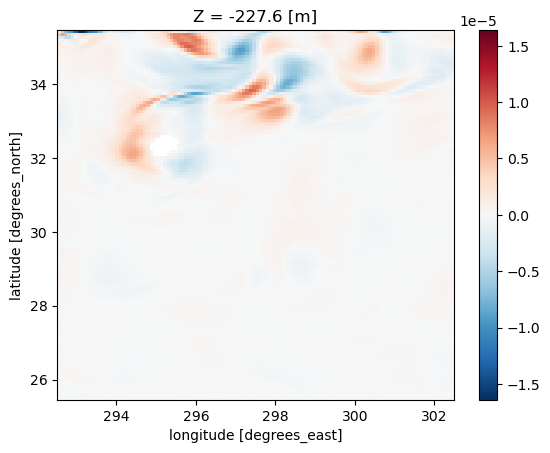

In [72]:
fig, ax = plt.subplots()
Aut.isel(nmemb=0,Z=0).plot(ax=ax)
# ax.set_title(r"MtE")
plt.show()

In [74]:
Auterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                      coords={'nmemb':nmembs,'Z':upC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
Avterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                      coords={'nmemb':nmembs,'Z':vpC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
uterb = xr.DataArray(np.ones_like(ubC), dims=ubC.dims,
                     coords={'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
vterb = xr.DataArray(np.ones_like(vbC), dims=vbC.dims,
                     coords={'Z':vpC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
        

for iz in range(len(upC.Z)):
    uterb.isel(Z=iz)[:] = griddata((xT, yT), 
                                   (ubC*ds.rA).isel(Z=iz).values.flatten(),
                                   (xxx, yyy) 
                                  ).T 
    vterb.isel(Z=iz)[:] = griddata((xT, yT), 
                                   (vbC*ds.rA).isel(Z=iz).values.flatten(),
                                   (xxx, yyy) 
                                  ).T
    for nn in range(len(nmembs)):
        Auterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                 (Aut*ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                 (xxx, yyy) 
                                                ).T 
        Avterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                 (Avt*ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                 (xxx, yyy) 
                                                ).T 


uterb = uterb / rAterp
vterb = vterb / rAterp        
Auterp = Auterp / rAterp
Avterp = Avterp / rAterp
            
ntheta = 36

iso_UA = xwavelet.wvlt_cross_spectrum(
                    uterb, Auterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
        )
iso_VA = xwavelet.wvlt_cross_spectrum(
                    vterb, Avterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
        )

        
dsave = iso_UA.to_dataset(name='iso_uA')
dsave['iso_vA'] = iso_VA
dsave.encoding = {}
# fname = op.join(savedir,'isoDiags-MtE_region%02d_1967-01-01.zarr' % reg)
fname = op.join(savedir,'isoDiags-MtE_region%02d_%010d.zarr' % (reg,iiter))
dsave.to_zarr(fname, mode='w')
dsave.close()

In [20]:
Auinterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                      coords={'nmemb':nmembs,'Z':upC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
Avinterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                      coords={'nmemb':nmembs,'Z':vpC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
uinterb = xr.DataArray(np.ones_like(ubC), dims=ubC.dims,
                     coords={'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
vinterb = xr.DataArray(np.ones_like(vbC), dims=vbC.dims,
                     coords={'Z':vpC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
        

for iz in range(len(upC.Z)):
    uinterb.isel(Z=iz)[:] = griddata((xT, yT), 
                                     (ubC.interpolate_na(dim='YC').interpolate_na(dim='XC'
                                                                                 ).fillna(0.) 
                                      * ds.rA
                                     ).isel(Z=iz).values.flatten(),
                                     (xxx, yyy) 
                                    ).T 
    vinterb.isel(Z=iz)[:] = griddata((xT, yT), 
                                     (vbC.interpolate_na(dim='YC').interpolate_na(dim='XC'
                                                                                 ).fillna(0.) 
                                      * ds.rA
                                     ).isel(Z=iz).values.flatten(),
                                     (xxx, yyy) 
                                    ).T
    for nn in range(len(nmembs)):
        Auinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                 (Aut.interpolate_na(dim='YC'
                                                                    ).interpolate_na(dim='XC'
                                                                                    ).fillna(0.) 
                                                  * ds.rA
                                                 ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 
        Avinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                 (Avt.interpolate_na(dim='YC'
                                                                    ).interpolate_na(dim='XC'
                                                                                    ).fillna(0.) 
                                                  * ds.rA
                                                 ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 

uinterb = uinterb / rAterp
vinterb = vinterb / rAterp        
Auinterp = Auinterp / rAterp
Avinterp = Avinterp / rAterp

dsF = xr.open_zarr(op.join(savedir,'crossFourierDiags_u_region%02d_1967-01-01.zarr' 
                           % reg)
                  )
cs_uA = xr.ones_like(dsF.cs_uT)
cs_vA = xr.ones_like(dsF.cs_uT)
for i in range(len(nmembs)):
    cs_uA[i] = xrft.cross_spectrum(
                        uinterb.chunk({'YC':-1,'XC':-1}), 
                        Auinterp.isel(nmemb=i).chunk({'YC':-1,'XC':-1}), 
                        dim=["YC", "XC"], window='hann', true_phase=True, 
                        window_correction=True
            )
    cs_vA[i] = xrft.cross_spectrum(
                        vinterb.chunk({'YC':-1,'XC':-1}), 
                        Avinterp.isel(nmemb=i).chunk({'YC':-1,'XC':-1}), 
                        dim=["YC", "XC"], window='hann', true_phase=True, 
                        window_correction=True
            )

dsave = cs_uA.to_dataset(name='MtEu')
dsave['MtEv'] = cs_vA
dsave.encoding = {}
fname = op.join(savedir,'crossFourierDiags-MtE_region%02d_1967-01-01.zarr' % reg)
print(fname)
dsave.to_zarr(fname, mode='w')
dsave.close()

/tank/topog/tuchida/Wavelet-spectrum/crossFourierDiags-MtE_region00_1967-01-01.zarr


## Shear prod.

In [25]:
xA = (ds.dyG * ds.drF).reset_coords(drop=True)
yA = (ds.dxG * ds.drF).reset_coords(drop=True)

upTrans = up * xA
vpTrans = vp * yA
rpTrans = grid.interp(wp,'X',boundary='extend') * ds.rAw
Auub = (grid.interp(upTrans,'X',boundary='extend')
        * grid.interp(ub,'X',boundary='extend')
       )
Avub = (grid.interp(vpTrans,'X',boundary='extend')
        * grid.interp(ub,'Y',boundary='extend')
       )
Awub = (rpTrans
        * grid.interp(ub,'Z',boundary='extend')
       )
rpTrans = grid.interp(wp,'Y',boundary='extend') * ds.rAs
Auvb = (grid.interp(upTrans,'Y',boundary='extend')
        * grid.interp(vb,'X',boundary='extend')
       )
Avvb = (grid.interp(vpTrans,'Y',boundary='extend')
        * grid.interp(vb,'Y',boundary='extend')
       )
Awvb = (rpTrans
        * grid.interp(vb,'Z',boundary='extend')
       )
Aut = grid.interp(((grid.diff(Auub,'X',boundary='extend')
                    + grid.diff(Avub,'Y',boundary='extend')
                    - grid.diff(Awub,'Z',boundary='extend')
                   ) / ds.drF/ds.rAw
                  ).reset_coords(drop=True),
                  'X',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).compute()
Avt = grid.interp(((grid.diff(Auvb,'X',boundary='extend')
                    + grid.diff(Avvb,'Y',boundary='extend')
                    - grid.diff(Awvb,'Z',boundary='extend')
                   ) / ds.drF/ds.rAs
                  ).reset_coords(drop=True),
                  'Y',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).compute()

In [100]:
Auterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                      coords={'nmemb':nmembs,'Z':upC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
Avterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                      coords={'nmemb':nmembs,'Z':vpC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
        

for iz in range(len(upC.Z)):
    for nn in range(len(nmembs)):
        Auterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                               (Aut*ds.rA
                                               ).isel(nmemb=nn,Z=iz).values.flatten(),
                                               (xxx, yyy) 
                                              ).T 
        Avterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                               (Avt*ds.rA
                                               ).isel(nmemb=nn,Z=iz).values.flatten(),
                                               (xxx, yyy) 
                                              ).T 
        
Auterp = Auterp / rAterp
Avterp = Avterp / rAterp
            
ntheta = 36

iso_UA = xwavelet.wvlt_cross_spectrum(
                            uterp, Auterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
         )
iso_VA = xwavelet.wvlt_cross_spectrum(
                            vterp, Avterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
         )

        
dsave = iso_UA.to_dataset(name='iso_SPu')
dsave['iso_SPv'] = iso_VA
dsave.encoding = {}
# fname = op.join(savedir,'isoDiags-MtE_region%02d_1967-01-01.zarr' % reg)
fname = op.join(spec,'Points/%s/%010d/isoDiags-SP.zarr' 
                % (sreg[reg],iiter))
dsave.to_zarr(fname, mode='w')
dsave.close()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


In [21]:
xA = (ds.dyG * ds.drF).reset_coords(drop=True)
yA = (ds.dxG * ds.drF).reset_coords(drop=True)

uTrans = ds.UVEL * xA
vTrans = ds.VVEL * yA
# rTrans = grid.interp(ds.WVEL,'X',boundary='extend') * ds.rAw
Auup = (grid.interp(uTrans,'X',boundary='extend')
        * grid.interp(up,'X',boundary='extend')
       )
Avup = (grid.interp(vTrans,'X',boundary='extend')
        * grid.interp(up,'Y',boundary='extend')
       )
# Awup = (rTrans
#         * grid.interp(up,'Z',boundary='extend')
#        )
# rTrans = grid.interp(ds.WVEL,'Y',boundary='extend') * ds.rAs
Auvp = (grid.interp(uTrans,'Y',boundary='extend')
        * grid.interp(vp,'X',boundary='extend')
       )
Avvp = (grid.interp(vTrans,'Y',boundary='extend')
        * grid.interp(vp,'Y',boundary='extend')
       )
# Awvp = (rTrans
#         * grid.interp(vp,'Z',boundary='extend')
#        )
Auh = grid.interp(((grid.diff(Auup,'X',boundary='extend')
                    + grid.diff(Avup,'Y',boundary='extend')
                    # - grid.diff(Awup,'Z',boundary='extend')
                   ) / ds.drF/ds.rAw
                  ).reset_coords(drop=True),
                  'X',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).compute()
Avh = grid.interp(((grid.diff(Auvp,'X',boundary='extend')
                    + grid.diff(Avvp,'Y',boundary='extend')
                    # - grid.diff(Awvp,'Z',boundary='extend')
                   ) / ds.drF/ds.rAs
                  ).reset_coords(drop=True),
                  'Y',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).compute()

In [22]:
Auterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                      coords={'nmemb':nmembs,'Z':upC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
Avterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                      coords={'nmemb':nmembs,'Z':vpC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
        

for iz in range(len(upC.Z)):
    for nn in range(len(nmembs)):
        Auterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                               (Auh*ds.rA
                                               ).isel(nmemb=nn,Z=iz).values.flatten(),
                                               (xxx, yyy) 
                                              ).T 
        Avterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                               (Avh*ds.rA
                                               ).isel(nmemb=nn,Z=iz).values.flatten(),
                                               (xxx, yyy) 
                                              ).T 
        
Auterp = Auterp / rAterp
Avterp = Avterp / rAterp
            
ntheta = 36

iso_UA = xwavelet.wvlt_cross_spectrum(
                            uterp, Auterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
         )
iso_VA = xwavelet.wvlt_cross_spectrum(
                            vterp, Avterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
         )

        
dsave = iso_UA.to_dataset(name='iso_uuu')
dsave['iso_vuv'] = iso_VA
dsave.encoding = {}
# fname = op.join(savedir,'isoDiags-MtE_region%02d_1967-01-01.zarr' % reg)
fname = op.join(spec,'Points/%s/%010d/isoDiags_u-v-hor-adv.zarr' 
                % (sreg[reg],iiter))
dsave.to_zarr(fname, mode='w')
dsave.close()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


In [26]:
Auinterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                      coords={'nmemb':nmembs,'Z':upC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
           )
Avinterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                      coords={'nmemb':nmembs,'Z':vpC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
           )

for iz in range(len(upC.Z)):
    for nn in range(len(nmembs)):
        Auinterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                (Aut.interpolate_na(dim='YC'
                                                        ).interpolate_na(dim='XC'
                                                                    ).fillna(0.)*ds.rA
                                                ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 
        Avinterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                (Avt.interpolate_na(dim='YC'
                                                        ).interpolate_na(dim='XC'
                                                                    ).fillna(0.)*ds.rA
                                                ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                (xxx, yyy) 
                                               ).T 


Auinterp = Auinterp / rAterp
Avinterp = Avinterp / rAterp

In [27]:
cs_AU = xrft.cross_spectrum(uinterp, Auinterp, 
                            dim=["YC", "XC"], window='hann', true_phase=True, 
                            window_correction=True
                 )
cs_AV = xrft.cross_spectrum(vinterp, Avinterp, 
                            dim=["YC", "XC"], window='hann', true_phase=True, 
                            window_correction=True
                 )

dsave = cs_AU.to_dataset(name='cs_SPu')
dsave['cs_SPv'] = cs_AV
dsave.encoding = {}
fname = op.join(spec,'Points/%s/%010d/crossFourierDiags-SP.zarr' 
                % (sreg[reg],iiter))
print(fname)
dsave.to_zarr(fname, mode='w')
dsave.close()

/tank/spectre/tuchida/NA-wavelets/Points/F/0001419120/crossFourierDiags-SP.zarr


In [37]:
ubx = (grid.diff(ub*ds.dyG*ds.drF,'X',boundary='extend') / ds.rA/ds.drF).isel(Z=[14,18,24]).load()
uby = (grid.interp(grid.interp(grid.diff(ub*ds.dxC*ds.drF,'Y',boundary='extend') / ds.rAz/ds.drF,
                               'X',boundary='extend'),
                   'Y',boundary='extend')).isel(Z=[14,18,24]).load()
ubz = (-grid.interp(grid.interp(grid.diff(ub,'Z',boundary='extend') / ds.drC.data[:-1,np.newaxis,np.newaxis],
                                'Z',boundary='extend'),
                    'X',boundary='extend')).isel(Z=[14,18,24]).load()
vby = (grid.diff(vb*ds.dyC*ds.drF,'Y',boundary='extend') / ds.rA/ds.drF).isel(Z=[14,18,24]).load()
vbx = (grid.interp(grid.interp(grid.diff(vb*ds.dxG*ds.drF,'X',boundary='extend') / ds.rAz/ds.drF,
                               'X',boundary='extend'),
                   'Y',boundary='extend')).isel(Z=[14,18,24]).load()
vbz = (-grid.interp(grid.interp(grid.diff(vb,'Z',boundary='extend') / ds.drC.data[:-1,np.newaxis,np.newaxis],
                                'Z',boundary='extend'),
                    'Y',boundary='extend')).isel(Z=[14,18,24]).load()
# print(ubx,uby,vby,vbx)

upup = grid.interp(up**2,'X',boundary='extend').isel(Z=[14,18,24]).load()
vpup = (grid.interp(vp,'Y',boundary='extend') 
        * grid.interp(up,'X',boundary='extend')).isel(Z=[14,18,24]).load()
wpup = (grid.interp(wp,'Z',boundary='extend') 
        * grid.interp(up,'X',boundary='extend')).isel(Z=[14,18,24]).load()
vpvp = grid.interp(vp**2,'Y',boundary='extend').isel(Z=[14,18,24]).load()
wpvp = (grid.interp(wp,'Z',boundary='extend') 
        * grid.interp(vp,'Y',boundary='extend')).isel(Z=[14,18,24]).load()

In [38]:
uputerp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                      coords={'nmemb':nmembs,'Z':upC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
vputerp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                      coords={'nmemb':nmembs,'Z':vpC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
wputerp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                      coords={'nmemb':nmembs,'Z':vpC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
vpvterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                      coords={'nmemb':nmembs,'Z':vpC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
wpvterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                      coords={'nmemb':nmembs,'Z':vpC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                      )
uterbx = xr.DataArray(np.ones_like(ubC), dims=ubC.dims,
                     coords={'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
uterby = xr.DataArray(np.ones_like(ubC), dims=ubC.dims,
                     coords={'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
uterbz = xr.DataArray(np.ones_like(ubC), dims=ubC.dims,
                     coords={'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
vterbx = xr.DataArray(np.ones_like(ubC), dims=ubC.dims,
                     coords={'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
vterby = xr.DataArray(np.ones_like(ubC), dims=ubC.dims,
                     coords={'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
vterbz = xr.DataArray(np.ones_like(ubC), dims=ubC.dims,
                     coords={'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
        

for iz in range(len(upC.Z)):
    uterbx.isel(Z=iz)[:] = griddata((xT, yT), 
                                   (ubx*ds.rA).isel(Z=iz).values.flatten(),
                                   (xxx, yyy) 
                                  ).T 
    uterby.isel(Z=iz)[:] = griddata((xT, yT), 
                                   (uby*ds.rA).isel(Z=iz).values.flatten(),
                                   (xxx, yyy) 
                                  ).T 
    uterbz.isel(Z=iz)[:] = griddata((xT, yT), 
                                   (ubz*ds.rA).isel(Z=iz).values.flatten(),
                                   (xxx, yyy) 
                                  ).T 
    vterbx.isel(Z=iz)[:] = griddata((xT, yT), 
                                   (vbx*ds.rA).isel(Z=iz).values.flatten(),
                                   (xxx, yyy) 
                                  ).T 
    vterby.isel(Z=iz)[:] = griddata((xT, yT), 
                                   (vby*ds.rA).isel(Z=iz).values.flatten(),
                                   (xxx, yyy) 
                                  ).T 
    vterbz.isel(Z=iz)[:] = griddata((xT, yT), 
                                   (vbz*ds.rA).isel(Z=iz).values.flatten(),
                                   (xxx, yyy) 
                                  ).T 
    for nn in range(len(nmembs)):
        uputerp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                 (upup*ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                 (xxx, yyy) 
                                                ).T 
        vputerp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                 (vpup*ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                 (xxx, yyy) 
                                                ).T 
        wputerp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                 (wpup*ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                 (xxx, yyy) 
                                                ).T 
        vpvterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                 (vpvp*ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                 (xxx, yyy) 
                                                ).T 
        wpvterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                 (wpvp*ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                 (xxx, yyy) 
                                                ).T 


uterbx = uterbx / rAterp
vterbx = vterbx / rAterp    
uterby = uterby / rAterp
vterby = vterby / rAterp    
uterbz = uterbz / rAterp
vterbz = vterbz / rAterp    
uputerp = uputerp / rAterp
vputerp = vputerp / rAterp
wputerp = wputerp / rAterp
vpvterp = vpvterp / rAterp
wpvterp = wpvterp / rAterp
            
ntheta = 36

iso_upupUx = xwavelet.wvlt_cross_spectrum(
                    uputerp, uterbx, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
        )
iso_vpupUy = xwavelet.wvlt_cross_spectrum(
                    vputerp, uterby, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
        )
iso_wpupUz = xwavelet.wvlt_cross_spectrum(
                    wputerp, uterbz, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
        )
iso_upvpVx = xwavelet.wvlt_cross_spectrum(
                    vputerp, vterbx, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
        )
iso_vpvpVy = xwavelet.wvlt_cross_spectrum(
                    vpvterp, vterby, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
        )
iso_wpvpVz = xwavelet.wvlt_cross_spectrum(
                    wpvterp, vterbz, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
        )

        
dsave = iso_upupUx.to_dataset(name='upupUx')
dsave['vpupUy'] = iso_vpupUy
dsave['wpupUz'] = iso_wpupUz
dsave['upvpVx'] = iso_upvpVx
dsave['vpvpVy'] = iso_vpvpVy
dsave['wpvpVz'] = iso_wpvpVz
dsave.encoding = {}
dsave.to_zarr(op.join(savedir,'isoDiags-MtE_reenvisioned_region%02d_1967-01-01.zarr' % reg),
                      mode='w')
dsave.close()

In [39]:
upuinterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                      coords={'nmemb':nmembs,'Z':upC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
vpuinterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                      coords={'nmemb':nmembs,'Z':vpC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
wpuinterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                      coords={'nmemb':nmembs,'Z':vpC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
vpvinterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                      coords={'nmemb':nmembs,'Z':vpC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                     )
wpvinterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                      coords={'nmemb':nmembs,'Z':vpC.Z,
                              'YC':np.arange(0,N[-2]*dy,dy),
                              'XC':np.arange(0,N[-1]*dx,dx)}
                      )
uinterbx = xr.DataArray(np.ones_like(ubC), dims=ubC.dims,
                     coords={'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
uinterby = xr.DataArray(np.ones_like(ubC), dims=ubC.dims,
                     coords={'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
uinterbz = xr.DataArray(np.ones_like(ubC), dims=ubC.dims,
                     coords={'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
vinterbx = xr.DataArray(np.ones_like(ubC), dims=ubC.dims,
                     coords={'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
vinterby = xr.DataArray(np.ones_like(ubC), dims=ubC.dims,
                     coords={'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
vinterbz = xr.DataArray(np.ones_like(ubC), dims=ubC.dims,
                     coords={'Z':upC.Z,
                             'YC':np.arange(0,N[-2]*dy,dy),
                             'XC':np.arange(0,N[-1]*dx,dx)}
                    )
        

for iz in range(len(upC.Z)):
    uinterbx.isel(Z=iz)[:] = griddata((xT, yT), 
                                   (ubx.interpolate_na(dim='YC').interpolate_na(dim='XC'
                                                                               ).fillna(0.) 
                                    *ds.rA).isel(Z=iz).values.flatten(),
                                   (xxx, yyy) 
                                  ).T 
    uinterby.isel(Z=iz)[:] = griddata((xT, yT), 
                                   (uby.interpolate_na(dim='YC').interpolate_na(dim='XC'
                                                                               ).fillna(0.) 
                                    *ds.rA).isel(Z=iz).values.flatten(),
                                   (xxx, yyy) 
                                  ).T 
    uinterbz.isel(Z=iz)[:] = griddata((xT, yT), 
                                   (ubz.interpolate_na(dim='YC').interpolate_na(dim='XC'
                                                                               ).fillna(0.) 
                                    *ds.rA).isel(Z=iz).values.flatten(),
                                   (xxx, yyy) 
                                  ).T 
    vinterbx.isel(Z=iz)[:] = griddata((xT, yT), 
                                   (vbx.interpolate_na(dim='YC').interpolate_na(dim='XC'
                                                                               ).fillna(0.) 
                                    *ds.rA).isel(Z=iz).values.flatten(),
                                   (xxx, yyy) 
                                  ).T 
    vinterby.isel(Z=iz)[:] = griddata((xT, yT), 
                                   (vby.interpolate_na(dim='YC').interpolate_na(dim='XC'
                                                                               ).fillna(0.) 
                                    *ds.rA).isel(Z=iz).values.flatten(),
                                   (xxx, yyy) 
                                  ).T 
    vinterbz.isel(Z=iz)[:] = griddata((xT, yT), 
                                   (vbz.interpolate_na(dim='YC').interpolate_na(dim='XC'
                                                                               ).fillna(0.) 
                                    *ds.rA).isel(Z=iz).values.flatten(),
                                   (xxx, yyy) 
                                  ).T 
    for nn in range(len(nmembs)):
        upuinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                 (upup.interpolate_na(dim='YC').interpolate_na(dim='XC'
                                                                                 ).fillna(0.) 
                                                  *ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                 (xxx, yyy) 
                                                ).T 
        vpuinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                 (vpup.interpolate_na(dim='YC').interpolate_na(dim='XC'
                                                                                 ).fillna(0.) 
                                                  *ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                 (xxx, yyy) 
                                                ).T 
        wpuinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                 (wpup.interpolate_na(dim='YC').interpolate_na(dim='XC'
                                                                                 ).fillna(0.) 
                                                  *ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                 (xxx, yyy) 
                                                ).T 
        vpvinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                 (vpvp.interpolate_na(dim='YC').interpolate_na(dim='XC'
                                                                                 ).fillna(0.) 
                                                  *ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                 (xxx, yyy) 
                                                ).T 
        wpvinterp.isel(nmemb=nn,Z=iz)[:] = griddata((xT, yT), 
                                                 (wpvp.interpolate_na(dim='YC').interpolate_na(dim='XC'
                                                                                 ).fillna(0.) 
                                                  *ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
                                                 (xxx, yyy) 
                                                ).T 


uinterbx = uinterbx / rAterp
vinterbx = vinterbx / rAterp    
uinterby = uinterby / rAterp
vinterby = vinterby / rAterp    
uinterbz = uinterbz / rAterp
vinterbz = vinterbz / rAterp    
upuinterp = upuinterp / rAterp
vpuinterp = vpuinterp / rAterp
wpuinterp = wpuinterp / rAterp
vpvinterp = vpvinterp / rAterp
wpvinterp = wpvinterp / rAterp
            

for i in range(len(nmembs)):
    if i == 0:
        cs_upupUx = xrft.cross_spectrum(
                            upuinterp.isel(nmemb=i).chunk({'YC':-1,'XC':-1}), 
                            uinterbx.chunk({'YC':-1,'XC':-1}), 
                            dim=["YC", "XC"], window='hann', true_phase=True, 
                            window_correction=True
                )
        cs_vpupUy = xrft.cross_spectrum(
                            vpuinterp.isel(nmemb=i).chunk({'YC':-1,'XC':-1}), 
                            uinterby.chunk({'YC':-1,'XC':-1}), 
                            dim=["YC", "XC"], window='hann', true_phase=True, 
                            window_correction=True
                )
        cs_wpupUz = xrft.cross_spectrum(
                            wpuinterp.isel(nmemb=i).chunk({'YC':-1,'XC':-1}), 
                            uinterbz.chunk({'YC':-1,'XC':-1}), 
                            dim=["YC", "XC"], window='hann', true_phase=True, 
                            window_correction=True
                )
        cs_upvpVx = xrft.cross_spectrum(
                            vpuinterp.isel(nmemb=i).chunk({'YC':-1,'XC':-1}), 
                            vinterbx.chunk({'YC':-1,'XC':-1}), 
                            dim=["YC", "XC"], window='hann', true_phase=True, 
                            window_correction=True
                )
        cs_vpvpVy = xrft.cross_spectrum(
                            vpvinterp.isel(nmemb=i).chunk({'YC':-1,'XC':-1}), 
                            vinterby.chunk({'YC':-1,'XC':-1}), 
                            dim=["YC", "XC"], window='hann', true_phase=True, 
                            window_correction=True
                )
        cs_wpvpVz = xrft.cross_spectrum(
                            wpvinterp.isel(nmemb=i).chunk({'YC':-1,'XC':-1}), 
                            vinterbz.chunk({'YC':-1,'XC':-1}), 
                            dim=["YC", "XC"], window='hann', true_phase=True, 
                            window_correction=True
                )
    else:
        cs_upupUx = xr.concat([cs_upupUx,
                               xrft.cross_spectrum(
                                        upuinterp.isel(nmemb=i).chunk({'YC':-1,'XC':-1}), 
                                        uinterbx.chunk({'YC':-1,'XC':-1}), 
                                        dim=["YC", "XC"], window='hann', true_phase=True, 
                                        window_correction=True
                            )
                              ],'nmemb')
        cs_vpupUy = xr.concat([cs_vpupUy,
                               xrft.cross_spectrum(
                                        vpuinterp.isel(nmemb=i).chunk({'YC':-1,'XC':-1}), 
                                        uinterby.chunk({'YC':-1,'XC':-1}), 
                                        dim=["YC", "XC"], window='hann', true_phase=True, 
                                        window_correction=True
                            )
                              ],'nmemb')
        cs_wpupUz = xr.concat([cs_wpupUz,
                               xrft.cross_spectrum(
                                        wpuinterp.isel(nmemb=i).chunk({'YC':-1,'XC':-1}), 
                                        uinterbz.chunk({'YC':-1,'XC':-1}), 
                                        dim=["YC", "XC"], window='hann', true_phase=True, 
                                        window_correction=True
                            )
                              ],'nmemb')
        cs_upvpVx = xr.concat([cs_upvpVx,
                               xrft.cross_spectrum(
                                        vpuinterp.isel(nmemb=i).chunk({'YC':-1,'XC':-1}), 
                                        vinterbx.chunk({'YC':-1,'XC':-1}), 
                                        dim=["YC", "XC"], window='hann', true_phase=True, 
                                        window_correction=True
                            )
                              ],'nmemb')
        cs_vpvpVy = xr.concat([cs_vpvpVy,
                               xrft.cross_spectrum(
                                        vpvinterp.isel(nmemb=i).chunk({'YC':-1,'XC':-1}), 
                                        vinterby.chunk({'YC':-1,'XC':-1}), 
                                        dim=["YC", "XC"], window='hann', true_phase=True, 
                                        window_correction=True
                            )
                              ],'nmemb')
        cs_wpvpVz = xr.concat([cs_wpvpVz,
                               xrft.cross_spectrum(
                                        wpvinterp.isel(nmemb=i).chunk({'YC':-1,'XC':-1}), 
                                        vinterbz.chunk({'YC':-1,'XC':-1}), 
                                        dim=["YC", "XC"], window='hann', true_phase=True, 
                                        window_correction=True
                            )
                              ],'nmemb')

dsave = cs_upupUx.to_dataset(name='upupUx')
dsave['vpupUy'] = cs_vpupUy
dsave['wpupUz'] = cs_wpupUz
dsave['upvpVx'] = cs_upvpVx
dsave['vpvpVy'] = cs_vpvpVy
dsave['wpvpVz'] = cs_wpvpVz
dsave.coords['nmemb'] = nmembs
dsave.encoding = {}
fname = op.join(savedir,'crossFourierDiags-MtE_reenvisioned_region%02d_1967-01-01.zarr' % reg)
print(fname)
dsave.to_zarr(fname, mode='w')
dsave.close()

/tank/topog/tuchida/Wavelet-spectrum/crossFourierDiags-MtE_reenvisioned_region00_1967-01-01.zarr


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'scipy' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'scipy' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)


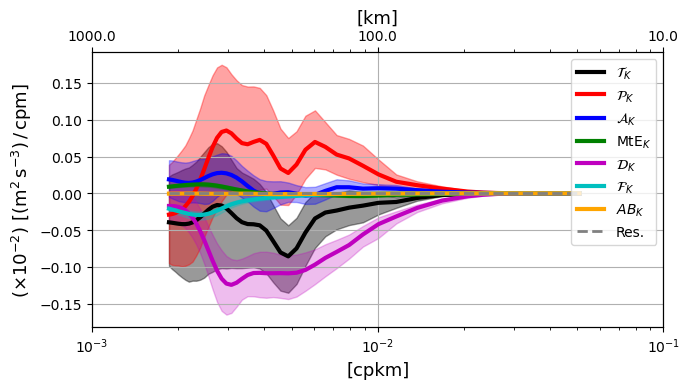

In [23]:
nz = 0
iiter = 1419120

for reg in range(5,6):

    # if reg == 0:
    #     ds0 = xr.open_dataset(op.join(savedir,'isoDiags_u_region%02d_1967-01-01.zarr' 
    #                                   % (reg)))
    #     ds1 = xr.open_dataset(op.join(savedir,'isoDiags_v_region%02d_1967-01-01.zarr' 
    #                                   % (reg)))
    #     ds2 = xr.open_dataset(op.join(savedir,'isoDiags-ext_u_region%02d_1967-01-01.zarr' 
    #                                   % (reg)))
    #     ds3 = xr.open_dataset(op.join(savedir,'isoDiags-ext_v_region%02d_1967-01-01.zarr' 
    #                                   % (reg)))
    # else:
    #     ds0 = xr.open_dataset(op.join(savedir,'isoDiags_u_region%02d_%010d.zarr' 
    #                                   % (reg,iiter)))
    #     ds1 = xr.open_dataset(op.join(savedir,'isoDiags_v_region%02d_%010d.zarr' 
    #                                   % (reg,iiter)))
    #     ds2 = xr.open_dataset(op.join(savedir,'isoDiags-ext_u_region%02d_%010d.zarr' 
    #                                   % (reg,iiter)))
    #     ds3 = xr.open_dataset(op.join(savedir,'isoDiags-ext_v_region%02d_%010d.zarr' 
    #                                   % (reg,iiter)))
    ds0 = xr.open_dataset(op.join(spec,'Points/%s/%010d/isoDiags_u.zarr' 
                                  % (sreg[reg],iiter)))
    ds1 = xr.open_dataset(op.join(spec,'Points/%s/%010d/isoDiags_v.zarr' 
                                  % (sreg[reg],iiter)))
    ds2 = xr.open_dataset(op.join(spec,'Points/%s/%010d/isoDiags-ext_u.zarr' 
                                  % (sreg[reg],iiter)))
    ds3 = xr.open_dataset(op.join(spec,'Points/%s/%010d/isoDiags-ext_v.zarr' 
                                  % (sreg[reg],iiter)))
    dtau = xr.open_zarr(op.join(spec,'Points/%s/%010d/isoDiags_u_tend-adv.zarr' 
                                % (sreg[reg],iiter)))
    dtav = xr.open_zarr(op.join(spec,'Points/%s/%010d/isoDiags_v_tend-adv.zarr' 
                                % (sreg[reg],iiter)))
    
    datas = ((dtau.iso_uT + dtav.iso_vT
        # ds0.iso_uT + ds1.iso_vT
    ).isel(Z=nz).sum('angle')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    rng = np.random.default_rng()
    Tres = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
    datas = ((ds0.iso_uAB + ds1.iso_vAB).isel(Z=nz).sum('angle')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    rng = np.random.default_rng()
    ABres = bootstrap(datas, np.mean, confidence_level=0.95,
                      random_state=rng)
    datas = ((ds0.iso_uP + ds1.iso_vP + ds2.iso_uE + ds3.iso_vE).isel(Z=nz).sum('angle')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    rng = np.random.default_rng()
    Pres = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
    datas = ((ds2.iso_uD + ds3.iso_vD).isel(Z=nz).sum('angle')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    rng = np.random.default_rng()
    Dres = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
        
    
    Tk = (dtau.iso_uT + dtav.iso_vT
          # ds0.iso_uT + ds1.iso_vT
         ).isel(Z=nz).mean(['nmemb']).sum('angle').compute()
    ABk = (ds0.iso_uAB + ds1.iso_vAB).isel(Z=nz).mean(['nmemb']).sum('angle').compute()
    
    Pk = (ds0.iso_uP + ds1.iso_vP + ds2.iso_uE + ds3.iso_vE
         ).isel(Z=nz).mean(['nmemb']).sum('angle').compute()
    Dk = (ds2.iso_uD + ds3.iso_vD).mean(['nmemb']).isel(Z=nz).sum('angle').compute()
    
    # ds4 = xr.open_dataset(op.join(savedir,
    #                               'isoDiags-MtE_reenvisioned_region%02d_1967-01-01.zarr' 
    #                               % reg))
    # MtE = -(ds4.upupUx + ds4.vpupUy + ds4.wpupUz
    #         + ds4.upvpVx + ds4.vpvpVy + ds4.wpvpVz
    #        )
    # if reg == 0:
    #     # ds4 = xr.open_dataset(op.join(savedir,'isoDiags-MtE_region%02d_1967-01-01.zarr' 
    #     #                               % reg))
    #     iiter = 1419120
    #     ds4 = xr.open_dataset(op.join(spec,'Z0452/Points/%s/%010d/isoDiags-SP.zarr' 
    #                                   % (sreg[reg],iiter))
    #                          )
    # else:
    #     # ds4 = xr.open_dataset(op.join(savedir,'isoDiags-MtE_region%02d_%010d.zarr' 
    #     #                               % (reg,iiter)))
    #     pass
    ds4 = xr.open_dataset(op.join(spec,'Points/%s/%010d/isoDiags-SP.zarr' 
                                  % (sreg[reg],iiter))
                         )
    # MtE = (ds4.iso_uA + ds4.iso_vA)
    SPu = ds4.iso_SPu
    SPv = ds4.iso_SPv
    SP = (SPu + SPv).isel(Z=nz)
    
    ds5 = xr.open_dataset(op.join(spec,'Points/%s/%010d/isoDiags_u_forcing.zarr' 
                                  % (sreg[reg],iiter))
                         )
    ds6 = xr.open_dataset(op.join(spec,'Points/%s/%010d/isoDiags_v_forcing.zarr' 
                                  % (sreg[reg],iiter))
                         )
    if nz == 0:
        datas = ((ds5.iso_uF + ds6.iso_vF).isel(Z=nz).sum('angle')
                 * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
        rng = np.random.default_rng()
        Fres = bootstrap(datas, np.mean, confidence_level=0.95,
                         random_state=rng)
        Fk = (ds5.iso_uF + ds6.iso_vF).mean(['nmemb']).isel(Z=nz).sum('angle').compute()
    
    # datas = (MtE.isel(Z=nz).sum('angle').transpose('nmemb','scale')
    #          * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    # rng = np.random.default_rng()
    # MtEres = bootstrap(datas, np.mean, confidence_level=0.95,
    #                    random_state=rng)
    datas = (SP.sum('angle').transpose('nmemb','scale')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    rng = np.random.default_rng()
    SPres = bootstrap(datas, np.mean, confidence_level=0.95,
                      random_state=rng)
    # datas = ((ds0.iso_uA + ds1.iso_vA - MtE).isel(Z=nz).sum('angle')
    #          * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    datas = (((dtau.iso_uA + dtav.iso_vA
        # ds0.iso_uA + ds1.iso_vA
    ).isel(Z=nz) + SP).sum('angle')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    rng = np.random.default_rng()
    Ares = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
    
    Ak = ((dtau.iso_uA + dtav.iso_vA
           # ds0.iso_uA + ds1.iso_vA
          ).isel(Z=nz)
          # - MtE
          + SP
         ).mean(['nmemb']).sum('angle').compute()
    # MtEk = MtE.mean(['nmemb']).sum('angle').compute()
    SPk = SP.mean(['nmemb']).sum('angle').compute()
    
    res = Tk/86400. - (Pk + (dtau.iso_uA + dtav.iso_vA
                             # ds0.iso_uA + ds1.iso_vA
                            ).isel(Z=nz).mean(['nmemb']).sum('angle').compute() 
                       + Dk + ABk
                      )
    if nz == 0:
        res -= Fk
            
    fig, ax = plt.subplots(figsize=(7,4))
    # fig, ax = plt.subplots(figsize=(7,6))
    fig.set_tight_layout(True)
    ax2 = ax.twiny()
    
    ax.fill_between((ds0.scale)**-1*1e3, Tres.confidence_interval.low/86400., 
                    Tres.confidence_interval.high/86400., 
                    alpha=.4, color='k')
    ax.fill_between((ds0.scale)**-1*1e3, Pres.confidence_interval.low, 
                    Pres.confidence_interval.high, 
                    alpha=.36, color='r')
    ax.fill_between((ds0.scale)**-1*1e3, Ares.confidence_interval.low, 
                    Ares.confidence_interval.high, 
                    alpha=.32, color='b')
    ax.fill_between((ds0.scale)**-1*1e3, -SPres.confidence_interval.high, 
                    -SPres.confidence_interval.low, 
                    alpha=.28, color='g')
    ax.fill_between((ds0.scale)**-1*1e3, Dres.confidence_interval.low, 
                    Dres.confidence_interval.high, 
                    alpha=.26, color='m')
    if nz == 0:
        ax.fill_between((ds0.scale)**-1*1e3, Fres.confidence_interval.low, 
                        Fres.confidence_interval.high, 
                        alpha=.26, color='c')
    ax.fill_between((ds0.scale)**-1*1e3, ABres.confidence_interval.low, 
                    ABres.confidence_interval.high, 
                    alpha=.24, color='orange')
    
    ax.plot((ds0.scale)**-1*1e3, Tk*np.diff(ds0.angle)[0]*2*1e2/86400.,
            'k', lw=3, label=r"$\mathcal{T}_K$")
    ax.plot((ds0.scale)**-1*1e3, Pk*np.diff(ds0.angle)[0]*2*1e2,
            'r', lw=3, label=r"$\mathcal{P}_K$")
    ax.plot((ds0.scale)**-1*1e3, Ak*np.diff(ds0.angle)[0]*2*1e2,
            'b', lw=3, label=r"$\mathcal{A}_K$")
    ax.plot((ds0.scale)**-1*1e3, -SPk*np.diff(ds0.angle)[0]*2*1e2,
            'g', lw=3, label=r"MtE$_K$")
    ax.plot((ds0.scale)**-1*1e3, Dk*np.diff(ds0.angle)[0]*2*1e2,
            'm', lw=3, label=r"$\mathcal{D}_K$")
    if nz == 0:
        ax.plot((ds0.scale)**-1*1e3, Fk*np.diff(ds0.angle)[0]*2*1e2,
                'c', lw=3, label=r"$\mathcal{F}_K$")
    ax.plot((ds0.scale)**-1*1e3, ABk*np.diff(ds0.angle)[0]*2*1e2,
            c='orange', lw=3, label=r"$AB_K$")
    ax.plot((ds0.scale)**-1*1e3, res*np.diff(ds0.angle)[0]*2*1e2, 
            c='grey', ls='--', lw=2, label=r"Res.")

    ax.set_xscale('log')
#             ax.set_yscale('log')
    ax2.set_xscale('log')
#             ax2.set_yscale('log')
    ax.set_xlim([1e-3,1e-1])
    ax2.set_xlim([1e-3,1e-1])
    ax2.set_xticks([1e-3,1e-2,1e-1])
    ax2.set_xticklabels([1e3,1e2,1e1])
    # Meta = np.abs(Pk.isel(Z=0)).max(skipna=True).values*1e3
    # ax.set_ylim([-Meta*.7, Meta*.7])
    ax.set_xlabel(r"[cpkm]", fontsize=13)
    ax2.set_xlabel(r"[km]", fontsize=13)
    ax.set_ylabel(r"($\times 10^{-2}$) [(m$^2\,$s$^{-3})\,/\,$cpm]", fontsize=13)
    ax.grid(True)
    if reg % 5 == 0:
        ax.legend(loc='upper right', fontsize=10)
    plt.savefig(op.join(spec,'Figs/SpecKEbudget_Region%02d_Z000_%010d.pdf' 
                        % (reg,iiter)))
    plt.show()
    
    ds0.close()
    ds1.close()
    ds2.close()
    ds3.close()
    ds4.close()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'scipy' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'scipy' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)


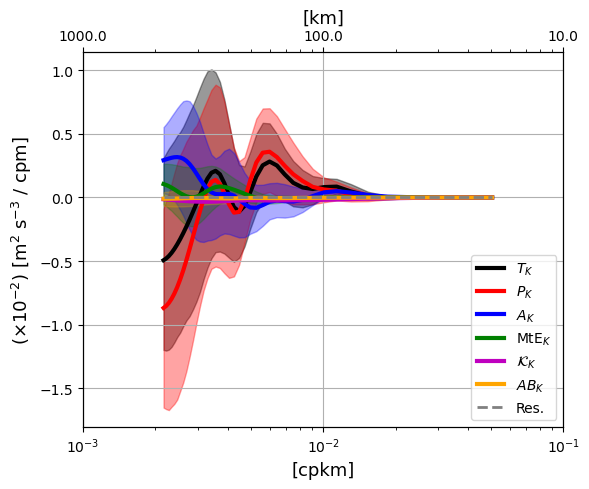

In [75]:
nz = 1

for reg in range(0,len(xs)-5):
    # ds0 = xr.open_dataset(op.join(savedir,'isoDiags_u_region%02d_1967-01-01.zarr' % reg))
    # ds1 = xr.open_dataset(op.join(savedir,'isoDiags_v_region%02d_1967-01-01.zarr' % reg))
    # ds2 = xr.open_dataset(op.join(savedir,'isoDiags-ext_u_region%02d_1967-01-01.zarr' % reg))
    # ds3 = xr.open_dataset(op.join(savedir,'isoDiags-ext_v_region%02d_1967-01-01.zarr' % reg))
    ds0 = xr.open_dataset(op.join(savedir,'isoDiags_u_region%02d_%010d.zarr' 
                                  % (reg,iiter)))
    ds1 = xr.open_dataset(op.join(savedir,'isoDiags_v_region%02d_%010d.zarr' 
                                  % (reg,iiter)))
    ds2 = xr.open_dataset(op.join(savedir,'isoDiags-ext_u_region%02d_%010d.zarr' 
                                  % (reg,iiter)))
    ds3 = xr.open_dataset(op.join(savedir,'isoDiags-ext_v_region%02d_%010d.zarr' 
                                  % (reg,iiter)))
    
    datas = ((ds0.iso_uT + ds1.iso_vT).isel(Z=nz).sum('angle')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    rng = np.random.default_rng()
    Tres = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
    datas = ((ds0.iso_uAB + ds1.iso_vAB).isel(Z=nz).sum('angle')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    rng = np.random.default_rng()
    ABres = bootstrap(datas, np.mean, confidence_level=0.95,
                      random_state=rng)
    datas = ((ds0.iso_uP + ds1.iso_vP + ds2.iso_uE + ds3.iso_vE).isel(Z=nz).sum('angle')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    rng = np.random.default_rng()
    Pres = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
    datas = ((ds2.iso_uD + ds3.iso_vD).isel(Z=nz).sum('angle')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    rng = np.random.default_rng()
    Dres = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
        
    
    Tk = (ds0.iso_uT + ds1.iso_vT).mean(['nmemb']).sum('angle').compute()
    ABk = (ds0.iso_uAB + ds1.iso_vAB).mean(['nmemb']).sum('angle').compute()
    
    Pk = (ds0.iso_uP + ds1.iso_vP + ds2.iso_uE + ds3.iso_vE).mean(['nmemb']).sum('angle').compute()
    Dk = (ds2.iso_uD + ds3.iso_vD).mean(['nmemb']).sum('angle').compute()
    
    # ds4 = xr.open_dataset(op.join(savedir,
    #                               'isoDiags-MtE_reenvisioned_region%02d_1967-01-01.zarr' 
    #                               % reg))
    # MtE = -(ds4.upupUx + ds4.vpupUy + ds4.wpupUz
    #         + ds4.upvpVx + ds4.vpvpVy + ds4.wpvpVz
    #        )
    # ds4 = xr.open_dataset(op.join(savedir,'isoDiags-MtE_region%02d_1967-01-01.zarr' % reg))
    ds4 = xr.open_dataset(op.join(savedir,'isoDiags-MtE_region%02d_%010d.zarr' % (reg,iiter)))
    MtE = (ds4.iso_uA + ds4.iso_vA)
    
    datas = (MtE.isel(Z=nz).sum('angle').transpose('nmemb','scale')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    rng = np.random.default_rng()
    MtEres = bootstrap(datas, np.mean, confidence_level=0.95,
                       random_state=rng)
    datas = ((ds0.iso_uA + ds1.iso_vA - MtE).isel(Z=nz).sum('angle')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    rng = np.random.default_rng()
    Ares = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
    
    Ak = (ds0.iso_uA + ds1.iso_vA
          - MtE
         ).mean(['nmemb']).sum('angle').compute()
    MtEk = MtE.mean(['nmemb']).sum('angle').compute()
    
    res = Tk/86400 - (Pk + (ds0.iso_uA + ds1.iso_vA).mean(['nmemb']).sum('angle').compute() 
                      + Dk + ABk
                     )
            
    # fig, ax = plt.subplots(figsize=(5,4))
    fig, ax = plt.subplots(figsize=(6,5))
    fig.set_tight_layout(True)
    ax2 = ax.twiny()
    
    ax.fill_between((ds0.scale)**-1*1e3, Tres.confidence_interval.low/86400., 
                    Tres.confidence_interval.high/86400., 
                    alpha=.4, color='k')
    ax.fill_between((ds0.scale)**-1*1e3, Pres.confidence_interval.low, 
                    Pres.confidence_interval.high, 
                    alpha=.36, color='r')
    ax.fill_between((ds0.scale)**-1*1e3, Ares.confidence_interval.low, 
                    Ares.confidence_interval.high, 
                    alpha=.32, color='b')
    ax.fill_between((ds0.scale)**-1*1e3, MtEres.confidence_interval.low, 
                    MtEres.confidence_interval.high, 
                    alpha=.28, color='g')
    ax.fill_between((ds0.scale)**-1*1e3, Dres.confidence_interval.low, 
                    Dres.confidence_interval.high, 
                    alpha=.26, color='m')
    ax.fill_between((ds0.scale)**-1*1e3, ABres.confidence_interval.low, 
                    ABres.confidence_interval.high, 
                    alpha=.24, color='orange')
    
    ax.plot((ds0.scale)**-1*1e3, Tk.isel(Z=nz)*np.diff(ds0.angle)[0]*2*1e2/86400.,
            'k', lw=3, label=r"$T_K$")
    ax.plot((ds0.scale)**-1*1e3, Pk.isel(Z=nz)*np.diff(ds0.angle)[0]*2*1e2,
            'r', lw=3, label=r"$P_K$")
    ax.plot((ds0.scale)**-1*1e3, Ak.isel(Z=nz)*np.diff(ds0.angle)[0]*2*1e2,
            'b', lw=3, label=r"$A_K$")
    ax.plot((ds0.scale)**-1*1e3, MtEk.isel(Z=nz)*np.diff(ds0.angle)[0]*2*1e2,
            'g', lw=3, label=r"MtE$_K$")
    ax.plot((ds0.scale)**-1*1e3, (Dk).isel(Z=nz)*np.diff(ds0.angle)[0]*2*1e2,
            'm', lw=3, label=r"$\mathcal{K}_K$")
    ax.plot((ds0.scale)**-1*1e3, ABk.isel(Z=nz)*np.diff(ds0.angle)[0]*2*1e2,
            c='orange', lw=3, label=r"$AB_K$")
    ax.plot((ds0.scale)**-1*1e3, res.isel(Z=nz)*np.diff(ds0.angle)[0]*2*1e2, 
            c='grey', ls='--', lw=2, label=r"Res.")

    ax.set_xscale('log')
#             ax.set_yscale('log')
    ax2.set_xscale('log')
#             ax2.set_yscale('log')
    ax.set_xlim([1e-3,1e-1])
    ax2.set_xlim([1e-3,1e-1])
    ax2.set_xticks([1e-3,1e-2,1e-1])
    ax2.set_xticklabels([1e3,1e2,1e1])
    # Meta = np.abs(Pk.isel(Z=0)).max(skipna=True).values*1e3
    # ax.set_ylim([-Meta*.7, Meta*.7])
    ax.set_xlabel(r"[cpkm]", fontsize=13)
    ax2.set_xlabel(r"[km]", fontsize=13)
    ax.set_ylabel(r"($\times 10^{-2}$) [(m$^2\,$s$^{-3})\,/\,$cpm]", fontsize=13)
    ax.grid(True)
    if reg % 5 == 0:
        ax.legend(loc='lower right', fontsize=10)
    plt.savefig(op.join(savedir,'Figs/SpecKEbudget_Region%02d_Z452_%010d.pdf' % (reg,iiter)))
    plt.show()

In [ ]:
nz = 0

for reg in range(0,len(xs)-5):
    ds0 = xr.open_dataset(op.join(savedir,'isoDiags_u_region%02d_1967-01-01.zarr' % reg))
    ds1 = xr.open_dataset(op.join(savedir,'isoDiags_v_region%02d_1967-01-01.zarr' % reg))
    ds2 = xr.open_dataset(op.join(savedir,'isoDiags-ext_u_region%02d_1967-01-01.zarr' % reg))
    ds3 = xr.open_dataset(op.join(savedir,'isoDiags-ext_v_region%02d_1967-01-01.zarr' % reg))
    
    # datas = ((ds0.iso_uT + ds1.iso_vT).isel(Z=nz).isel(angle=0)
    #          * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    # rng = np.random.default_rng()
    # Tres = bootstrap(datas, np.mean, confidence_level=0.95,
    #                  random_state=rng)
    # datas = ((ds0.iso_uAB + ds1.iso_vAB).isel(Z=nz).isel(angle=0)
    #          * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    # rng = np.random.default_rng()
    # ABres = bootstrap(datas, np.mean, confidence_level=0.95,
    #                   random_state=rng)
    # datas = ((ds0.iso_uP + ds1.iso_vP + ds2.iso_uE + ds3.iso_vE).isel(Z=nz).isel(angle=0)
    #          * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    # rng = np.random.default_rng()
    # Pres = bootstrap(datas, np.mean, confidence_level=0.95,
    #                  random_state=rng)
    # datas = ((ds2.iso_uD + ds3.iso_vD).isel(Z=nz).isel(angle=0)
    #          * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    # rng = np.random.default_rng()
    # Dres = bootstrap(datas, np.mean, confidence_level=0.95,
    #                  random_state=rng)
        
    
    Tk = (ds0.iso_uT + ds1.iso_vT).isel(angle=0,nmemb=0).compute()
    ABk = (ds0.iso_uAB + ds1.iso_vAB).isel(angle=0,nmemb=0).compute()
    
    Pk = (ds0.iso_uP + ds1.iso_vP + ds2.iso_uE + ds3.iso_vE).isel(angle=0,nmemb=0).compute()
    Dk = (ds2.iso_uD + ds3.iso_vD).isel(angle=0,nmemb=0).compute()
    
    # ds4 = xr.open_dataset(op.join(savedir,
    #                               'isoDiags-MtE_reenvisioned_region%02d_1967-01-01.zarr' 
    #                               % reg))
    # MtE = -(ds4.upupUx + ds4.vpupUy + ds4.wpupUz
    #         + ds4.upvpVx + ds4.vpvpVy + ds4.wpvpVz
    #        )
    ds4 = xr.open_dataset(op.join(savedir,'isoDiags-MtE_region%02d_1967-01-01.zarr' % reg))
    MtE = (ds4.iso_uA + ds4.iso_vA)
    
    # datas = (MtE.isel(Z=nz).sum('angle').transpose('nmemb','scale')
    #          * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    # rng = np.random.default_rng()
    # MtEres = bootstrap(datas, np.mean, confidence_level=0.95,
    #                    random_state=rng)
    # datas = ((ds0.iso_uA + ds1.iso_vA - MtE).isel(Z=nz).sum('angle')
    #          * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    # rng = np.random.default_rng()
    # Ares = bootstrap(datas, np.mean, confidence_level=0.95,
    #                  random_state=rng)
    
    Ak = (ds0.iso_uA + ds1.iso_vA
          - MtE
         ).isel(angle=0,nmemb=0).compute()
    MtEk = MtE.isel(angle=0,nmemb=0).compute()
    
    res = Tk/86400 - (Pk + (ds0.iso_uA + ds1.iso_vA).isel(angle=0,nmemb=0).compute() 
                      + Dk + ABk
                     )
            
    fig, ax = plt.subplots(figsize=(5,4))
    fig.set_tight_layout(True)
    ax2 = ax.twiny()
    
    # ax.fill_between((ds0.scale)**-1*1e3, Tres.confidence_interval.low/86400., 
    #                 Tres.confidence_interval.high/86400., 
    #                 alpha=.4, color='k')
    # ax.fill_between((ds0.scale)**-1*1e3, Pres.confidence_interval.low, 
    #                 Pres.confidence_interval.high, 
    #                 alpha=.38, color='r')
    # ax.fill_between((ds0.scale)**-1*1e3, Ares.confidence_interval.low, 
    #                 Ares.confidence_interval.high, 
    #                 alpha=.36, color='b')
    # ax.fill_between((ds0.scale)**-1*1e3, MtEres.confidence_interval.low, 
    #                 MtEres.confidence_interval.high, 
    #                 alpha=.34, color='g')
    # ax.fill_between((ds0.scale)**-1*1e3, Dres.confidence_interval.low, 
    #                 Dres.confidence_interval.high, 
    #                 alpha=.32, color='m')
    # ax.fill_between((ds0.scale)**-1*1e3, ABres.confidence_interval.low, 
    #                 ABres.confidence_interval.high, 
    #                 alpha=.3, color='orange')
    
    ax.plot((ds0.scale)**-1*1e3, Tk.isel(Z=nz)*1e2/86400.,
            'k', lw=3, label=r"$T_K$")
    ax.plot((ds0.scale)**-1*1e3, Pk.isel(Z=nz)*1e2,
            'r', lw=3, label=r"$P_K$")
    ax.plot((ds0.scale)**-1*1e3, Ak.isel(Z=nz)*1e2,
            'b', lw=3, label=r"$A_K$")
    ax.plot((ds0.scale)**-1*1e3, MtEk.isel(Z=nz)*1e2,
            'g', lw=3, label=r"MtE$_K$")
    ax.plot((ds0.scale)**-1*1e3, (Dk).isel(Z=nz)*1e2,
            'm', lw=3, label=r"$\mathcal{K}_K$")
    ax.plot((ds0.scale)**-1*1e3, ABk.isel(Z=nz)*1e2,
            c='orange', lw=3, label=r"$AB_K$")
    ax.plot((ds0.scale)**-1*1e3, res.isel(Z=nz)*1e2, 
            c='grey', ls='--', lw=2, label=r"Res.")

    ax.set_xscale('log')
#             ax.set_yscale('log')
    ax2.set_xscale('log')
#             ax2.set_yscale('log')
    ax.set_xlim([1e-3,1e-1])
    ax2.set_xlim([1e-3,1e-1])
    ax2.set_xticks([1e-3,1e-2,1e-1])
    ax2.set_xticklabels([1e3,1e2,1e1])
    # Meta = np.abs(Pk.isel(Z=0)).max(skipna=True).values*1e3
    # ax.set_ylim([-Meta*.7, Meta*.7])
    ax.set_xlabel(r"[cpkm]", fontsize=13)
    ax2.set_xlabel(r"[km]", fontsize=13)
    ax.set_ylabel(r"($\times 10^{-2}$) [m$^2$ s$^{-3}$ / cpm]", fontsize=13)
    ax.grid(True)
    if reg % 5 == 0:
        ax.legend(loc='upper right', fontsize=10)
    # plt.savefig(op.join(savedir,'Figs/SpecKEbudget_Region%02d_Z452.pdf' % reg))
    plt.show()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'scipy' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'scipy' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)


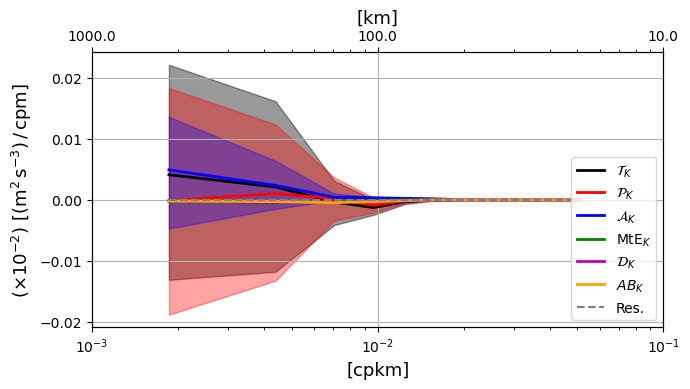

In [25]:
iiter = 1419120

for reg in range(5,6):
    if reg == 0:
        ds0 = xr.open_dataset(op.join(savedir,'crossFourierDiags_u_region%02d_1967-01-01.zarr' 
                                      % reg))
        ds1 = xr.open_dataset(op.join(savedir,'crossFourierDiags_v_region%02d_1967-01-01.zarr' 
                                      % reg))
        ds2 = xr.open_dataset(op.join(savedir,
                                      'crossFourierDiags-ext_u_region%02d_1967-01-01.zarr' 
                                      % reg))
        ds3 = xr.open_dataset(op.join(savedir,
                                      'crossFourierDiags-ext_v_region%02d_1967-01-01.zarr' 
                                      % reg))
    else:
        ds0 = xr.open_dataset(op.join(spec,'Points/%s/%010d/crossFourierDiags_u.zarr' 
                                      % (sreg[reg],iiter)))
        ds1 = xr.open_dataset(op.join(spec,'Points/%s/%010d/crossFourierDiags_v.zarr' 
                                      % (sreg[reg],iiter)))
        ds2 = xr.open_dataset(op.join(spec,
                                      'Points/%s/%010d/crossFourierDiags-ext_u.zarr' 
                                      % (sreg[reg],iiter)))
        ds3 = xr.open_dataset(op.join(spec,
                                      'Points/%s/%010d/crossFourierDiags-ext_v.zarr' 
                                      % (sreg[reg],iiter)))
        
    dtau = xr.open_zarr(op.join(spec,'Points/%s/%010d/crossFourierDiags_u_tend-adv.zarr' 
                                % (sreg[reg],iiter)))
    dtav = xr.open_zarr(op.join(spec,'Points/%s/%010d/crossFourierDiags_v_tend-adv.zarr' 
                                % (sreg[reg],iiter)))
    
    datas = (xrft.isotropize((dtau.cs_uT + dtav.cs_vT
        # ds0.cs_uT + ds1.cs_vT
    ).isel(Z=1).real, 
                         ["freq_YC","freq_XC"], truncate=True)*1e2,
            )  # samples must be in a sequence
    rng = np.random.default_rng()
    Tres = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
    datas = (xrft.isotropize((ds0.cs_uAB + ds1.cs_vAB).isel(Z=1).real, 
                          ["freq_YC","freq_XC"], truncate=True)*1e2,
            )  # samples must be in a sequence
    rng = np.random.default_rng()
    ABres = bootstrap(datas, np.mean, confidence_level=0.95,
                      random_state=rng)
    datas = (xrft.isotropize((ds0.cs_uP + ds1.cs_vP 
                          + ds2.cs_uE + ds3.cs_vE).isel(Z=1).real, 
                         ["freq_YC","freq_XC"], truncate=True)*1e2,
            )  # samples must be in a sequence
    rng = np.random.default_rng()
    Pres = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
    datas = (xrft.isotropize((ds2.cs_uD + ds3.cs_vD).isel(Z=1).mean(['nmemb']).real, 
                         ["freq_YC","freq_XC"], truncate=True)*1e2,
            )  # samples must be in a sequence
    rng = np.random.default_rng()
    Dres = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
    
    Tk = xrft.isotropize((dtau.cs_uT + dtav.cs_vT
        # ds0.cs_uT + ds1.cs_vT
    ).isel(Z=1).mean(['nmemb']).real, 
                         ["freq_YC","freq_XC"], truncate=True).compute()
    ABk = xrft.isotropize((ds0.cs_uAB + ds1.cs_vAB).isel(Z=1).mean(['nmemb']).real, 
                          ["freq_YC","freq_XC"], truncate=True).compute()
    Pk = xrft.isotropize((ds0.cs_uP + ds1.cs_vP 
                          + ds2.cs_uE + ds3.cs_vE).isel(Z=1).mean(['nmemb']).real, 
                         ["freq_YC","freq_XC"], truncate=True).compute()
    
    Dk = xrft.isotropize((ds2.cs_uD + ds3.cs_vD).isel(Z=1).mean(['nmemb']).real, 
                         ["freq_YC","freq_XC"], truncate=True).compute()
    
    # ds4 = xr.open_dataset(op.join(savedir,
    #                               'crossFourierDiags-MtE_region%02d_1967-01-01.zarr' 
    #                               % reg))
    # ds4 = xr.open_dataset(op.join(spec,'Z0452/Points/%s/%010d/crossFourierDiags-SP.zarr' 
    #                               % (sreg[reg],iiter))
    #                      )
    ds4 = xr.open_dataset(op.join(spec,'Points/%s/%010d/crossFourierDiags-SP.zarr' 
                                  % (sreg[reg],iiter))
                         )
    SPu = ds4.cs_SPu
    SPv = ds4.cs_SPv
    SP = (SPu + SPv).isel(Z=1)
    
    datas = (xrft.isotropize(SP.real, 
                          ["freq_YC","freq_XC"], truncate=True)*1e2,
            )  # samples must be in a sequence
    rng = np.random.default_rng()
    SPres = bootstrap(datas, np.mean, confidence_level=0.95,
                      random_state=rng)
    # datas = ((ds0.iso_uA + ds1.iso_vA - MtE).isel(Z=nz).sum('angle')
    #          * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    datas = (xrft.isotropize(((ds0.cs_uA + ds1.cs_vA).isel(Z=1)
                              # - (ds4.MtEu + ds4.MtEv)
                              + SP
                             ).real, 
                             ["freq_YC","freq_XC"], truncate=True)*1e2,
            )  # samples must be in a sequence
    rng = np.random.default_rng()
    Ares = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
    
    Ak = xrft.isotropize(((dtau.cs_uA + dtav.cs_vA
                           # ds0.cs_uA + ds1.cs_vA
    ).isel(Z=1)
                          # - (ds4.MtEu + ds4.MtEv)
                          + SP
                         ).mean(['nmemb']).real, ["freq_YC","freq_XC"], 
                         truncate=True).compute()
    # MtEk = xrft.isotropize((ds4.MtEu + ds4.MtEv).mean(['nmemb']).real, 
    #                        ["freq_YC","freq_XC"], truncate=True).compute()
    SPk = xrft.isotropize(SP.mean(['nmemb']).real, 
                          ["freq_YC","freq_XC"], truncate=True).compute()
    
    res = Tk/86400 - (Pk + xrft.isotropize((dtau.cs_uA + dtav.cs_vA
        # ds0.cs_uA + ds1.cs_vA
    ).mean(['nmemb']).real, 
                                           ["freq_YC","freq_XC"], truncate=True).compute() 
                      + Dk + ABk)
            
            
    fig, ax = plt.subplots(figsize=(7,4))
    fig.set_tight_layout(True)
    ax2 = ax.twiny()
    
    ax.fill_between(Tk.freq_r*1e3, Tres.confidence_interval.low/86400.*2*np.pi, 
                    Tres.confidence_interval.high/86400.*2*np.pi, 
                    alpha=.4, color='k')
    ax.fill_between(Tk.freq_r*1e3, Pres.confidence_interval.low*2*np.pi, 
                    Pres.confidence_interval.high*2*np.pi, 
                    alpha=.36, color='r')
    ax.fill_between(Tk.freq_r*1e3, Ares.confidence_interval.low*2*np.pi, 
                    Ares.confidence_interval.high*2*np.pi, 
                    alpha=.32, color='b')
    ax.fill_between(Tk.freq_r*1e3, -SPres.confidence_interval.high*2*np.pi, 
                    -SPres.confidence_interval.low*2*np.pi, 
                    alpha=.28, color='g')
    ax.fill_between(Tk.freq_r*1e3, Dres.confidence_interval.low*2*np.pi, 
                    Dres.confidence_interval.high*2*np.pi, 
                    alpha=.26, color='m')
    ax.fill_between(Tk.freq_r*1e3, ABres.confidence_interval.low*2*np.pi, 
                    ABres.confidence_interval.high*2*np.pi, 
                    alpha=.24, color='orange')
    
    ax.plot(Tk.freq_r*1e3, Tk*1e2/86400.*2*np.pi,
            'k', lw=2, label=r"$\mathcal{T}_K$")
    ax.plot(Tk.freq_r*1e3, Pk*1e2*2*np.pi,
            'r', lw=2, label=r"$\mathcal{P}_K$")
    ax.plot(Tk.freq_r*1e3, Ak*1e2*2*np.pi,
            'b', lw=2, label=r"$\mathcal{A}_K$")
    ax.plot(Tk.freq_r*1e3, -SPk*1e2*2*np.pi,
            'g', lw=2, label=r"MtE$_K$")
    ax.plot(Tk.freq_r*1e3, (Dk)*1e2*2*np.pi,
            'm', lw=2, label=r"$\mathcal{D}_K$")
    ax.plot(Tk.freq_r*1e3, ABk*1e2*2*np.pi,
            c='orange', lw=2, label=r"$AB_K$")
    ax.plot(Tk.freq_r*1e3, res.isel(Z=1)*1e2*2*np.pi, 
            c='grey', ls='--', label=r"Res.")

    ax.set_xscale('log')
#             ax.set_yscale('log')
    ax2.set_xscale('log')
#             ax2.set_yscale('log')
    ax.set_xlim([1e-3,1e-1])
    ax2.set_xlim([1e-3,1e-1])
    ax2.set_xticks([1e-3,1e-2,1e-1])
    ax2.set_xticklabels([1e3,1e2,1e1])
    # Meta = np.abs(Pk.isel(Z=0)).max(skipna=True).values*1e3
    # ax.set_ylim([-Meta*.7, Meta*.7])
    ax.set_xlabel(r"[cpkm]", fontsize=13)
    ax2.set_xlabel(r"[km]", fontsize=13)
    ax.set_ylabel(r"($\times 10^{-2}$) [(m$^2\,$s$^{-3})\,/\,$cpm]", fontsize=13)
    ax.grid(True)
    # if reg == 0:
    ax.legend(loc='lower right', fontsize=10)
    plt.savefig(op.join(spec,'Figs/FourierSpecKEbudget_Region%02d_Z452.pdf' % reg))
    plt.show()

In [7]:
years = np.arange(1967,1968,dtype=int)
ntimes = np.arange(1419120,1574640+dnf,dnf).reshape(len(years),nfile)
dd = 25  # 

print(ntimes[0,dd:])

[1473120 1475280 1477440 1479600 1481760 1483920 1486080 1488240 1490400
 1492560 1494720 1496880 1499040 1501200 1503360 1505520 1507680 1509840
 1512000 1514160 1516320 1518480 1520640 1522800 1524960 1527120 1529280
 1531440 1533600 1535760 1537920 1540080 1542240 1544400 1546560 1548720
 1550880 1553040 1555200 1557360 1559520 1561680 1563840 1566000 1568160
 1570320 1572480 1574640]


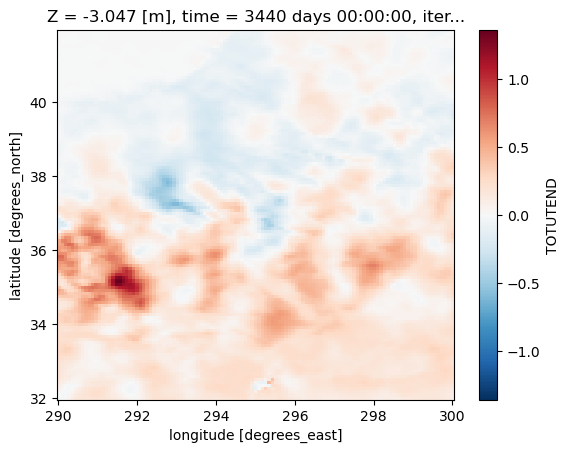

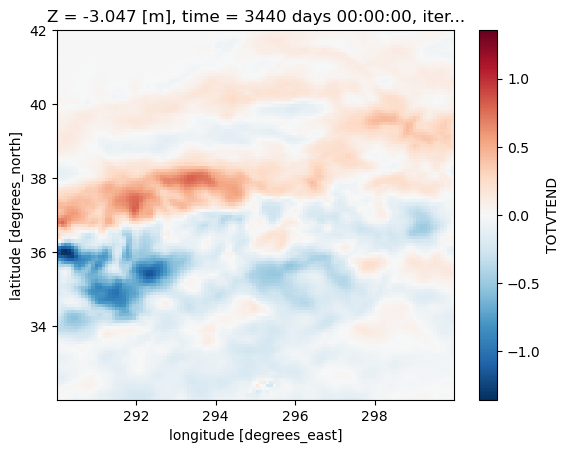

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1486080


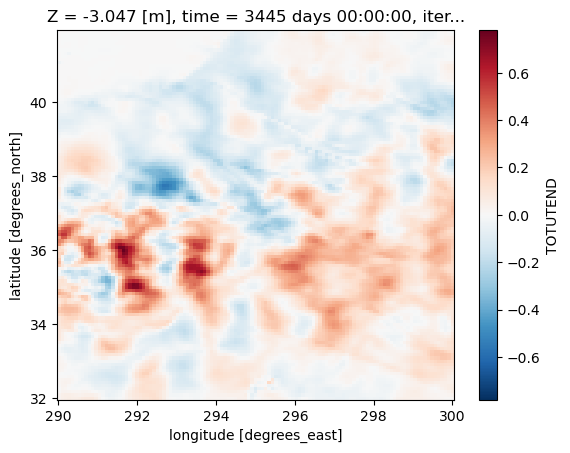

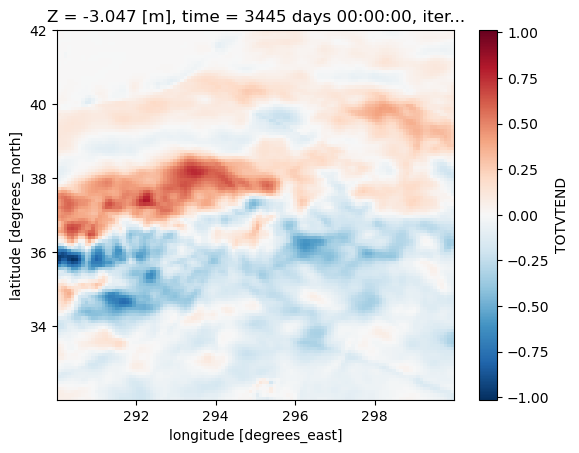

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1488240


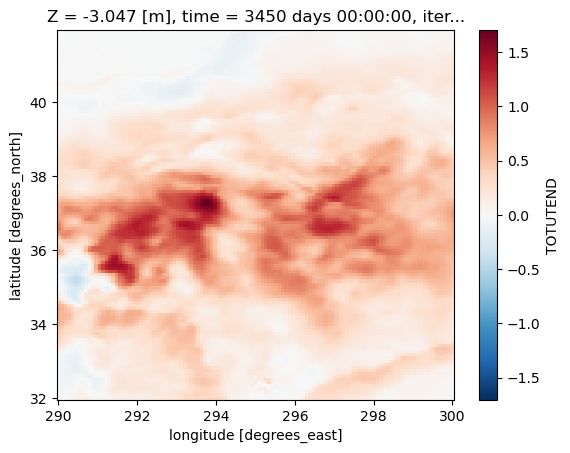

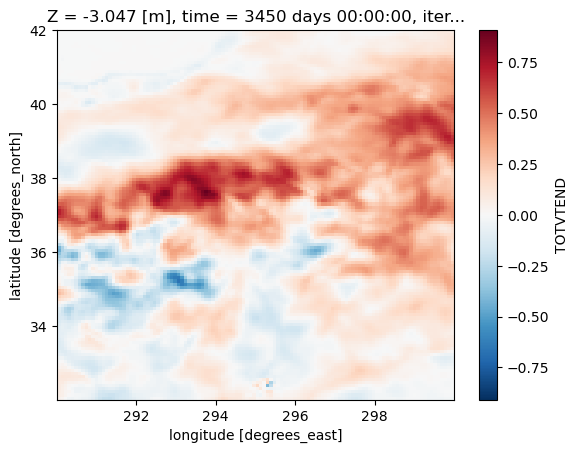

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1490400


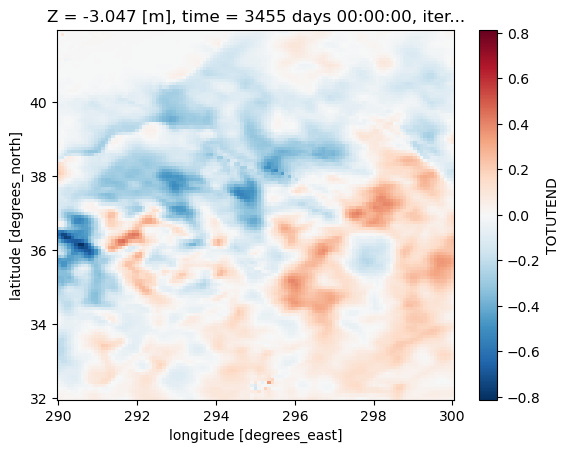

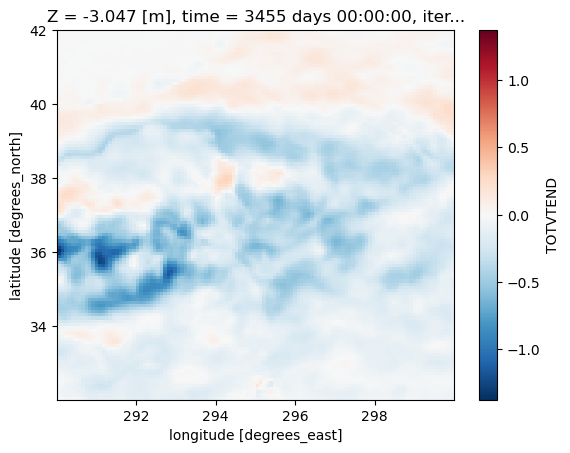

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1492560


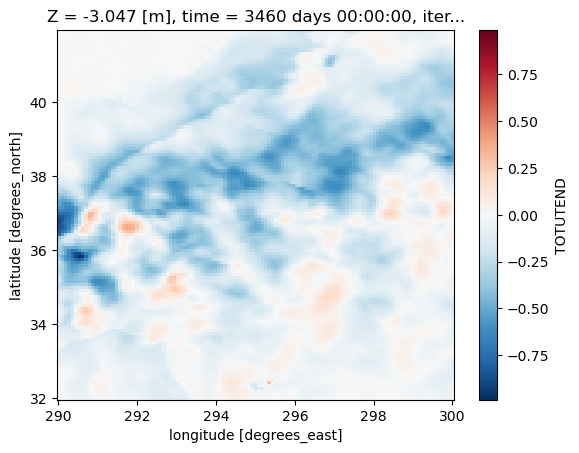

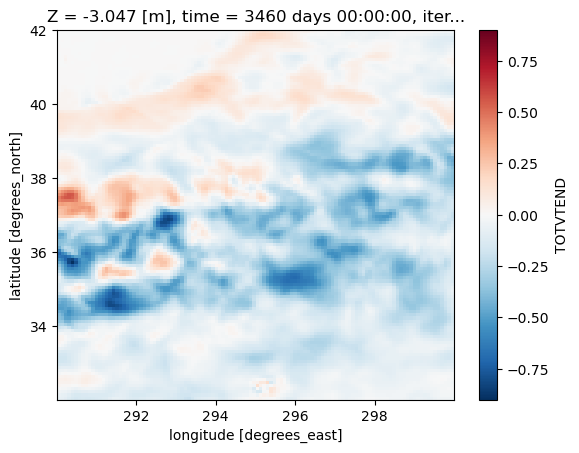

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1494720


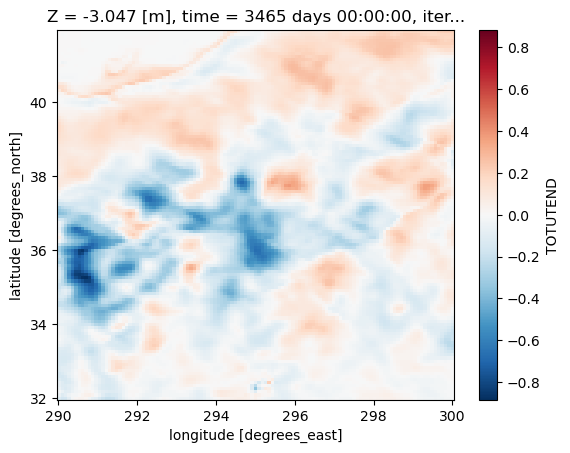

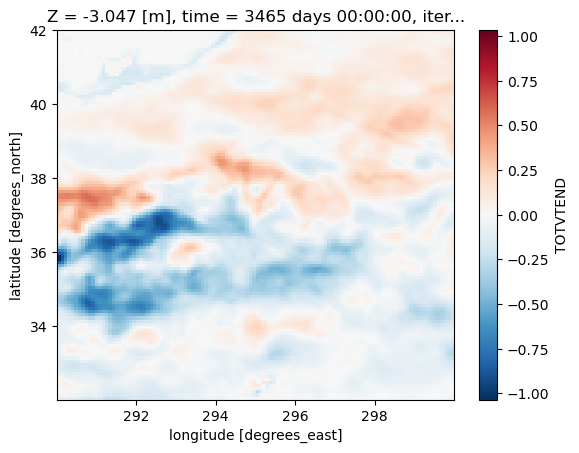

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1496880


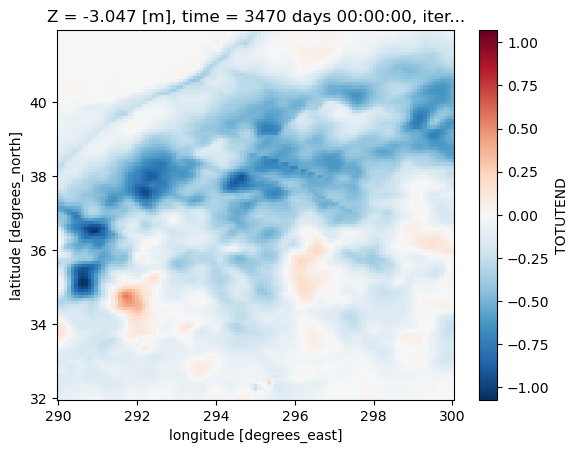

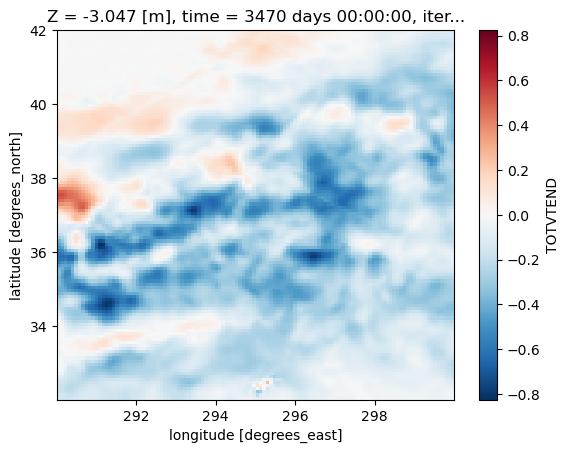

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1499040


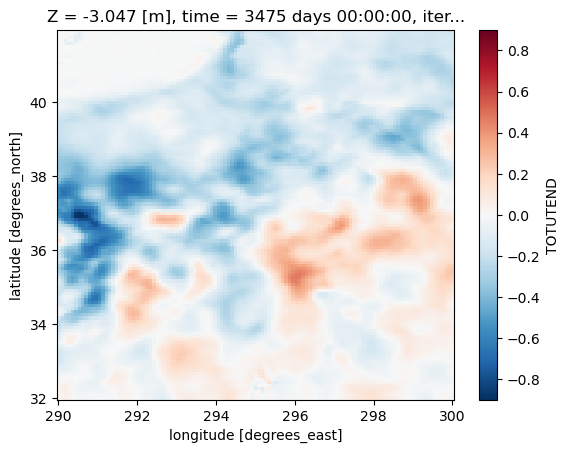

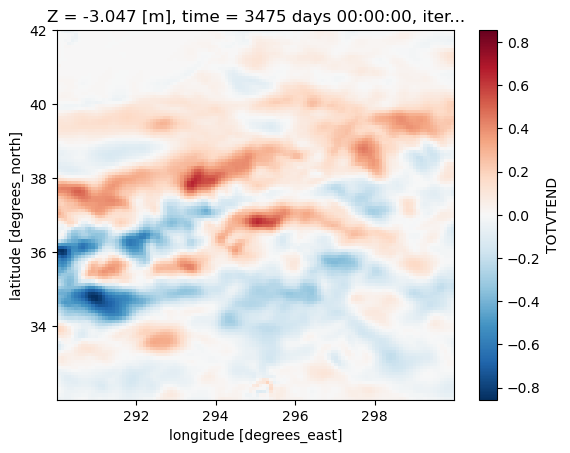

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1501200


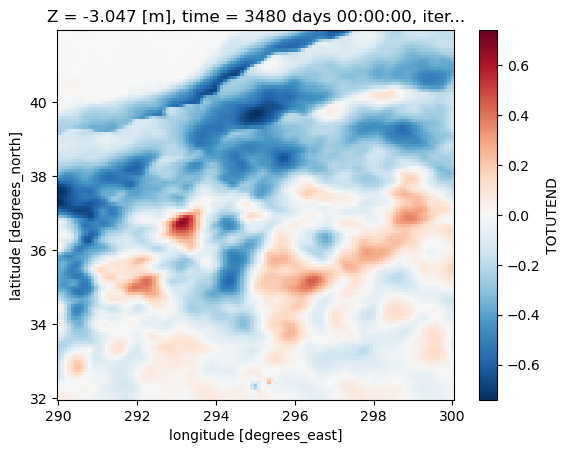

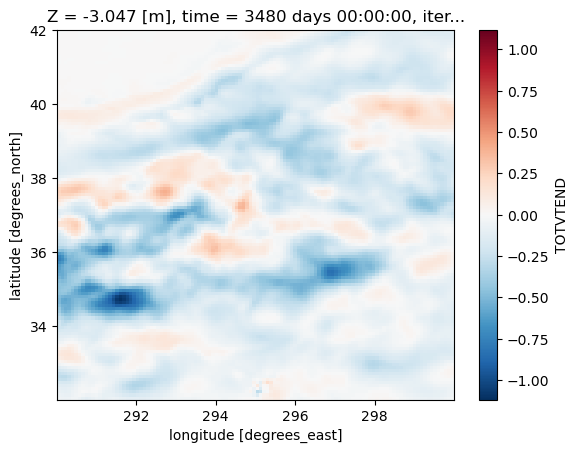

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1503360


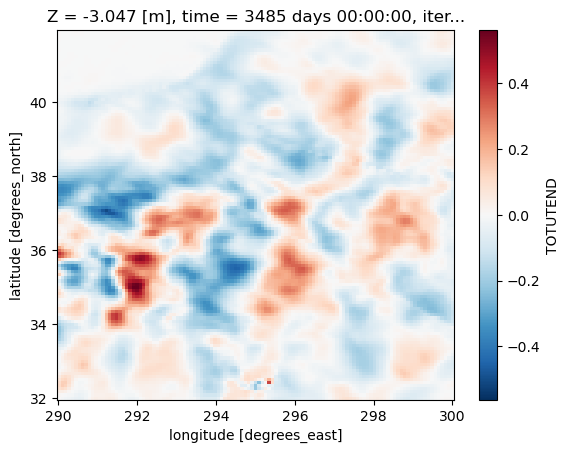

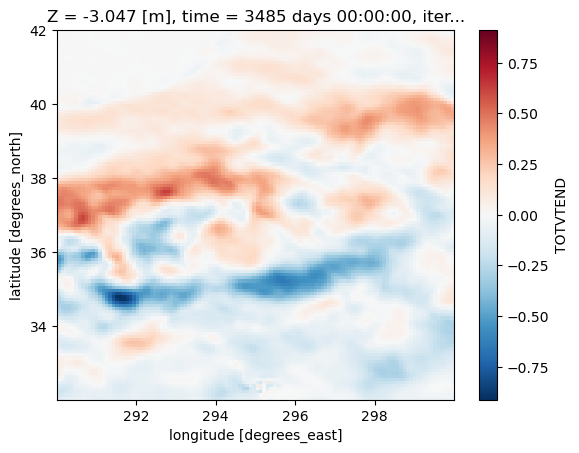

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1505520


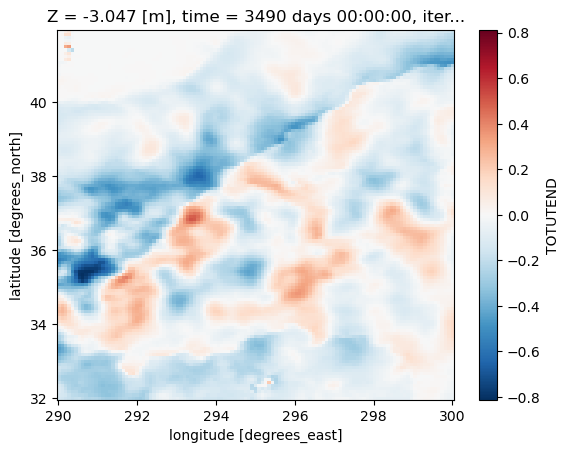

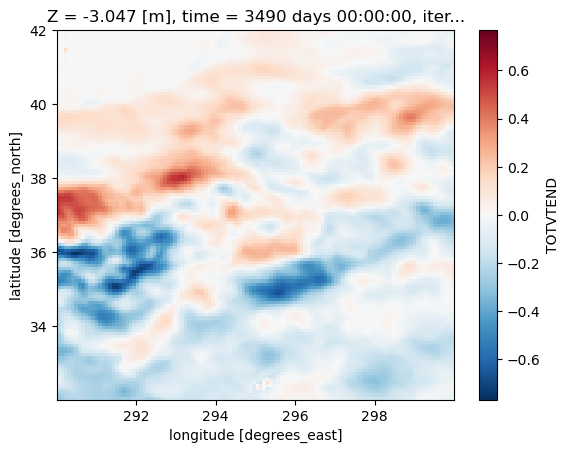

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1507680


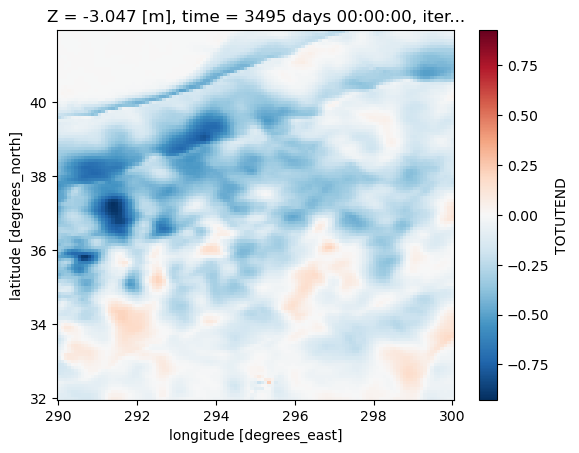

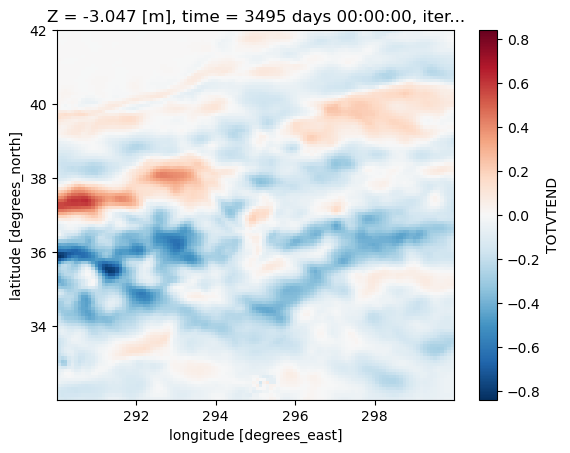

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1509840


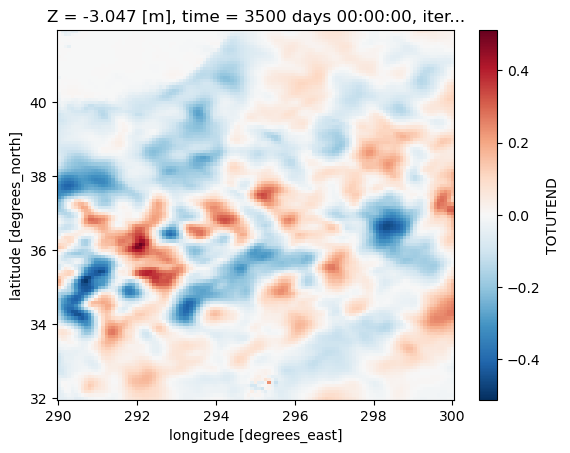

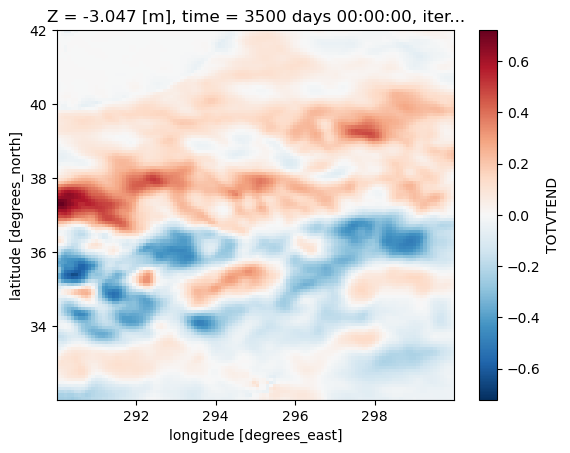

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1512000


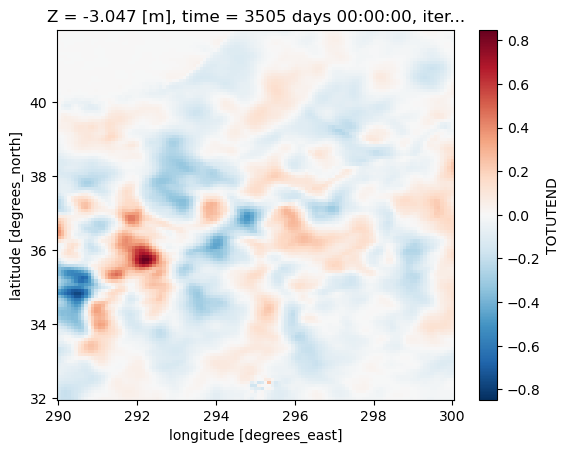

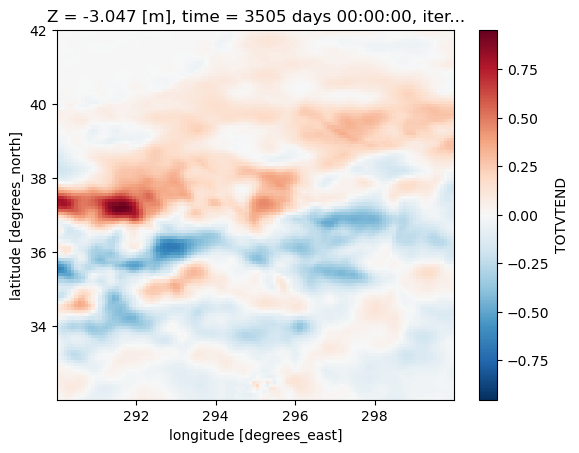

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1514160


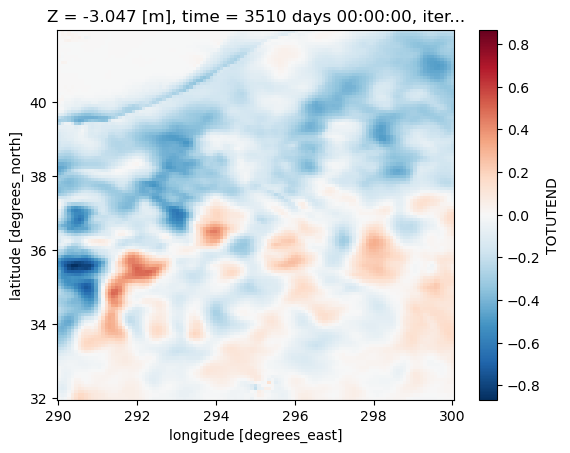

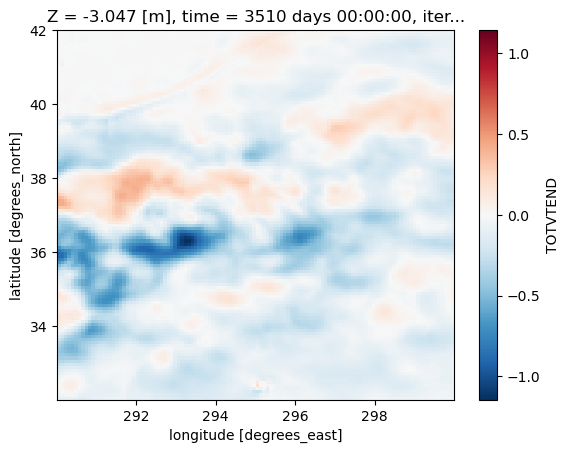

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1516320


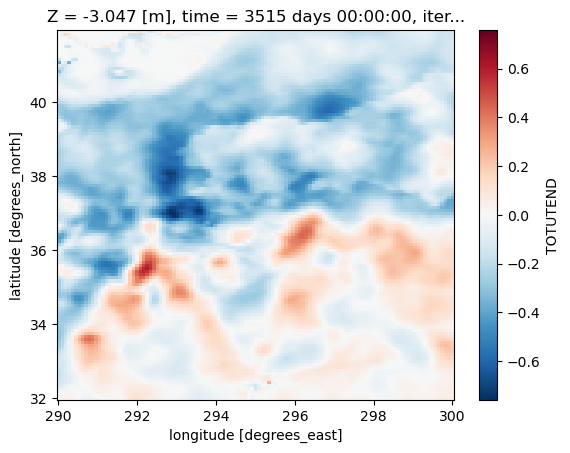

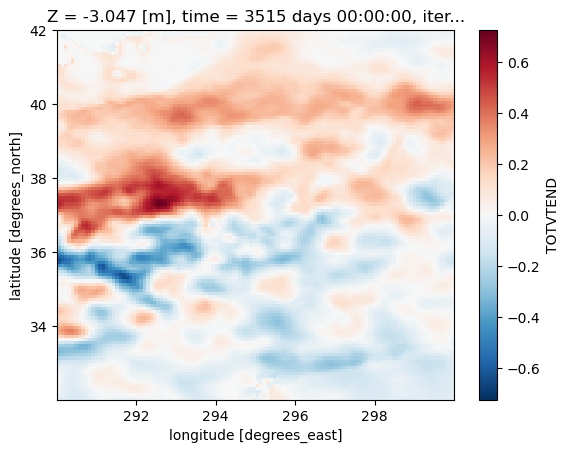

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1518480


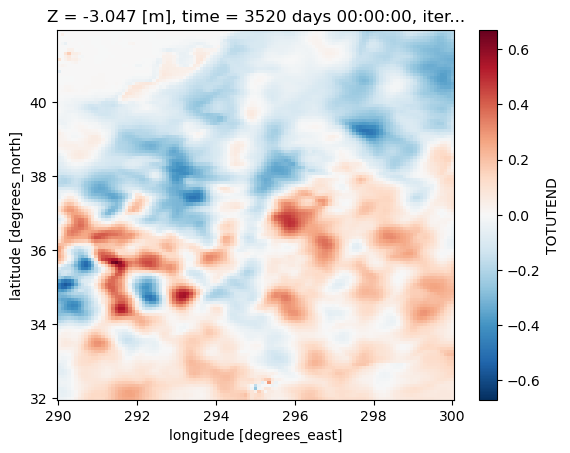

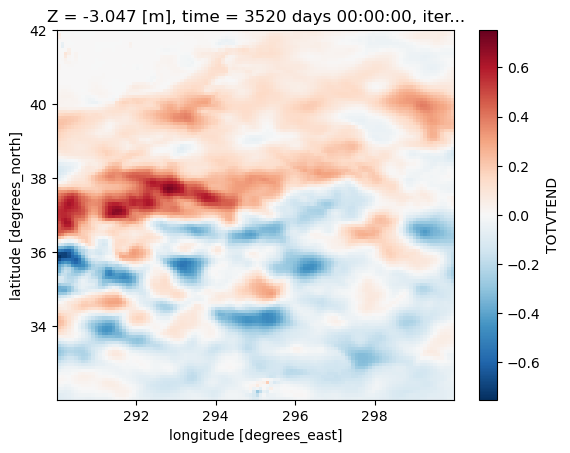

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1520640


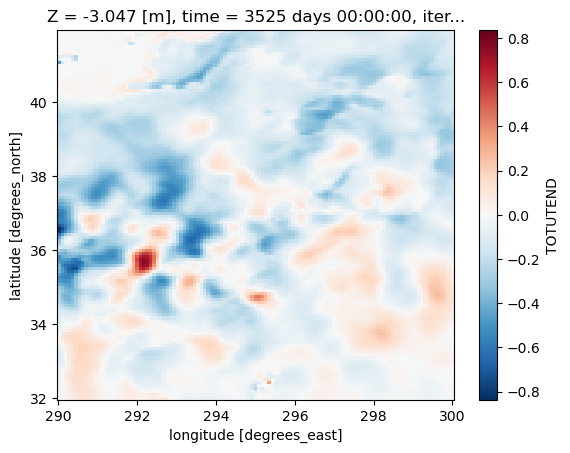

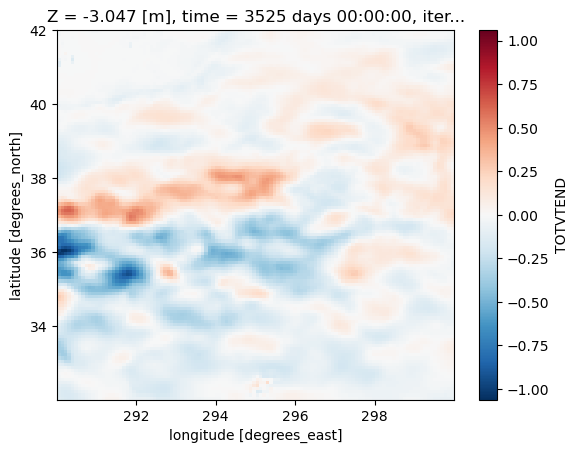

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1522800


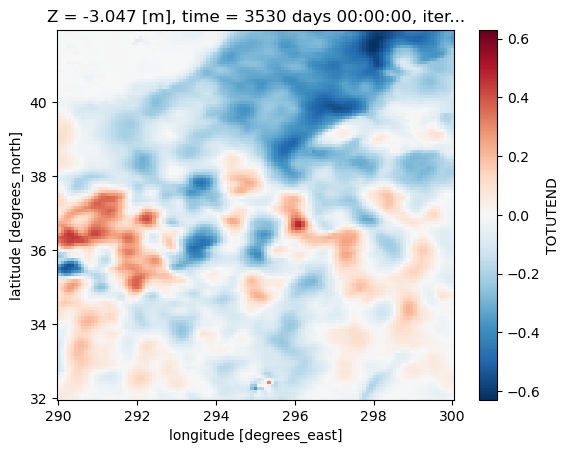

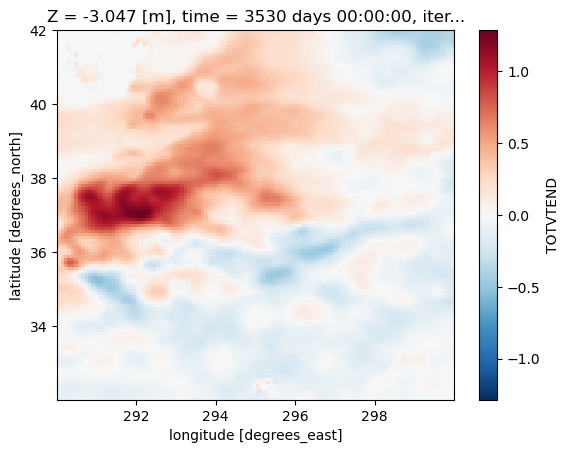

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1524960


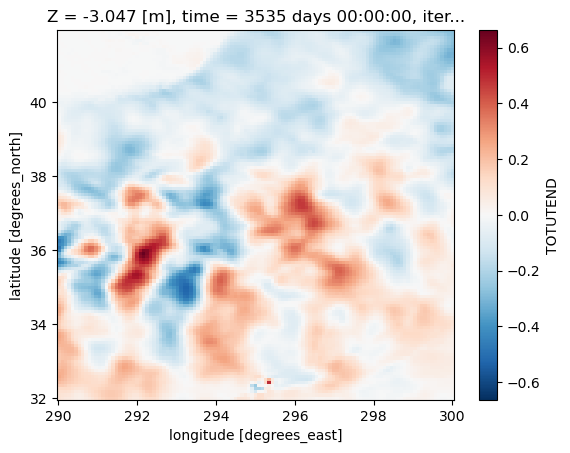

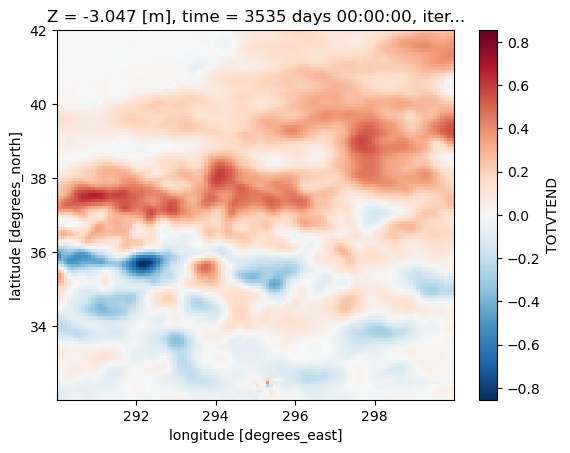

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1527120


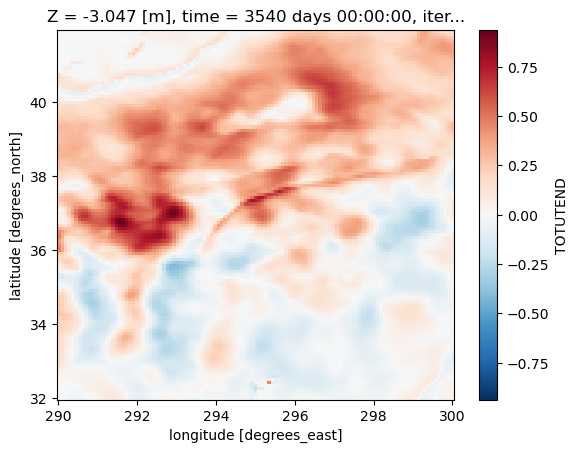

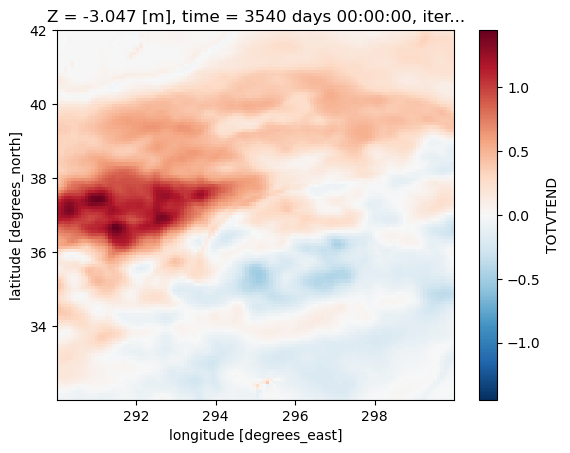

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1529280


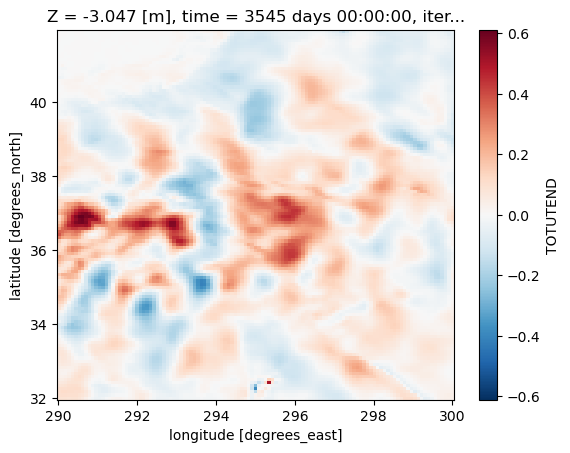

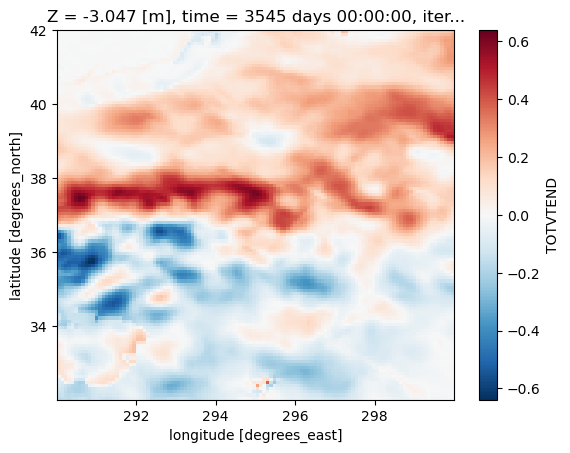

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1531440


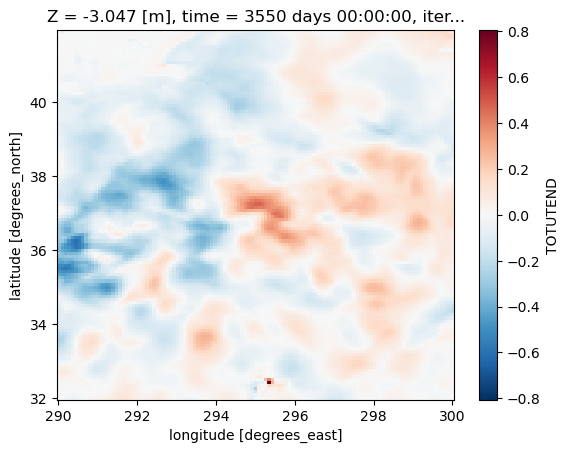

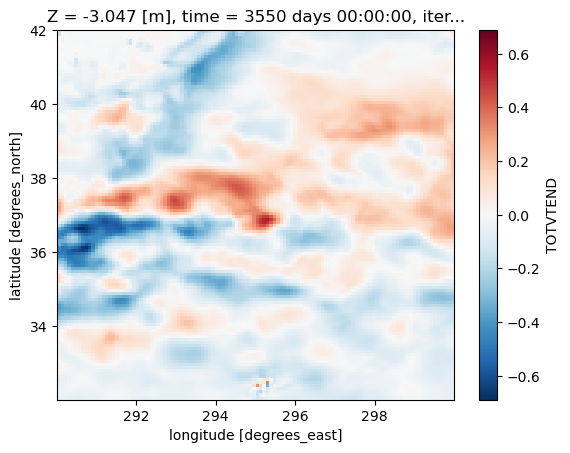

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1533600


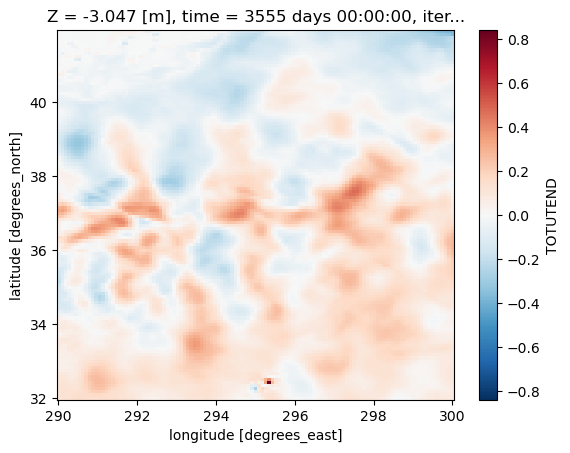

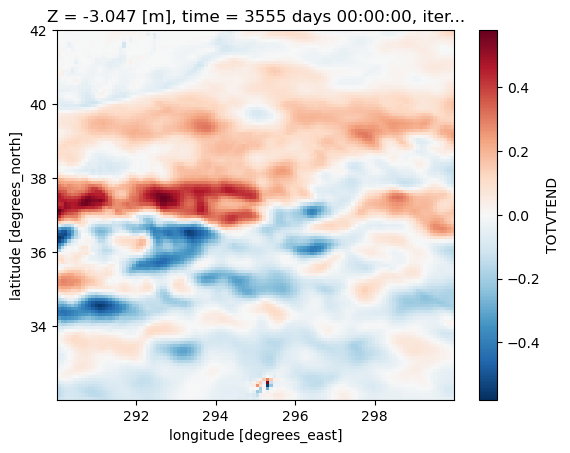

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1535760


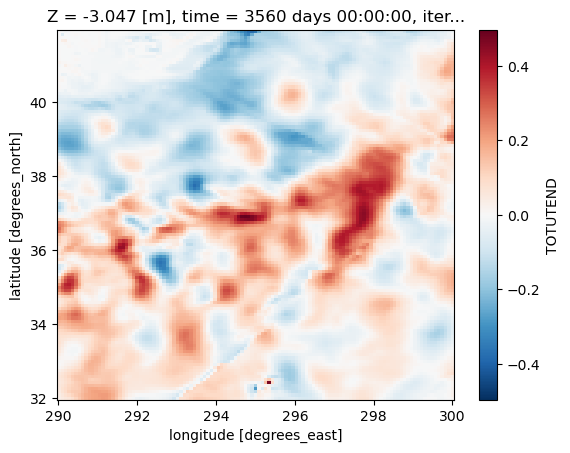

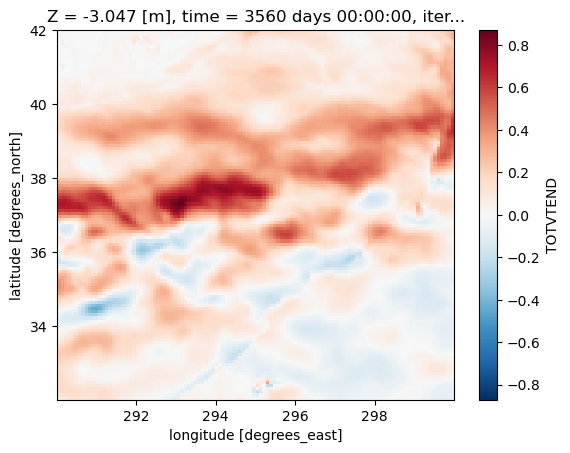

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1537920


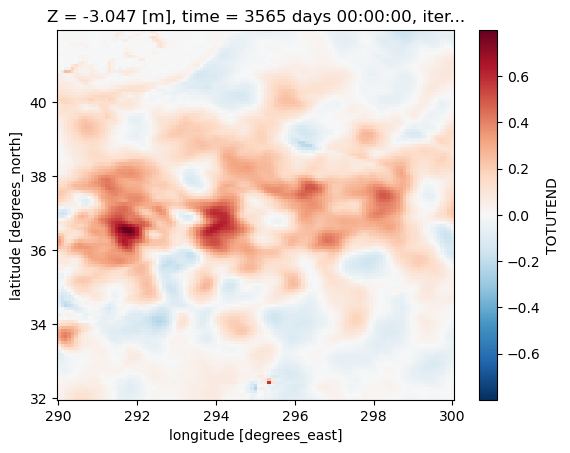

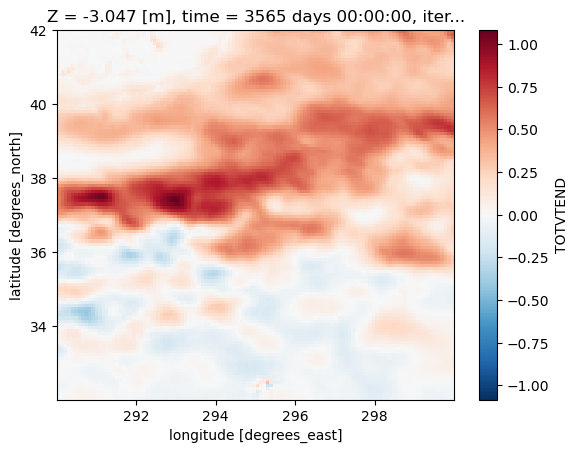

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1540080


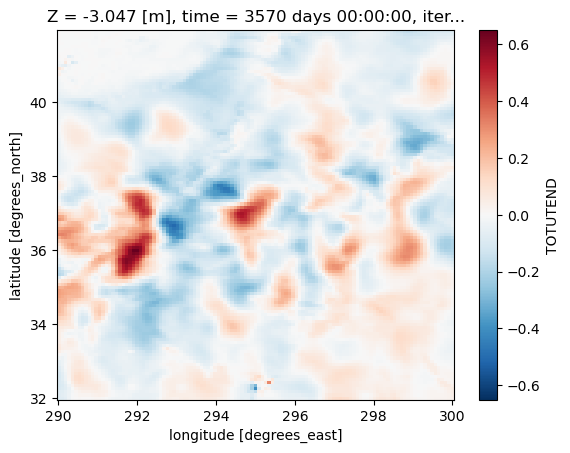

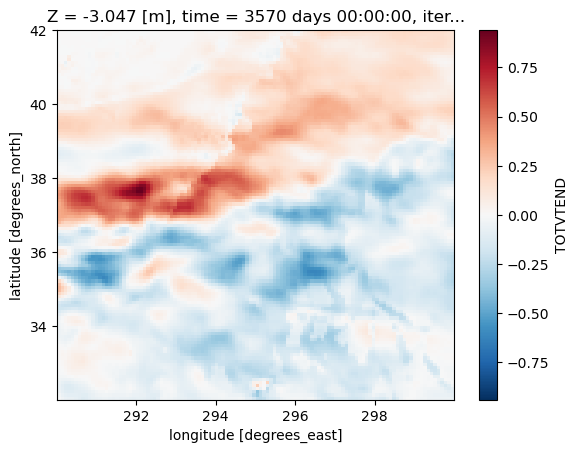

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1542240


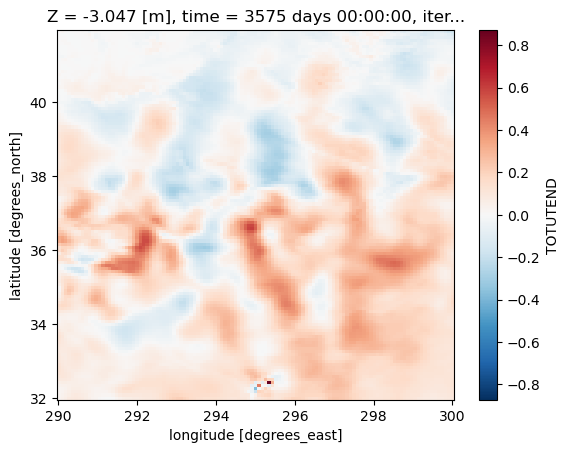

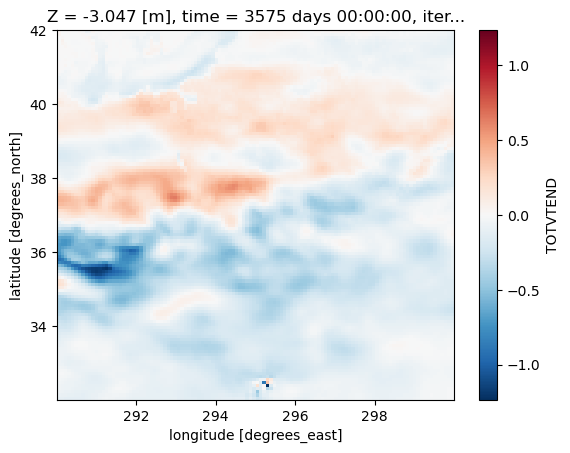

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1544400


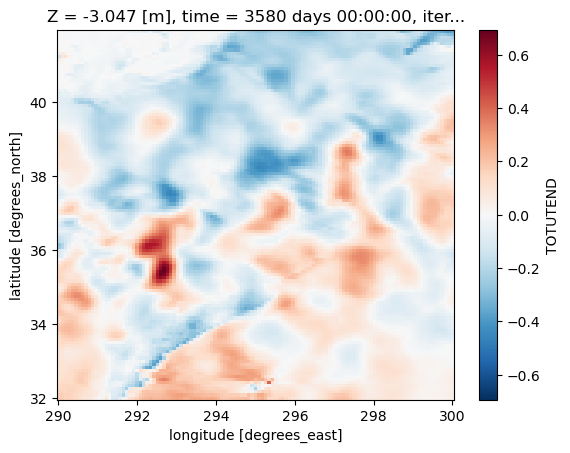

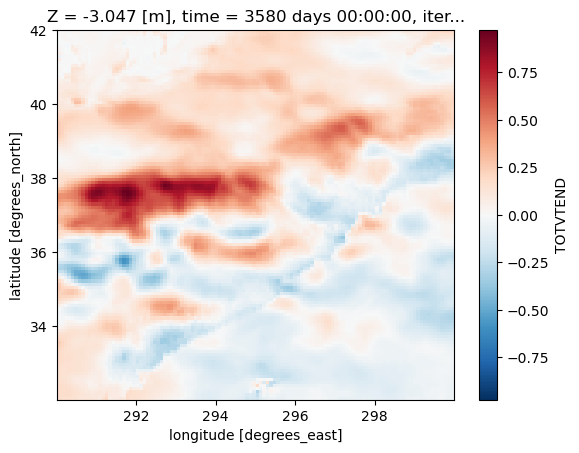

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1546560


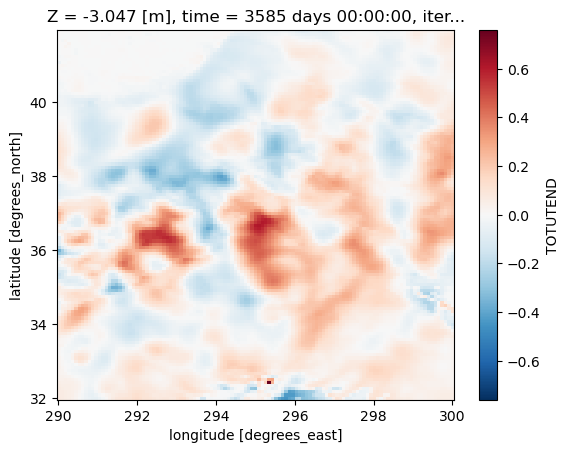

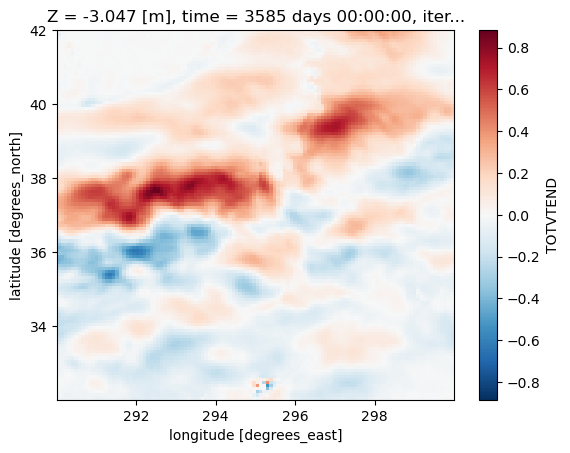

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1548720


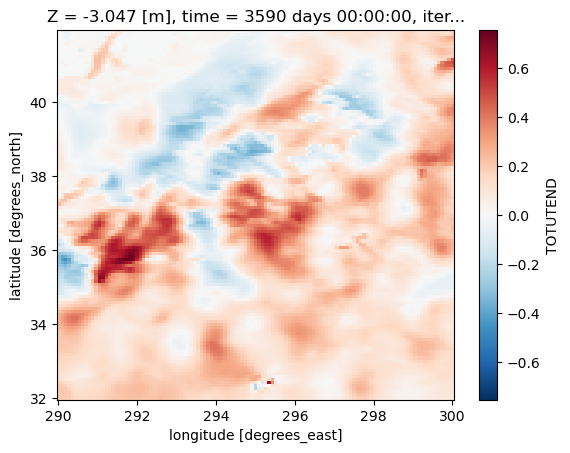

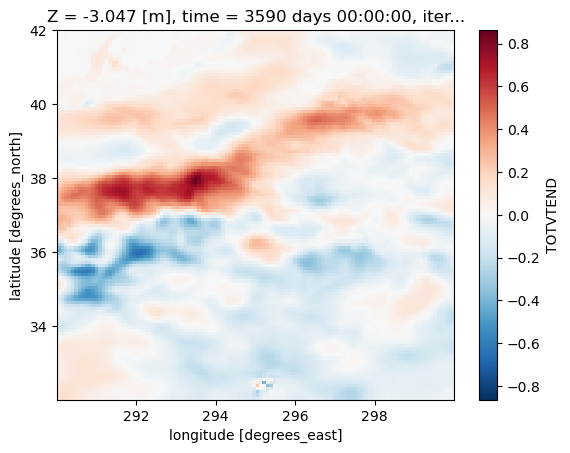

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1550880


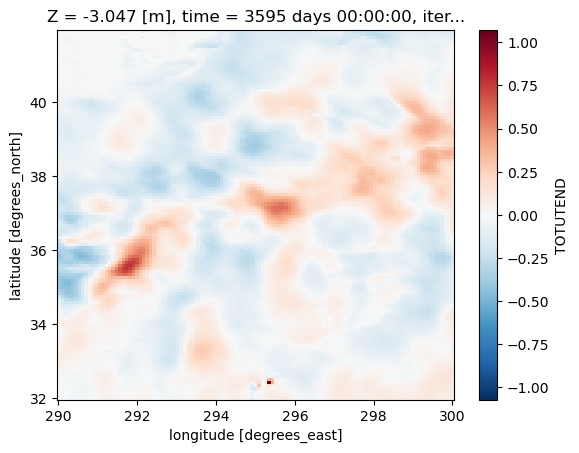

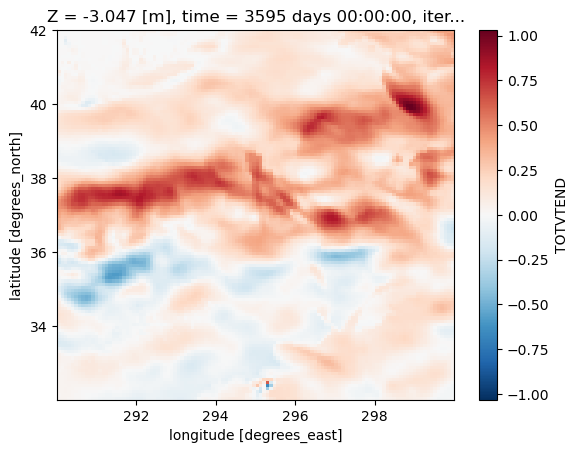

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1553040


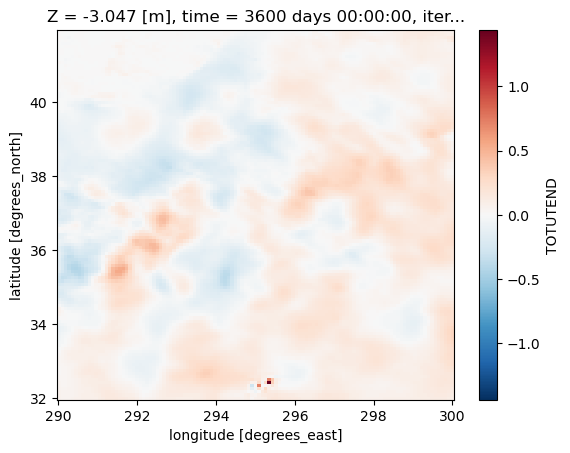

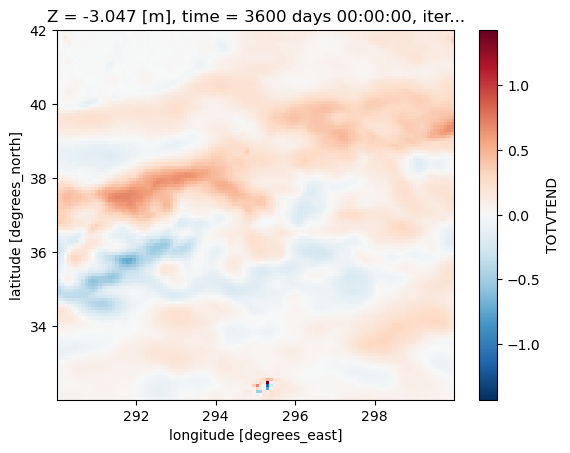

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1555200


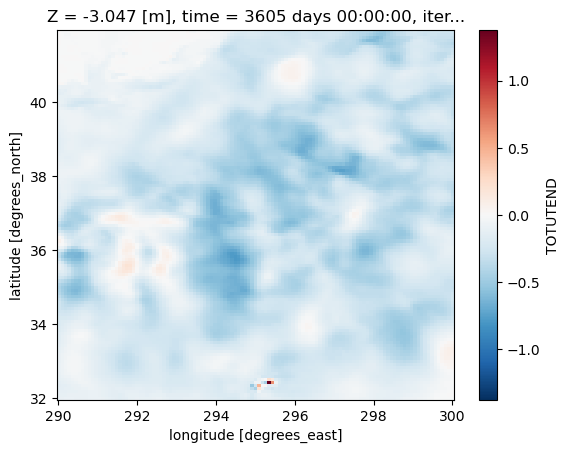

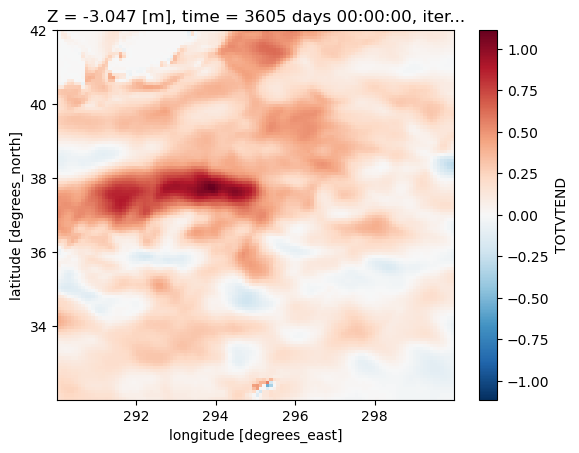

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1557360


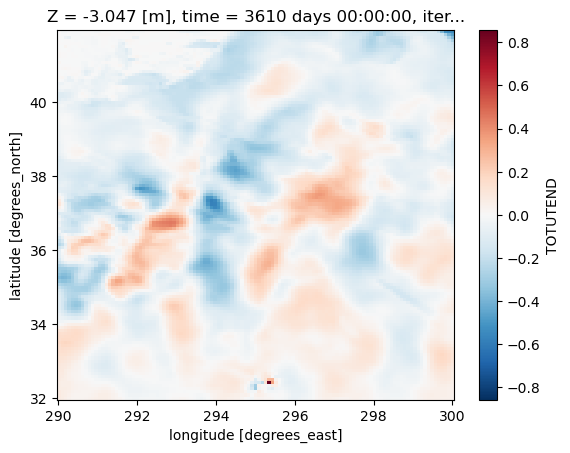

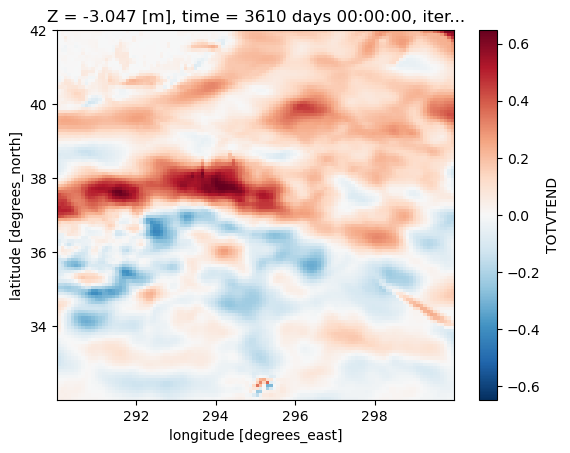

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1559520


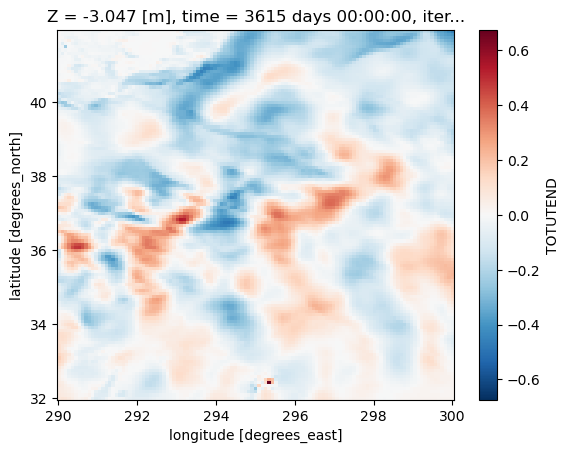

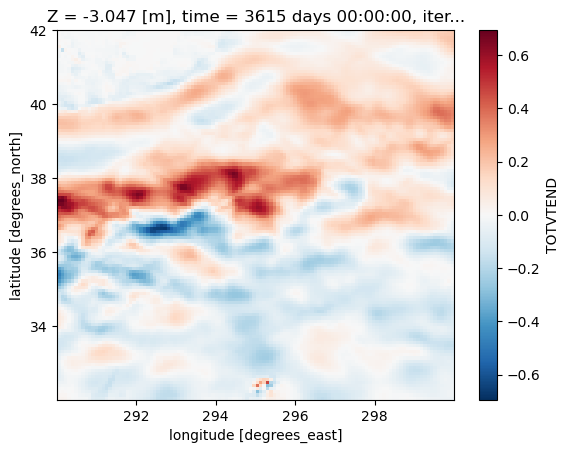

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1561680


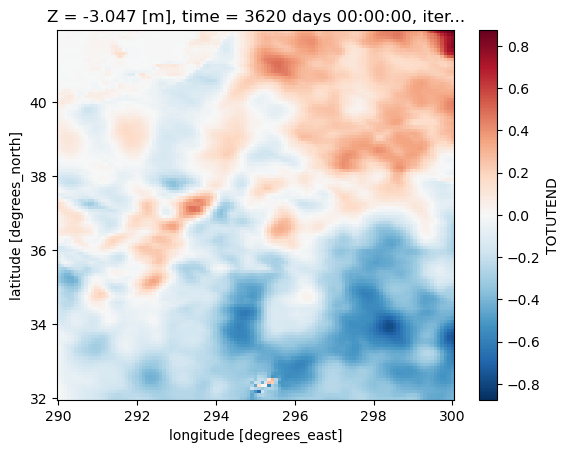

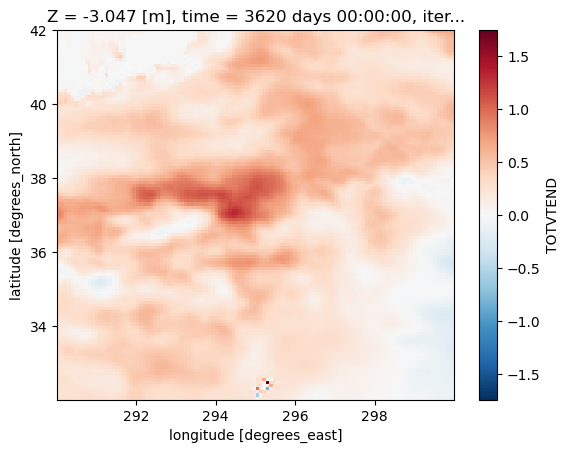

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1563840


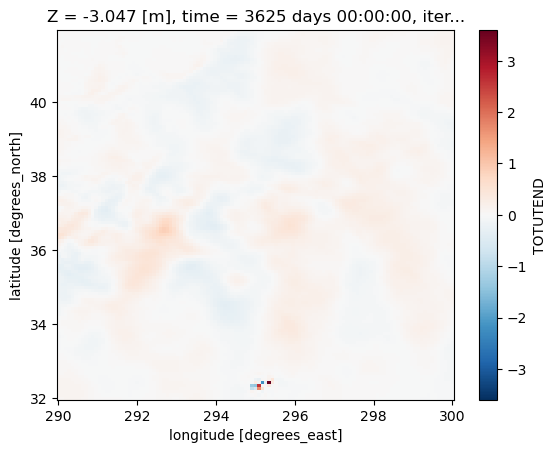

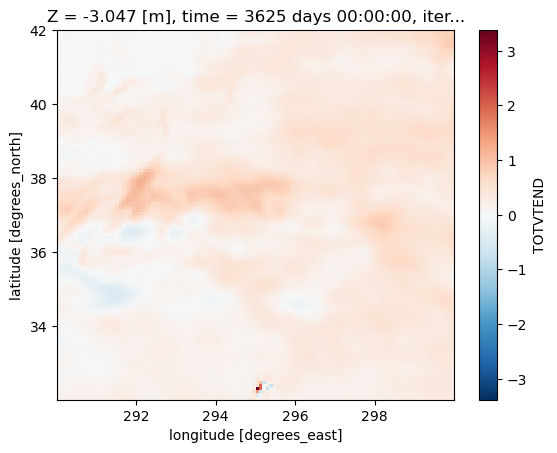

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1566000


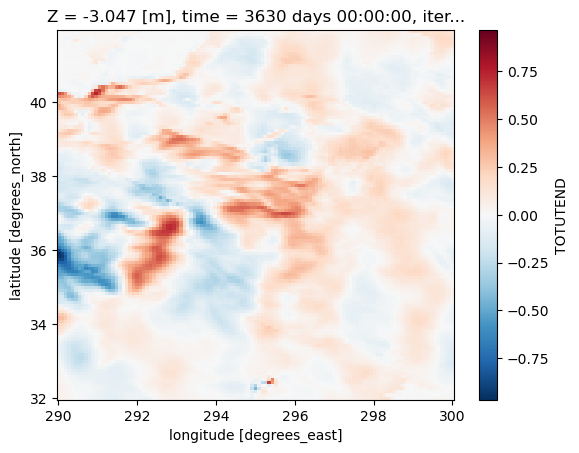

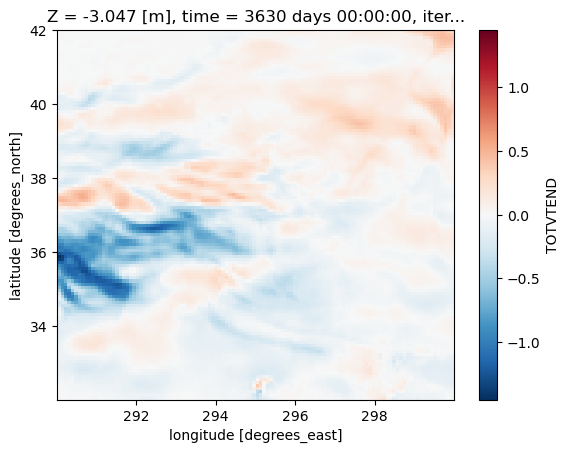

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1568160


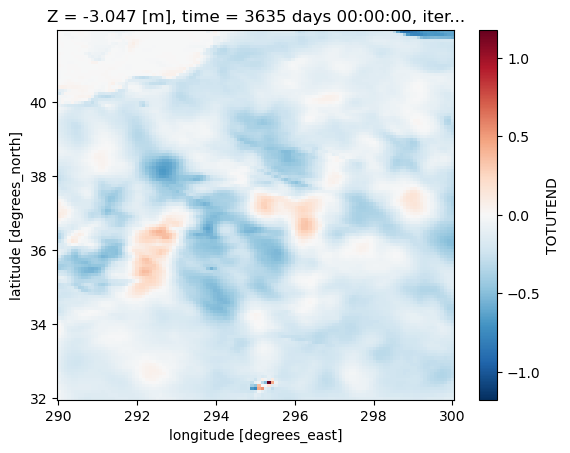

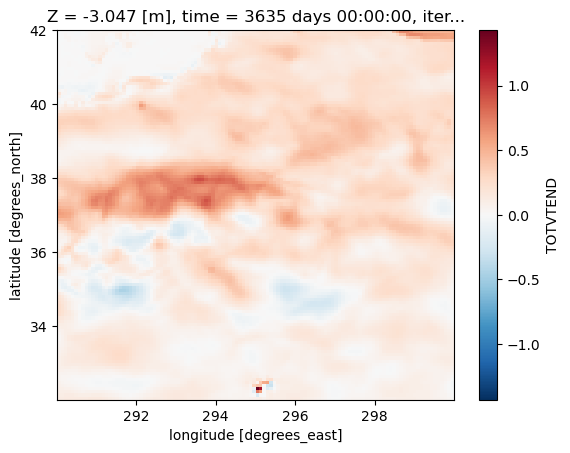

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1570320


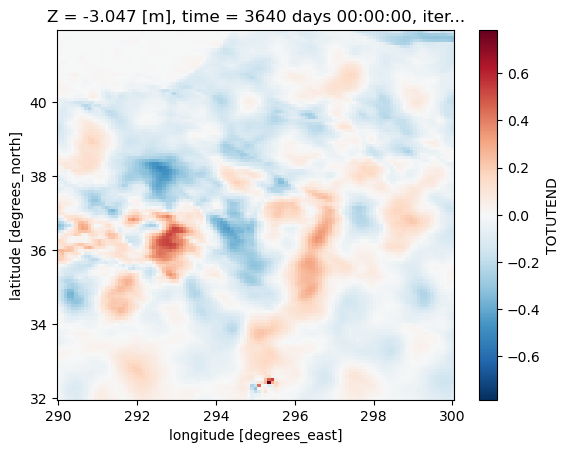

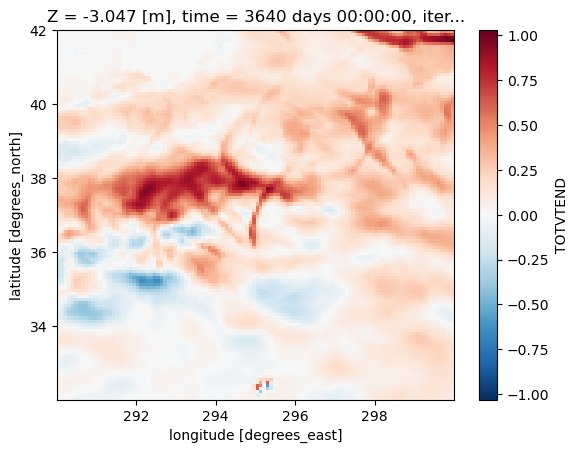

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1572480


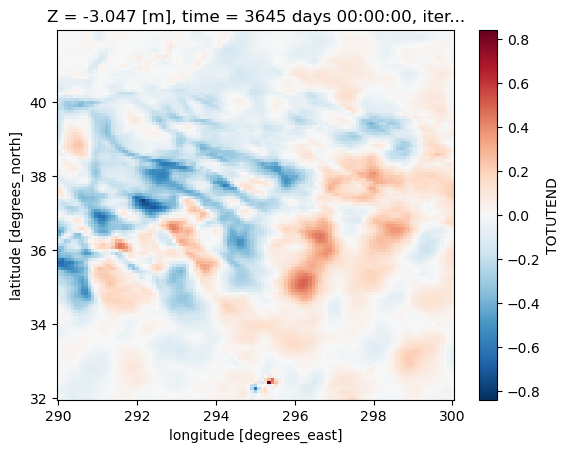

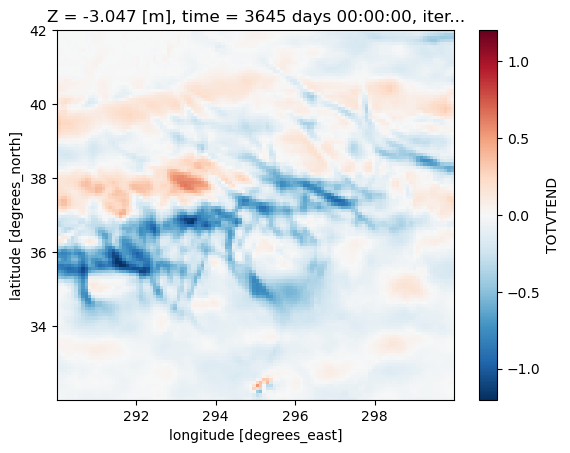

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disap

1574640


In [8]:
reg = 0
dg = 0

for iiter in ntimes[0,dd+1:]:
    dsb = open_mdsdataset(op.join(ddir,'ensm/run1967/ocn'), 
                      grid_dir=gdir,
                      prefix=['snap_diagOcn'], delta_t=2e2,
                      iters=iiter, 
                     ).sel(YC=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                           YG=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                           XC=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12),
                           XG=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12)
                          ).chunk({'Z':1,'Zl':1,'Zu':1,'Zp1':1}).isel(time=0)
    
    dsm = xr.open_zarr(op.join(spec,'Snaps_Tot-Adv_EnsMean/%010d.zarr' % iiter)
                      ).sel(YC=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                            YG=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                            XC=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12),
                            XG=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12)
                           ).chunk({'Z':1})

    dsUmb = open_mdsdataset(op.join(ddir,'ensm/run1967/ocn'), 
                            grid_dir=gdir,
                            prefix=['diagUm'], delta_t=2e2,
                            iters=iiter, 
                            ignore_unknown_vars=True
                           ).sel(YC=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                                 YG=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                                 XC=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12),
                                 XG=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12)
                                ).chunk({'Z':1,'Zl':1,'Zu':1,'Zp1':1}).isel(time=0)
    (dsm.TOTUTEND - dsUmb.TOTUTEND).isel(Z=0).plot(rasterized=True)
    plt.show()
    
    if len(dsb.XG) > len(dsb.XC):
         dsb = dsb.isel(XG=slice(None,-1))
    if len(dsUmb.XG) > len(dsb.XC):
         dsUmb = dsUmb.isel(XG=slice(None,-1))

    dsVmb = open_mdsdataset(op.join(ddir,'ensm/run1967/ocn'), 
                            grid_dir=gdir,
                            prefix=['diagVm'], delta_t=2e2,
                            iters=iiter, 
                            ignore_unknown_vars=True
                           ).sel(YC=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                                 YG=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                                 XC=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12),
                                 XG=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12)
                                ).chunk({'Z':1,'Zl':1,'Zu':1,'Zp1':1}).isel(time=0)
    (dsm.TOTVTEND - dsVmb.TOTVTEND).isel(Z=0).plot(rasterized=True)
    plt.show()
    # dsUmextb = xr.open_zarr(op.join(spec,'SnapsUm-ext_EnsMean/%010d.zarr' % iiter)
    #                        ).sel(YC=slice(ys[reg]-5,ys[reg]+5),
    #                              XG=slice(xs[reg]-5,xs[reg]+5)
    #                             ).isel(XG=slice(None,116))
    # dsVmextb = xr.open_zarr(op.join(spec,'SnapsVm-ext_EnsMean/%010d.zarr' % iiter)
    #                        ).sel(YG=slice(ys[reg]-5,ys[reg]+5),
    #                              XC=slice(xs[reg]-5,xs[reg]+5)
    #                             )
    
    for nmemb in nmembs:
        if nmemb == 100:
            ds = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['snap_diagOcn'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                                   YG=slice(ys[reg]-5,ys[reg]+5),
                                                   XC=slice(xs[reg]-5,xs[reg]+5),
                                                   XG=slice(xs[reg]-5,xs[reg]+5)
                                                  )
        else:
            ds1 = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['snap_diagOcn'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                                   YG=slice(ys[reg]-5,ys[reg]+5),
                                                   XC=slice(xs[reg]-5,xs[reg]+5),
                                                   XG=slice(xs[reg]-5,xs[reg]+5)
                                                  )
            ds = xr.concat([ds, ds1], dim='nmemb')
            ds1.close()

    ds.coords['nmemb'] = ('nmemb',nmembs)
    if len(ds.XG) > len(ds.XC):
        ds = ds.isel(XG=slice(None,-1))
    
    grid = Grid(dsb, periodic=[], 
            # coords={'Z': {'center': 'Z', 'outer': 'Zp1', 'left':'Zl', 'right':'Zu'},
            #         'Y': {'center': 'YC', 'left': 'YG'},
            #         'X': {'center': 'XC', 'left': 'XG'}}
           )
        
    xT = grid.cumsum(ds.dxC,'X',boundary='extend'
                    )
    yT = grid.cumsum(ds.dyC,'Y',boundary='extend'
                    )
    ny, nx = xT.shape
    xT = xT - xT.isel(XC=nx//2)
    xT = (xT - xT.isel(YC=-1,XC=0)).values.flatten()
    yT = (yT - yT.isel(YC=0)).values.flatten()
    dx = ds.dxC.min().values
    dy = ds.dyC.min().values
    N = ds.THETA.isel(nmemb=0,Z=0).shape

    xxx, yyy = np.mgrid[0:N[-1]*dx:dx, 0:N[-2]*dy:dy]
    ntheta = 36
    ss = xr.open_zarr(
        '/tank/topog/tuchida/Wavelet-spectrum/isoDiags_KE_region%02d_1967-01-01.zarr' 
                      % reg).scale/xo
    
    up = (ds.UVEL - dsb.UVEL)
    upC = grid.interp(up,'X',boundary='extend'
                     ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
    vp = (ds.VVEL - dsb.VVEL)
    vpC = grid.interp(vp,'Y',boundary='extend'
                     ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
    wp = (ds.WVEL - dsb.WVEL)

    ub = dsb.UVEL
    ubC = grid.interp(ub,'X',boundary='extend'
                     ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
    vb = dsb.VVEL
    vbC = grid.interp(vb,'Y',boundary='extend'
                     ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
    
    rAterp = griddata((xT, yT), ds.rA.values.flatten(),
                  (xxx, yyy) 
                 ).T
    
    uterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                         coords={'nmemb':nmembs,'Z':upC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )
    vterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                         coords={'nmemb':nmembs,'Z':vpC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )

    for iz in range(len(upC.Z)):
        for nn in range(len(nmembs)):
            uterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT),
                                                    (upC*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T 
            vterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                    (vpC*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T 

    uterp = uterp / rAterp
    vterp = vterp / rAterp
######################## 
######################## 
    for nmemb in nmembs:
        if nmemb == 100:
            dsUm = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' % (nmemb)), 
                                   grid_dir=gdir,
                                   prefix=['diagUm'], delta_t=2e2,
                                   iters=iiter, 
                                   ignore_unknown_vars=True
                                  ).reset_coords(drop=True).drop_dims(['YG','XC','Zl','Zu','Zp1']
                                                                     ).sel(YC=slice(ys[reg]-5,
                                                                                    ys[reg]+5),
                                                                           XG=slice(xs[reg]-5,
                                                                                    xs[reg]+5)
                                                                          ).isel(time=0)

        else:
            ds1 = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' % (nmemb)), 
                                  grid_dir=gdir,
                                  prefix=['diagUm'], delta_t=2e2,
                                  iters=iiter, 
                                  ignore_unknown_vars=True
                                 ).reset_coords(drop=True).drop_dims(['YG','XC','Zl','Zu','Zp1']
                                                                    ).sel(YC=slice(ys[reg]-5,
                                                                                   ys[reg]+5),
                                                                          XG=slice(xs[reg]-5,
                                                                                   xs[reg]+5)
                                                                         ).isel(time=0)

            dsUm = xr.concat([dsUm, ds1], dim='nmemb')
            ds1.close()

    dsUm.coords['nmemb'] = ('nmemb',nmembs)
    if len(dsUm.XG) > len(ds.XC):
         dsUm = dsUm.isel(XG=slice(None,-1))
            
    Tp = grid.interp((dsUm.TOTUTEND 
                      # - dsUmb.TOTUTEND
                      - dsm.TOTUTEND
                     ),'X',boundary='extend'
                    ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
    Ap = grid.interp((
                      dsUm.Um_Advec 
                      # - dsUm.Um_Cori
                     # ).where(ds.maskW!=0.)
                     - 
                       # (
                        # dsUmb.Um_Advec
                        dsm.Um_Advec
                        # - dsUmb.Um_Cori
                       ),
                     'X',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
#     Pp = grid.interp((dsUm.Um_dPHdx - dsUmb.Um_dPHdx),'X',boundary='extend'
#                     ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
#     # Dp = dsUm.Um_Diss - dsUmb.Um_Diss
#     ABp = grid.interp((dsUm.AB_gU - dsUmb.AB_gU),'X',boundary='extend'
#                      ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
    
#     Pterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
#                          coords={'nmemb':nmembs,'Z':upC.Z,
#                                  'YC':np.arange(0,N[-2]*dy,dy),
#                                  'XC':np.arange(0,N[-1]*dx,dx)}
#                         )
    Tterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                         coords={'nmemb':nmembs,'Z':upC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )
    Aterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                         coords={'nmemb':nmembs,'Z':upC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )
    # ABterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
    #                       coords={'nmemb':nmembs,'Z':upC.Z,
    #                               'YC':np.arange(0,N[-2]*dy,dy),
    #                               'XC':np.arange(0,N[-1]*dx,dx)}
    #                      )

    for iz in range(len(upC.Z)):
        for nn in range(len(nmembs)):
            Tterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                    (Tp*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T 
            # Pterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
            #                                         (Pp*ds.rA
            #                                         ).isel(nmemb=nn,Z=iz).values.flatten(),
            #                                         (xxx, yyy) 
            #                                        ).T
            Aterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                    (Ap*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T 
            # ABterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
            #                                          (ABp*ds.rA
            #                                          ).isel(nmemb=nn,Z=iz).values.flatten(),
            #                                          (xxx, yyy) 
            #                                         ).T 

    Tterp = Tterp / rAterp
    Aterp = Aterp / rAterp
#     Pterp = Pterp / rAterp
#     ABterp = ABterp / rAterp

#     iso_uAB = xwavelet.wvlt_cross_spectrum(
#                         uterp, ABterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
#             )
#     iso_uP = xwavelet.wvlt_cross_spectrum(
#                         uterp, Pterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
#             )
    iso_uT = xwavelet.wvlt_cross_spectrum(
                        uterp, Tterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
            )
    iso_uA = xwavelet.wvlt_cross_spectrum(
                        uterp, Aterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
            )

    dsave = iso_uA.to_dataset(name='iso_uA')
    # dsave['iso_uP'] = iso_uP
    dsave['iso_uT'] = iso_uT
    # dsave['iso_uAB'] = iso_uAB
    # dsave.iso_uAB.encoding = {}
    # dsave.iso_uP.encoding = {}
    dsave.iso_uT.encoding = {}
    dsave.iso_uA.encoding = {}
    # fname = op.join(savedir,'isoDiags_u_region%02d_1967-01-01.zarr' % reg)
    fname = op.join(spec,'Points/%s/%010d/isoDiags_u_tend-adv.zarr' % (sreg[reg],iiter))
    dsave.to_zarr(fname, mode='w')
    dsave.close()
    del Tterp, Aterp
######################## 
######################## 
    for nmemb in nmembs:
        if nmemb == 100:
            dsVm = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' % (nmemb)), 
                                   grid_dir=gdir,
                                   prefix=['diagVm'], delta_t=2e2,
                                   iters=iiter, 
                                   ignore_unknown_vars=True
                                  ).reset_coords(drop=True).drop_dims(['YC','XG','Zl','Zu','Zp1']
                                                                     ).sel(YG=slice(ys[reg]-5,
                                                                                    ys[reg]+5),
                                                                           XC=slice(xs[reg]-5,
                                                                                    xs[reg]+5)
                                                                          ).isel(time=0)

        else:
            ds1 = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' % (nmemb)), 
                                  grid_dir=gdir,
                                  prefix=['diagVm'], delta_t=2e2,
                                  iters=iiter, 
                                  ignore_unknown_vars=True
                                 ).reset_coords(drop=True).drop_dims(['YC','XG','Zl','Zu','Zp1']
                                                                    ).sel(YG=slice(ys[reg]-5,
                                                                                   ys[reg]+5),
                                                                          XC=slice(xs[reg]-5,
                                                                                   xs[reg]+5)
                                                                         ).isel(time=0)

            dsVm = xr.concat([dsVm, ds1], dim='nmemb')
            ds1.close()

    dsVm.coords['nmemb'] = ('nmemb',nmembs)
    
    Tp = grid.interp((dsVm.TOTVTEND 
                      # - dsVmb.TOTVTEND
                      - dsm.TOTVTEND
                     ),'Y',boundary='extend'
                    ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
    Ap = grid.interp((
                      dsVm.Vm_Advec 
                      # - dsVm.Vm_Cori
                     # ).where(ds.maskS!=0.)
                     - 
                       # (
                        # dsVmb.Vm_Advec
                        dsm.Vm_Advec
                        # - dsVmb.Vm_Cori
                       ),
                     'Y',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
#     Pp = grid.interp((dsVm.Vm_dPHdy - dsVmb.Vm_dPHdy),'Y',boundary='extend'
#                     ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
#     # Dp = dsUm.Um_Diss - dsUmb.Um_Diss
#     ABp = grid.interp((dsVm.AB_gV - dsVmb.AB_gV),'Y',boundary='extend'
#                      ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
    
#     Pterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
#                          coords={'nmemb':nmembs,'Z':vpC.Z,
#                                  'YC':np.arange(0,N[-2]*dy,dy),
#                                  'XC':np.arange(0,N[-1]*dx,dx)}
#                         )
    Tterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                         coords={'nmemb':nmembs,'Z':vpC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )
    Aterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                         coords={'nmemb':nmembs,'Z':vpC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )
    # ABterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
    #                       coords={'nmemb':nmembs,'Z':vpC.Z,
    #                               'YC':np.arange(0,N[-2]*dy,dy),
    #                               'XC':np.arange(0,N[-1]*dx,dx)}
    #                      )

    for iz in range(len(vpC.Z)):
        for nn in range(len(nmembs)):
            Tterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                    (Tp*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T 
            # Pterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
            #                                         (Pp*ds.rA
            #                                         ).isel(nmemb=nn,Z=iz).values.flatten(),
            #                                         (xxx, yyy) 
            #                                        ).T 
            Aterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                    (Ap*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T 
            # ABterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
            #                                          (ABp*ds.rA
            #                                          ).isel(nmemb=nn,Z=iz).values.flatten(),
            #                                          (xxx, yyy) 
            #                                         ).T 

    Tterp = Tterp / rAterp
    Aterp = Aterp / rAterp
#     Pterp = Pterp / rAterp
#     ABterp = ABterp / rAterp

#     iso_vAB = xwavelet.wvlt_cross_spectrum(
#                         vterp, ABterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
#             )
#     iso_vP = xwavelet.wvlt_cross_spectrum(
#                         vterp, Pterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
#             )
    iso_vT = xwavelet.wvlt_cross_spectrum(
                        vterp, Tterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
            )
    iso_vA = xwavelet.wvlt_cross_spectrum(
                        vterp, Aterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
            )

    dsave = iso_vA.to_dataset(name='iso_vA')
    # dsave['iso_vP'] = iso_vP
    dsave['iso_vT'] = iso_vT
    # dsave['iso_vAB'] = iso_vAB
    # dsave.iso_vAB.encoding = {}
    # dsave.iso_vP.encoding = {}
    dsave.iso_vT.encoding = {}
    dsave.iso_vA.encoding = {}
    # fname = op.join(savedir,'isoDiags_v_region%02d_1967-01-01.zarr' % reg)
    fname = op.join(spec,'Points/%s/%010d/isoDiags_v_tend-adv.zarr' % (sreg[reg],iiter))
    dsave.to_zarr(fname, mode='w')
    dsave.close()
    del Tterp, Aterp
# ########################  
# ########################  
#     for nmemb in nmembs:
#         if nmemb == 100:
#             ds_raw = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
#                                              % (nmemb)), 
#                                      grid_dir=gdir,
#                                      prefix=['diagUm'], delta_t=2e2,
#                                      iters=iiter, 
#                                      ignore_unknown_vars=True
#                                     ).reset_coords(drop=True).drop_dims(['YG','XC','Zl',
#                                                                          'Zu','Zp1']
#                                                                        ).chunk({'YC':ychunk,
#                                                                                 'XG':xchunk,
#                                                                                 'Z':10}
#                                                                               ).isel(time=0)
#             Um_dEdx = xr.DataArray(mitutils.rdmds(op.join(ddir,'memb%03d/run1967/ocn/diagUm' 
#                                                   % (nmemb)), itrs=iiter, 
#                                                   rec=3,    # U from surface pressure
#                                  # usememmap=True
#                                                  ),
#                                    dims=ds_raw.TOTUTEND.dims, coords=ds_raw.TOTUTEND.coords
#                                   ).sel(YC=slice(ys[reg]-5,ys[reg]+5),
#                                         XG=slice(xs[reg]-5,xs[reg]+5)
#                                        )

#             Um_Disv = xr.DataArray(mitutils.rdmds(op.join(ddir,'memb%03d/run1967/ocn/diagUm' 
#                                                           % (nmemb)), itrs=iiter, 
#                                                   rec=5,    # Vertical dissipation
#                                  # usememmap=True
#                                                  ),
#                                    dims=ds_raw.TOTUTEND.dims, coords=ds_raw.TOTUTEND.coords
#                                   ).sel(YC=slice(ys[reg]-5,ys[reg]+5),
#                                         XG=slice(xs[reg]-5,xs[reg]+5)
#                                        )
#         else:
#             Um_dEdx = xr.concat([Um_dEdx, 
#                                  xr.DataArray(mitutils.rdmds(op.join(ddir,
#                                                                      'memb%03d/run1967/ocn/diagUm' 
#                                                                      % (nmemb)), itrs=iiter, 
#                                                              rec=3,    # U from surface pressure
#                                                   # usememmap=True
#                                                             ),
#                                               dims=ds_raw.TOTUTEND.dims, 
#                                               coords=ds_raw.TOTUTEND.coords
#                                              ).sel(YC=slice(ys[reg]-5,ys[reg]+5),
#                                                    XG=slice(xs[reg]-5,xs[reg]+5)
#                                                   )
#                                 ], dim='nmemb')
#             Um_Disv = xr.concat([Um_Disv, 
#                                  xr.DataArray(mitutils.rdmds(op.join(ddir,
#                                                                      'memb%03d/run1967/ocn/diagUm' 
#                                                                      % (nmemb)), itrs=iiter, 
#                                                              rec=5,    # Vertical dissipation
#                                                   # usememmap=True
#                                                             ),
#                                               dims=ds_raw.TOTUTEND.dims, 
#                                               coords=ds_raw.TOTUTEND.coords
#                                              ).sel(YC=slice(ys[reg]-5,ys[reg]+5),
#                                                    XG=slice(xs[reg]-5,xs[reg]+5)
#                                                   )
#                                 ], dim='nmemb')

#     Um_dEdx.coords['nmemb'] = ('nmemb',nmembs)
#     Um_Disv.coords['nmemb'] = ('nmemb',nmembs)
#     if len(Um_dEdx.XG) > len(dsb.XC):
#          Um_dEdx = Um_dEdx.isel(XG=slice(None,-1))
#     if len(Um_Disv.XG) > len(dsb.XC):
#          Um_Disv = Um_Disv.isel(XG=slice(None,-1))
            
#     Dp = grid.interp((dsUm.Um_Diss - dsUmb.Um_Diss)
#                      + (Um_Disv - dsUmextb.Um_Disv),
#                      'X',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
#     Ep = grid.interp((Um_dEdx - dsUmextb.Um_dEdx),'X',boundary='extend'
#                     ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
    
#     Dterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
#                          coords={'nmemb':nmembs,'Z':upC.Z,
#                                  'YC':np.arange(0,N[-2]*dy,dy),
#                                  'XC':np.arange(0,N[-1]*dx,dx)}
#                         )
#     Eterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
#                          coords={'nmemb':nmembs,'Z':upC.Z,
#                                  'YC':np.arange(0,N[-2]*dy,dy),
#                                  'XC':np.arange(0,N[-1]*dx,dx)}
#                         )

#     for iz in range(len(upC.Z)):
#         for nn in range(len(nmembs)):
#             Dterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
#                                                 (Dp*ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
#                                                     (xxx, yyy) 
#                                                    ).T 
#             Eterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT),
#                                                 (Ep*ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
#                                                     (xxx, yyy) 
#                                                    ).T 

#     Dterp = Dterp / rAterp
#     Eterp = Eterp / rAterp

#     iso_uD = xwavelet.wvlt_cross_spectrum(
#                         uterp, Dterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
#              )
#     iso_uE = xwavelet.wvlt_cross_spectrum(
#                         uterp, Eterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
#              )

#     dsave = iso_uD.to_dataset(name='iso_uD')
#     dsave['iso_uE'] = iso_uE
#     dsave.iso_uD.encoding = {}
#     dsave.iso_uE.encoding = {}
#     # fname = op.join(savedir,'isoDiags-ext_u_region%02d_1967-01-01.zarr' % reg)
#     fname = op.join(spec,'Points/%s/%010d/isoDiags-ext_u.zarr' % (sreg[reg],iiter))
#     dsave.to_zarr(fname, mode='w')
#     dsave.close()
    
#     for nmemb in nmembs:
#         if nmemb == 100:
#             ds_raw = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
#                                              % (nmemb)), 
#                                      grid_dir=gdir,
#                                      prefix=['diagVm'], delta_t=2e2,
#                                      iters=iiter, 
#                                      ignore_unknown_vars=True
#                                     ).reset_coords(drop=True).drop_dims(['YC','XG','Zl',
#                                                                          'Zu','Zp1']
#                                                                        ).chunk({'YG':ychunk,
#                                                                                 'XC':xchunk,
#                                                                                 'Z':10}
#                                                                               ).isel(time=0)
#             Vm_dEdy = xr.DataArray(mitutils.rdmds(op.join(ddir,'memb%03d/run1967/ocn/diagVm' 
#                                                   % (nmemb)), itrs=iiter, 
#                                                   rec=3,    # U from surface pressure
#                                  # usememmap=True
#                                                  ),
#                                    dims=ds_raw.TOTVTEND.dims, coords=ds_raw.TOTVTEND.coords
#                                   ).sel(YG=slice(ys[reg]-5,ys[reg]+5),
#                                         XC=slice(xs[reg]-5,xs[reg]+5)
#                                        )

#             Vm_Disv = xr.DataArray(mitutils.rdmds(op.join(ddir,'memb%03d/run1967/ocn/diagVm' 
#                                                   % (nmemb)), itrs=iiter, 
#                                                   rec=5,    # Vertical dissipation
#                                  # usememmap=True
#                                                  ),
#                                    dims=ds_raw.TOTVTEND.dims, coords=ds_raw.TOTVTEND.coords
#                                   ).sel(YG=slice(ys[reg]-5,ys[reg]+5),
#                                         XC=slice(xs[reg]-5,xs[reg]+5)
#                                        )
#         else:
#             Vm_dEdy = xr.concat([Vm_dEdy, 
#                                  xr.DataArray(mitutils.rdmds(op.join(ddir,
#                                                                      'memb%03d/run1967/ocn/diagVm' 
#                                                                      % (nmemb)), itrs=iiter, 
#                                                              rec=3,    # U from surface pressure
#                                                   # usememmap=True
#                                                                      ),
#                                               dims=ds_raw.TOTVTEND.dims, 
#                                               coords=ds_raw.TOTVTEND.coords
#                                              ).sel(YG=slice(ys[reg]-5,ys[reg]+5),
#                                                    XC=slice(xs[reg]-5,xs[reg]+5))
#                                 ], dim='nmemb')
#             Vm_Disv = xr.concat([Vm_Disv, 
#                                  xr.DataArray(mitutils.rdmds(op.join(ddir,
#                                                                      'memb%03d/run1967/ocn/diagVm' 
#                                                                      % (nmemb)), itrs=iiter, 
#                                                              rec=5,    # Vertical dissipation
#                                                   # usememmap=True
#                                                             ),
#                                               dims=ds_raw.TOTVTEND.dims, 
#                                               coords=ds_raw.TOTVTEND.coords
#                                              ).sel(YG=slice(ys[reg]-5,ys[reg]+5),
#                                                    XC=slice(xs[reg]-5,xs[reg]+5))
#                                 ], dim='nmemb')

#     Vm_dEdy.coords['nmemb'] = ('nmemb',nmembs)
#     Vm_Disv.coords['nmemb'] = ('nmemb',nmembs)
    
#     Dp = grid.interp((dsVm.Vm_Diss - dsVmb.Vm_Diss)
#                      + (Vm_Disv - dsVmextb.Vm_Disv),
#                      'Y',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
#     Ep = grid.interp((Vm_dEdy - dsVmextb.Vm_dEdy),'Y',boundary='extend'
#                     ).where(ds.maskC!=0.).isel(Z=[0,18,24]).load()
    
#     Dterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
#                          coords={'nmemb':nmembs,'Z':vpC.Z,
#                                  'YC':np.arange(0,N[-2]*dy,dy),
#                                  'XC':np.arange(0,N[-1]*dx,dx)}
#                         )
#     Eterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
#                          coords={'nmemb':nmembs,'Z':vpC.Z,
#                                  'YC':np.arange(0,N[-2]*dy,dy),
#                                  'XC':np.arange(0,N[-1]*dx,dx)}
#                         )

#     for iz in range(len(upC.Z)):
#         for nn in range(len(nmembs)):
#             Dterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT),
#                                                 (Dp*ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
#                                                     (xxx, yyy) 
#                                                    ).T 
#             Eterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
#                                                 (Ep*ds.rA).isel(nmemb=nn,Z=iz).values.flatten(),
#                                                     (xxx, yyy) 
#                                                    ).T 

#     Dterp = Dterp / rAterp
#     Eterp = Eterp / rAterp

#     iso_vD = xwavelet.wvlt_cross_spectrum(
#                         vterp, Dterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
#              )
#     iso_vE = xwavelet.wvlt_cross_spectrum(
#                         vterp, Eterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
#              )

#     dsave = iso_vD.to_dataset(name='iso_vD')
#     dsave['iso_vE'] = iso_vE
#     dsave.iso_vD.encoding = {}
#     dsave.iso_vE.encoding = {}
#     # fname = op.join(savedir,'isoDiags-ext_v_region%02d_1967-01-01.zarr' % reg)
#     fname = op.join(spec,'Points/%s/%010d/isoDiags-ext_v.zarr' % (sreg[reg],iiter))
#     dsave.to_zarr(fname, mode='w')
#     dsave.close()
# ######################## 
# ######################## 
#     xA = (ds.dyG * ds.drF).reset_coords(drop=True)
#     yA = (ds.dxG * ds.drF).reset_coords(drop=True)

#     upTrans = up * xA
#     vpTrans = vp * yA
#     rpTrans = grid.interp(wp,'X',boundary='extend') * ds.rAw
#     Auub = (grid.interp(upTrans,'X',boundary='extend')
#             * grid.interp(ub,'X',boundary='extend')
#            )
#     Avub = (grid.interp(vpTrans,'X',boundary='extend')
#             * grid.interp(ub,'Y',boundary='extend')
#            )
#     Awub = (rpTrans
#             * grid.interp(ub,'Z',boundary='extend')
#            )
#     rpTrans = grid.interp(wp,'Y',boundary='extend') * ds.rAs
#     Auvb = (grid.interp(upTrans,'Y',boundary='extend')
#             * grid.interp(vb,'X',boundary='extend')
#            )
#     Avvb = (grid.interp(vpTrans,'Y',boundary='extend')
#             * grid.interp(vb,'Y',boundary='extend')
#            )
#     Awvb = (rpTrans
#             * grid.interp(vb,'Z',boundary='extend')
#            )
#     Aut = grid.interp(((grid.diff(Auub,'X',boundary='extend')
#                         + grid.diff(Avub,'Y',boundary='extend')
#                         - grid.diff(Awub,'Z',boundary='extend')
#                        ) / ds.drF/ds.rAw
#                       ).reset_coords(drop=True),
#                       'X',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).compute()
#     Avt = grid.interp(((grid.diff(Auvb,'X',boundary='extend')
#                         + grid.diff(Avvb,'Y',boundary='extend')
#                         - grid.diff(Awvb,'Z',boundary='extend')
#                        ) / ds.drF/ds.rAs
#                       ).reset_coords(drop=True),
#                       'Y',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).compute()
    
#     Auterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
#                           coords={'nmemb':nmembs,'Z':upC.Z,
#                                   'YC':np.arange(0,N[-2]*dy,dy),
#                                   'XC':np.arange(0,N[-1]*dx,dx)}
#                          )
#     Avterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
#                           coords={'nmemb':nmembs,'Z':vpC.Z,
#                                   'YC':np.arange(0,N[-2]*dy,dy),
#                                   'XC':np.arange(0,N[-1]*dx,dx)}
#                          )

#     for iz in range(len(upC.Z)):
#         for nn in range(len(nmembs)):
#             Auterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
#                                                    (Aut*ds.rA
#                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
#                                                    (xxx, yyy) 
#                                                   ).T 
#             Avterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
#                                                    (Avt*ds.rA
#                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
#                                                    (xxx, yyy) 
#                                                   ).T 

#     Auterp = Auterp / rAterp
#     Avterp = Avterp / rAterp

#     iso_UA = xwavelet.wvlt_cross_spectrum(
#                                 uterp, Auterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
#              )
#     iso_VA = xwavelet.wvlt_cross_spectrum(
#                                 vterp, Avterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
#              )

#     dsave = iso_UA.to_dataset(name='iso_SPu')
#     dsave['iso_SPv'] = iso_VA
#     dsave.iso_SPu.encoding = {}
#     dsave.iso_SPv.encoding = {}
#     # fname = op.join(savedir,'isoDiags-MtE_region%02d_1967-01-01.zarr' % reg)
#     fname = op.join(spec,'Points/%s/%010d/isoDiags-SP.zarr' 
#                     % (sreg[reg],iiter))
#     dsave.to_zarr(fname, mode='w')
#     dsave.close()
    
    print(iiter)

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


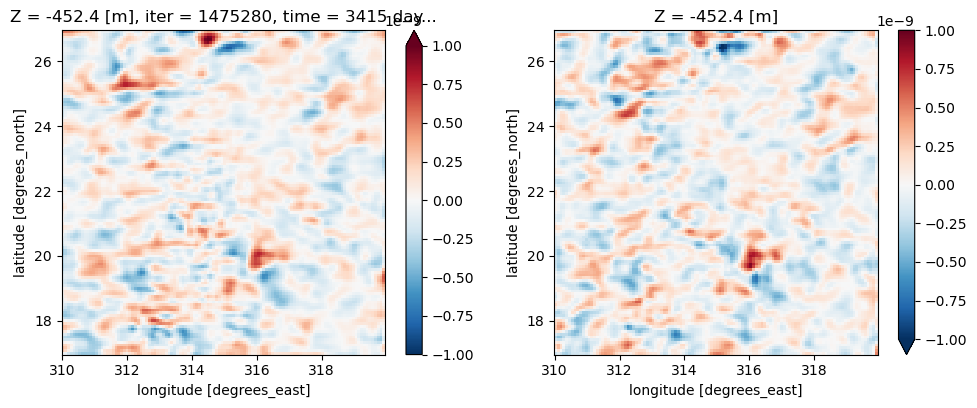

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1475280


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


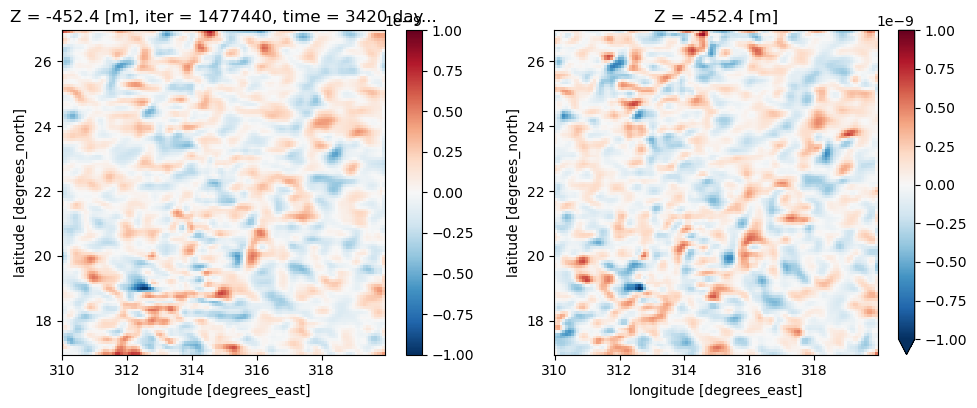

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1477440


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


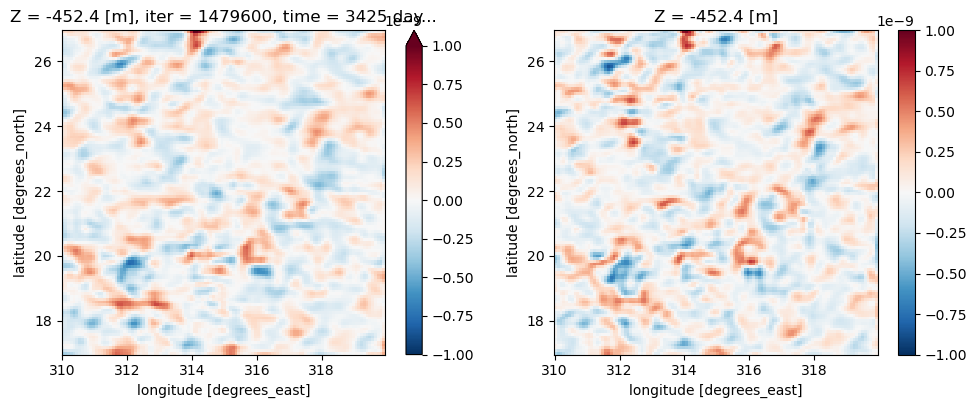

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1479600


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


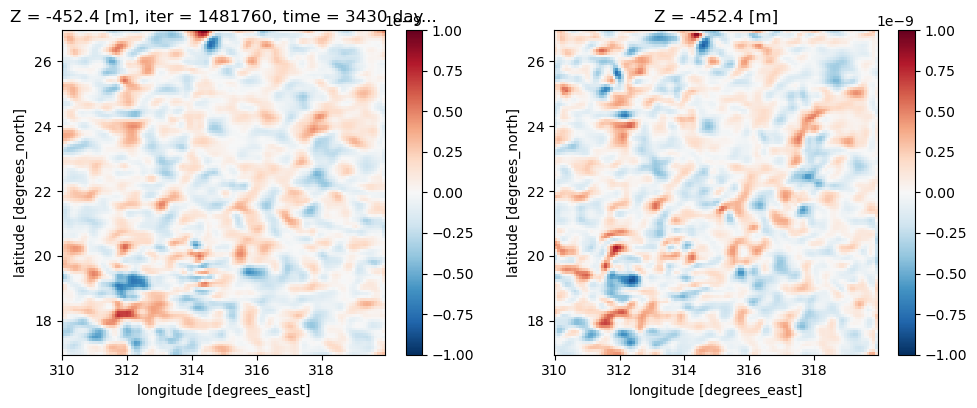

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1481760


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


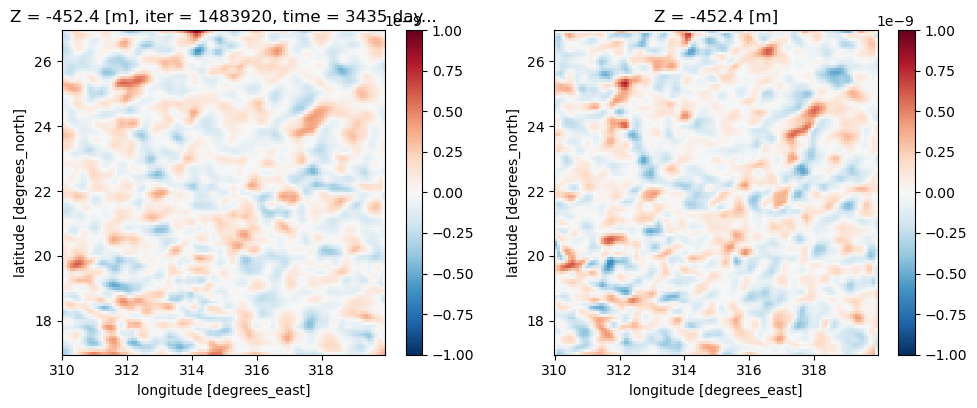

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1483920


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


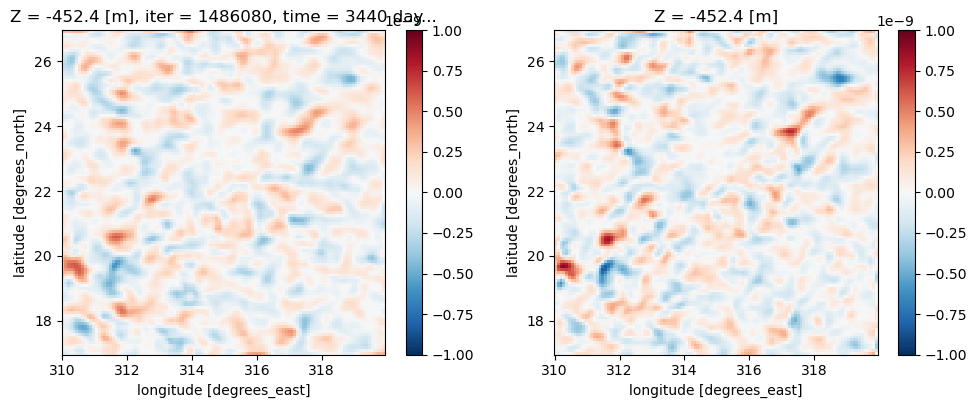

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1486080


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


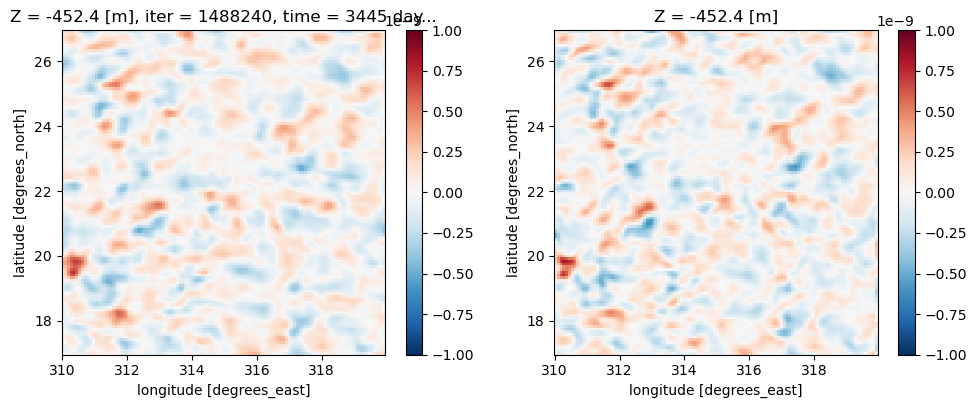

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1488240


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


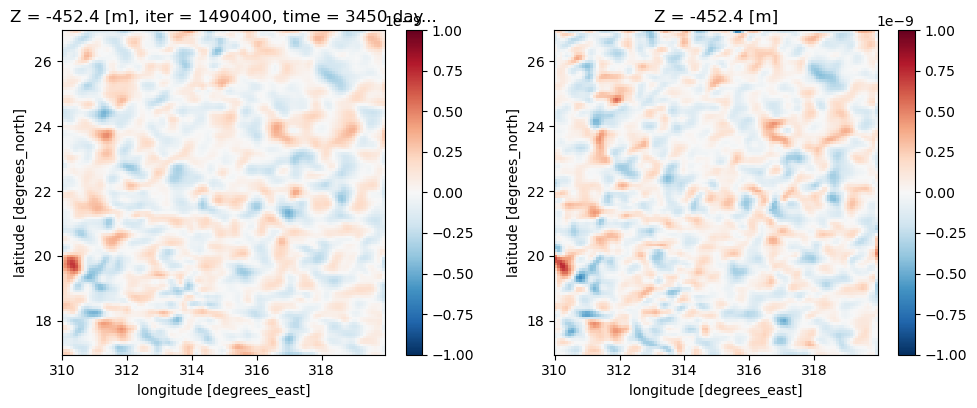

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1490400


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


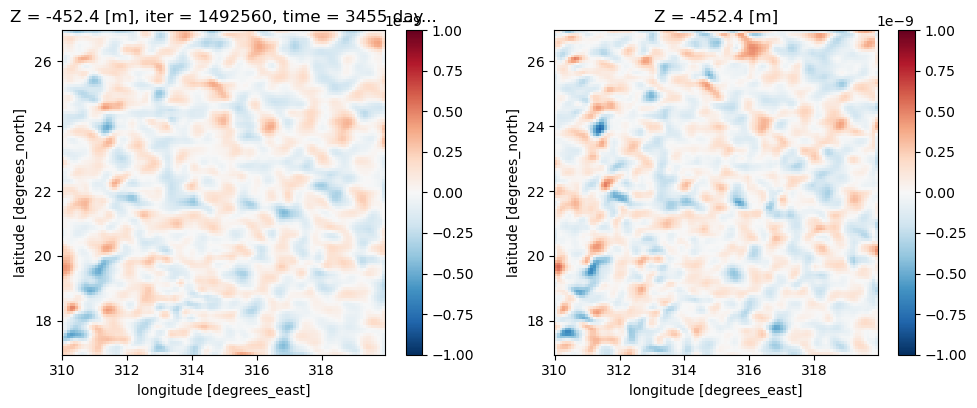

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1492560


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


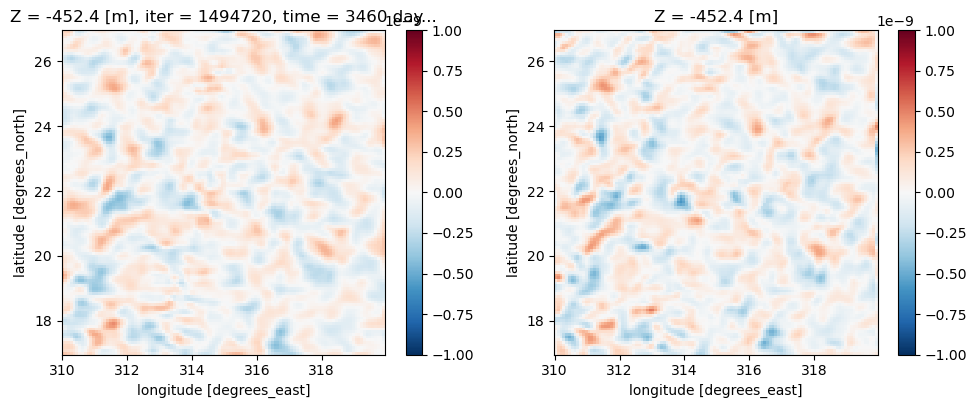

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1494720


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


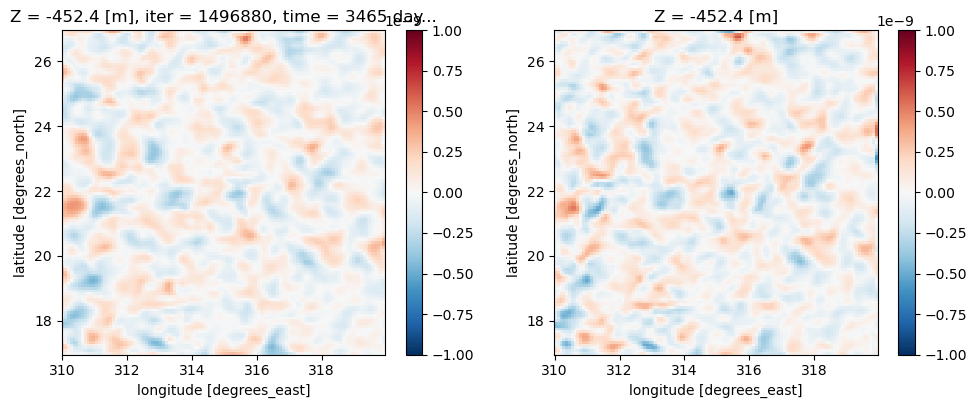

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1496880


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


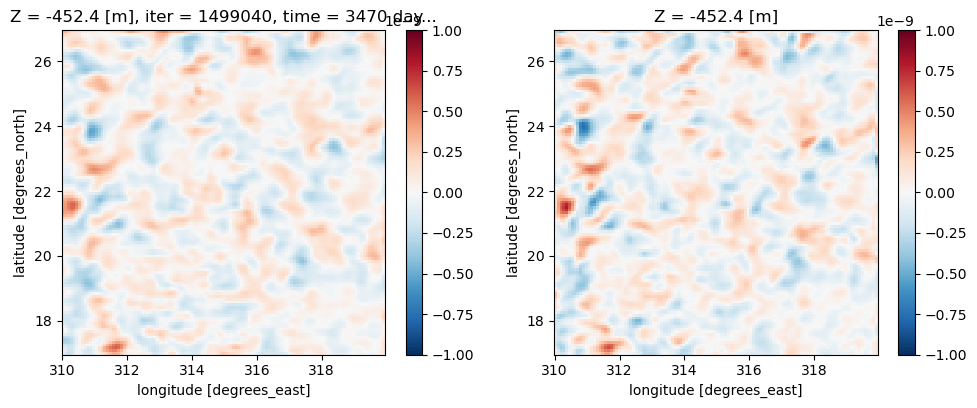

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1499040


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


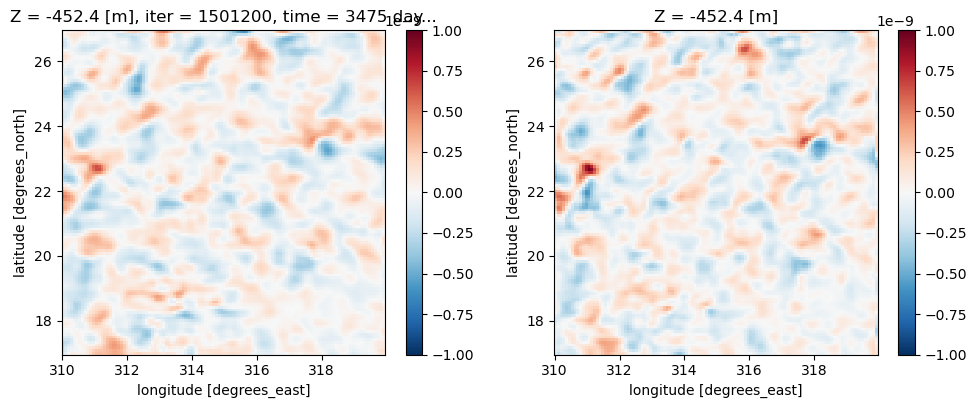

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1501200


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


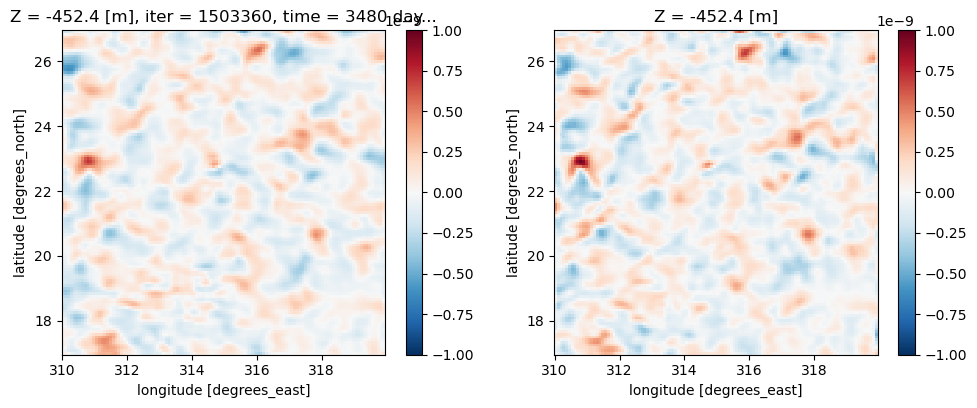

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1503360


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


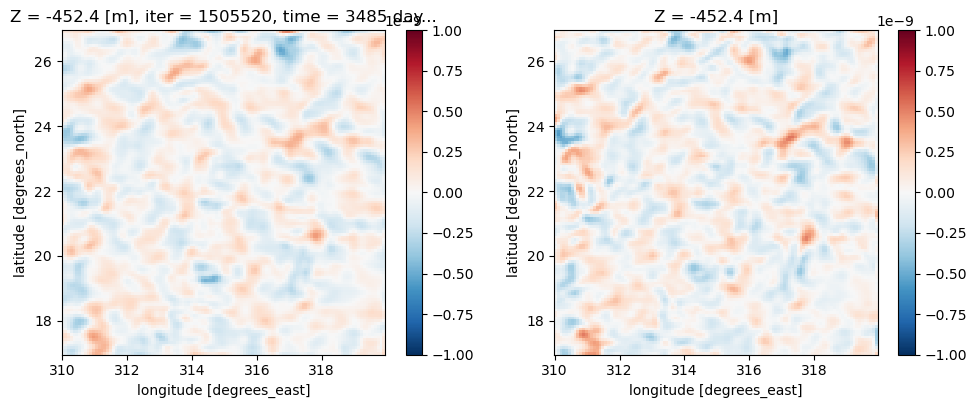

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1505520


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


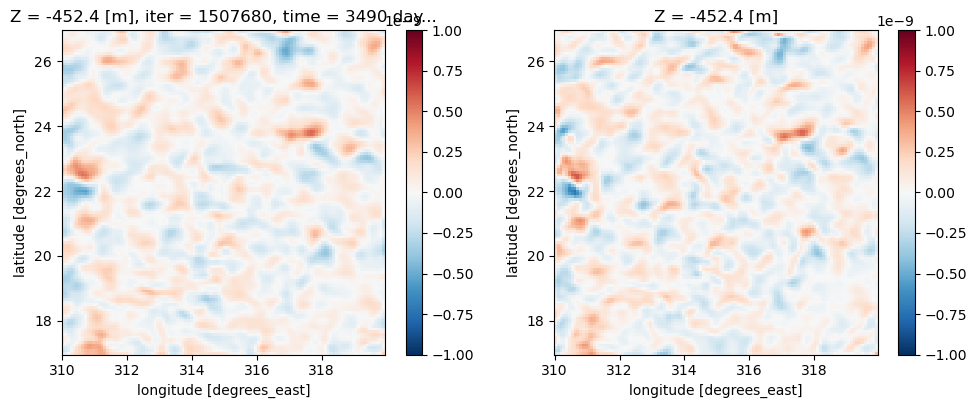

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1507680


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


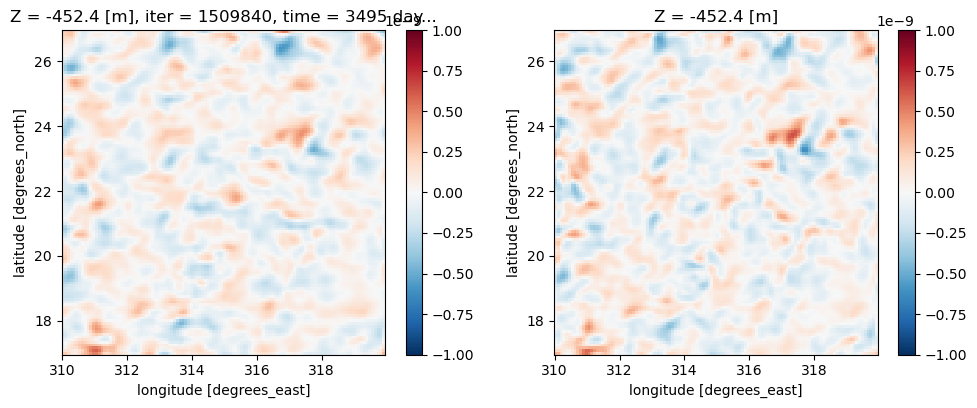

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1509840


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


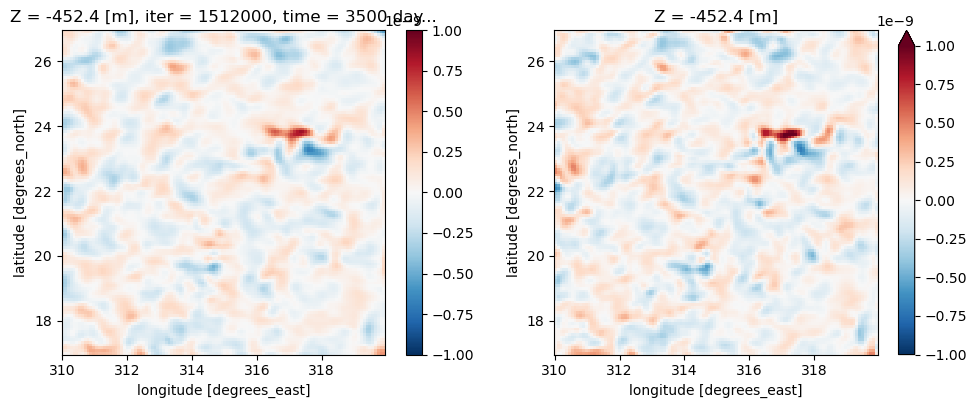

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1512000


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


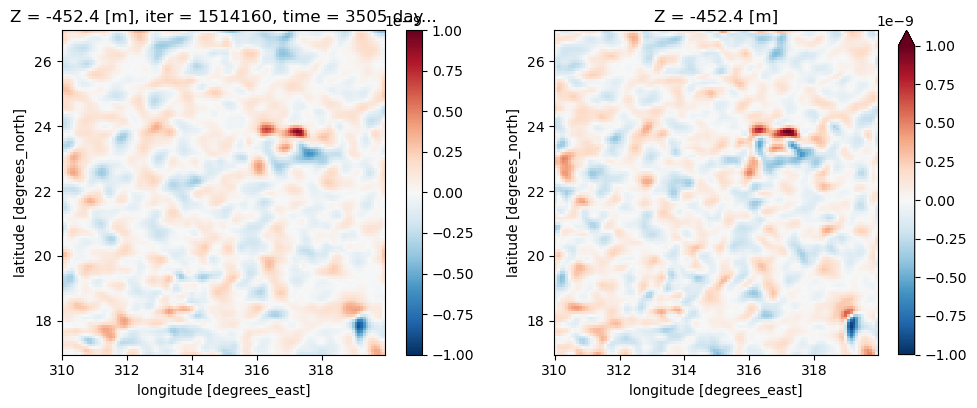

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1514160


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


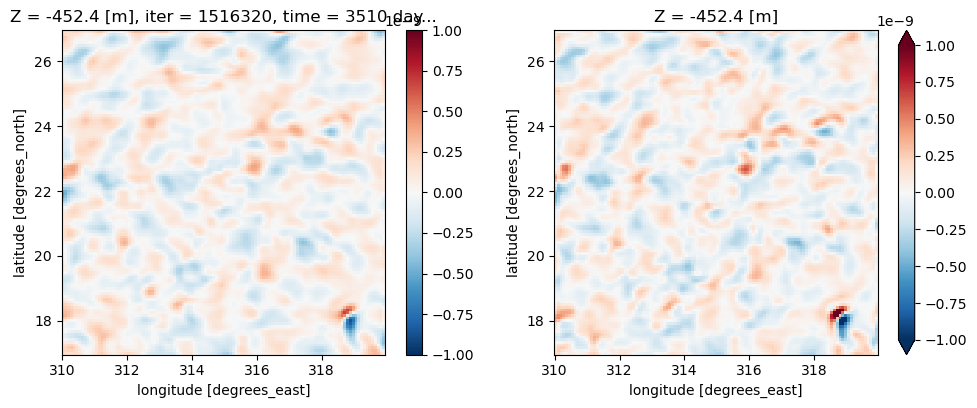

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1516320


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


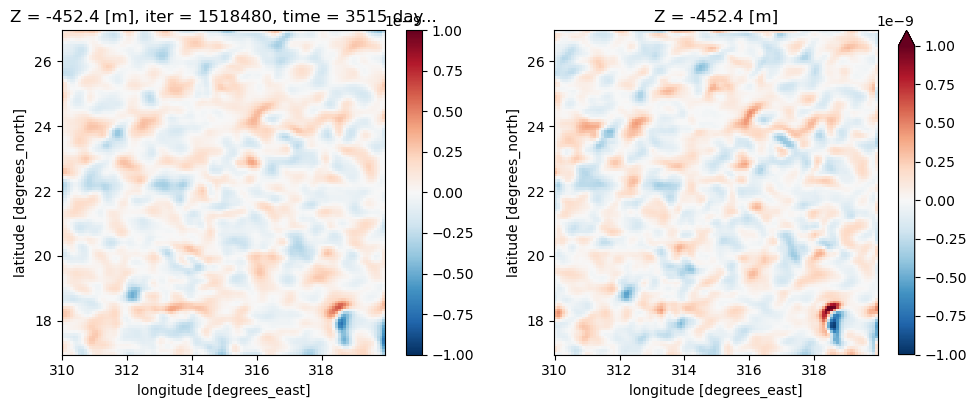

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1518480


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


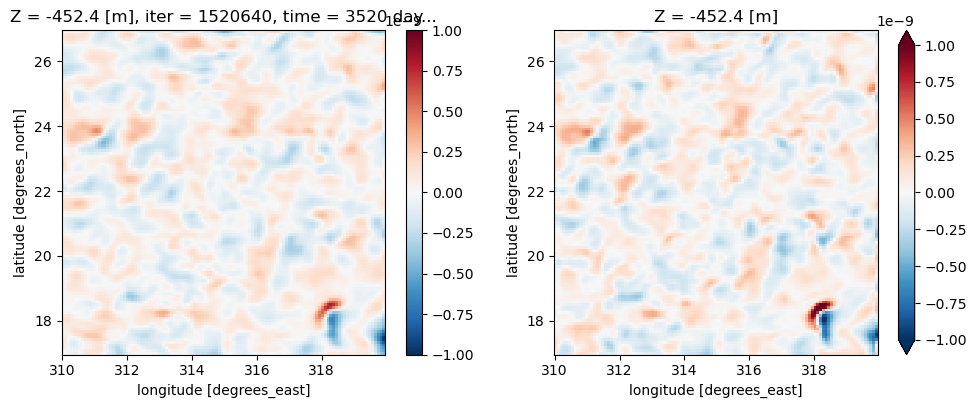

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1520640


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


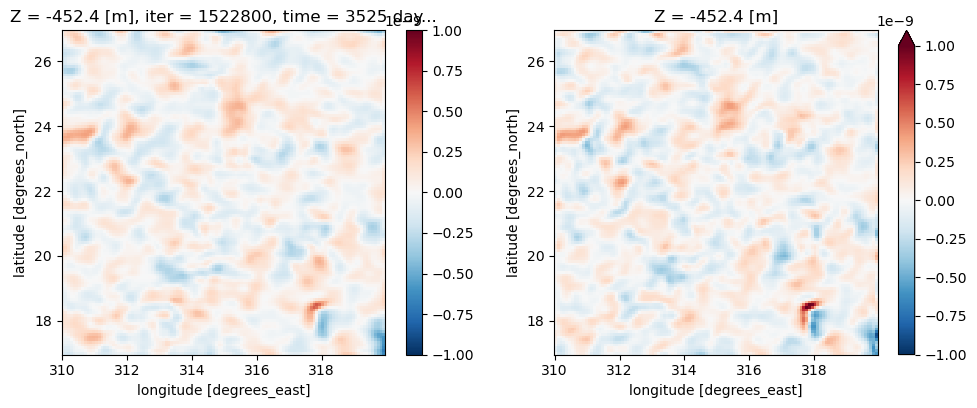

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1522800


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


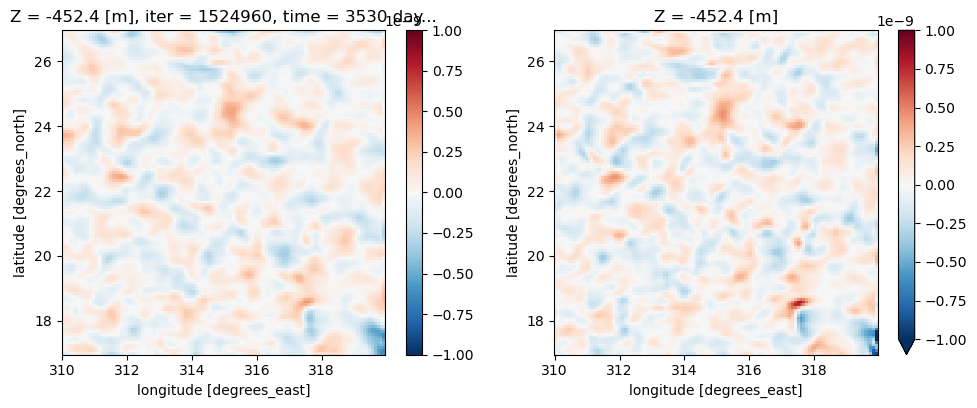

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1524960


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


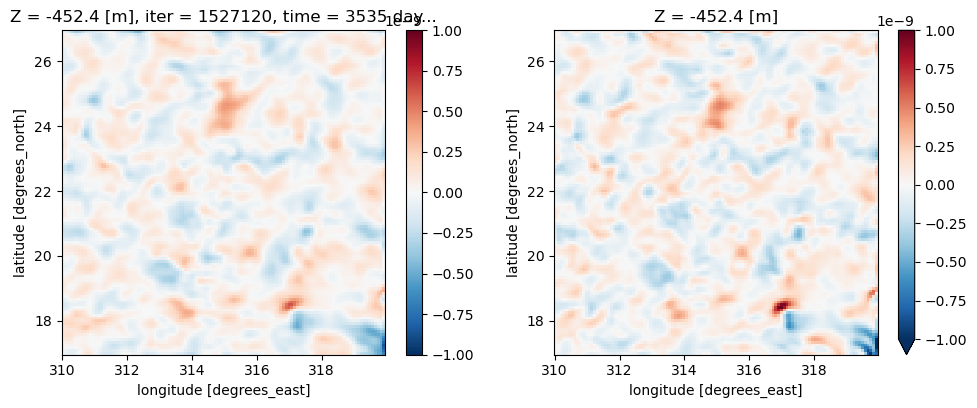

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1527120


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


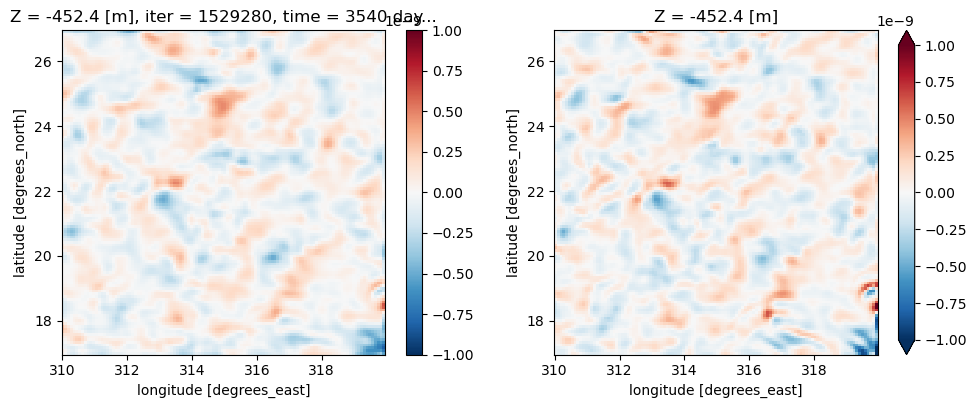

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1529280


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


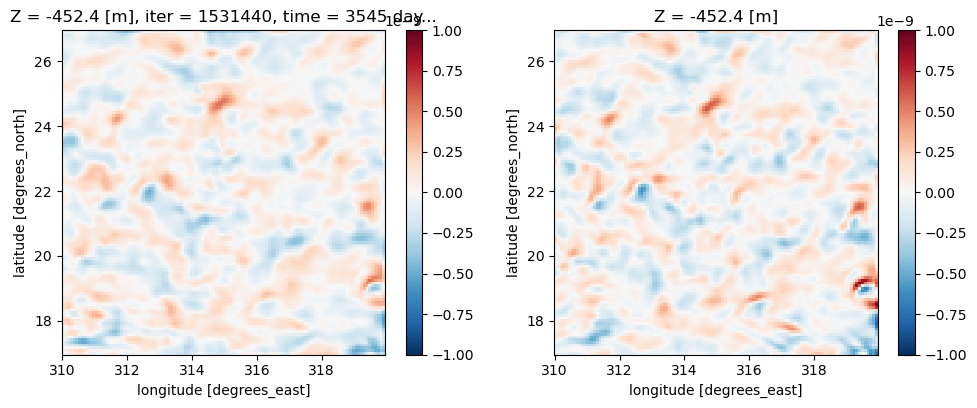

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1531440


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


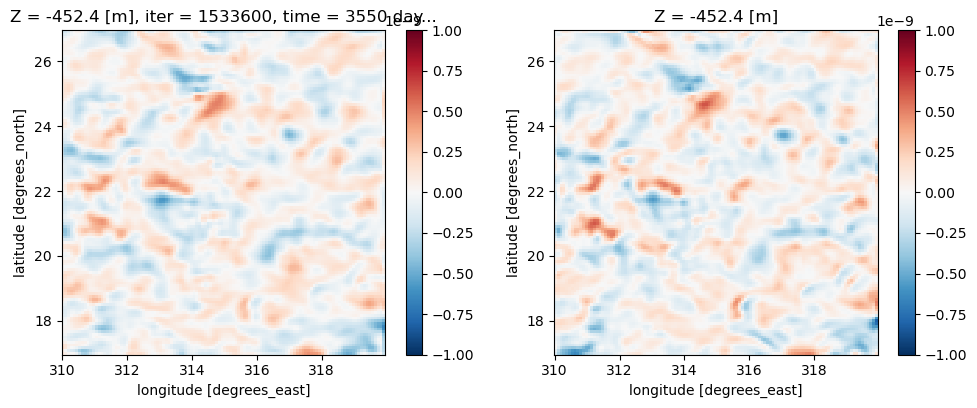

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1533600


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


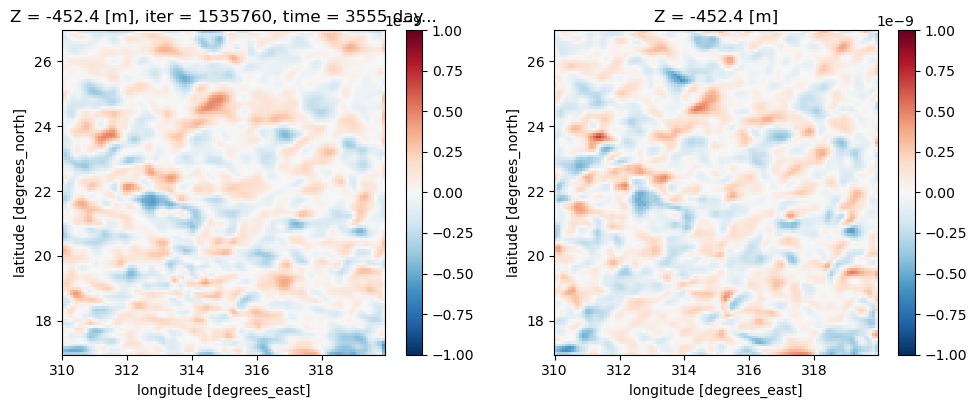

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1535760


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


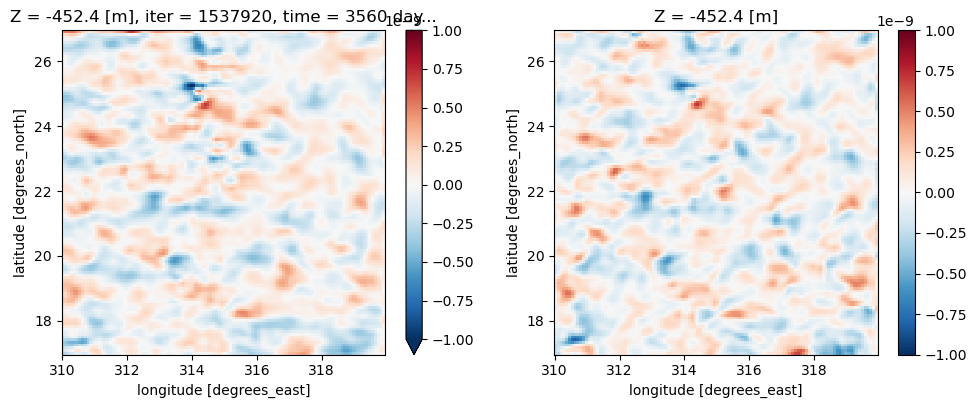

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1537920


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


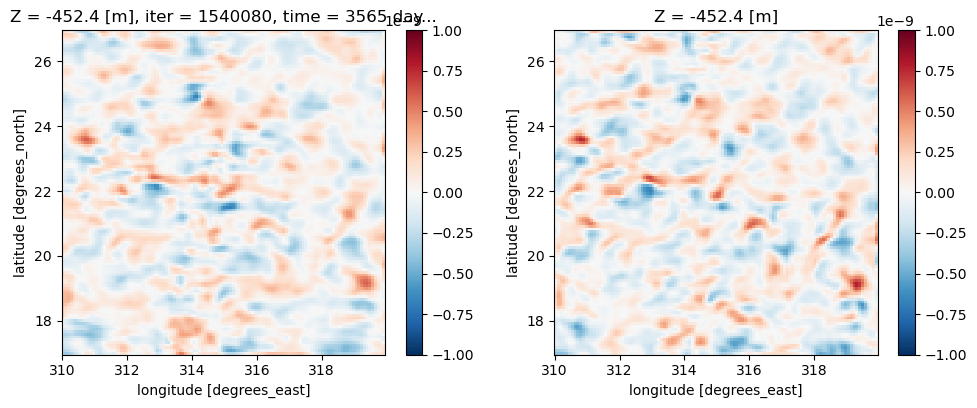

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1540080


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


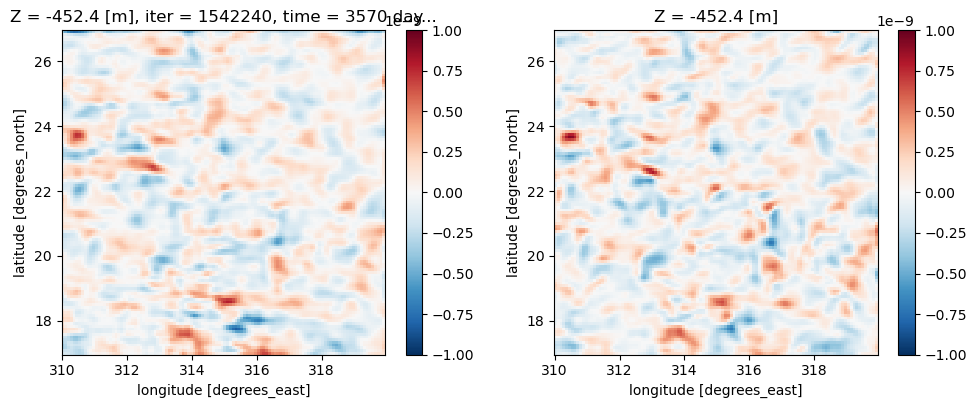

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1542240


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


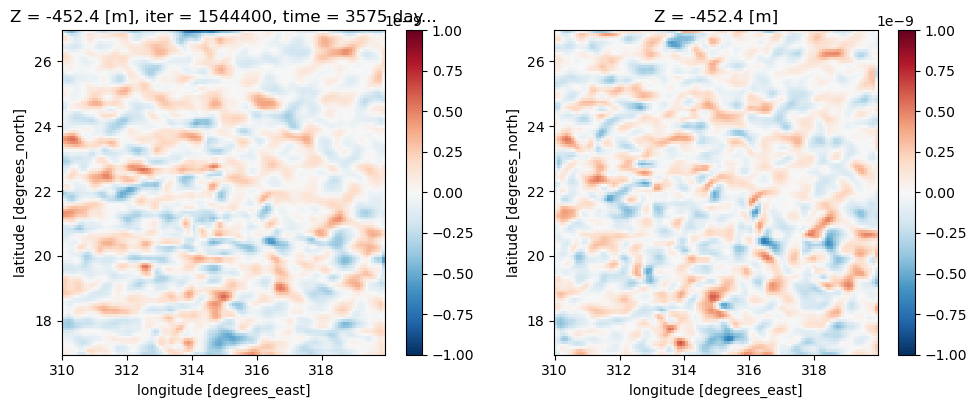

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1544400


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


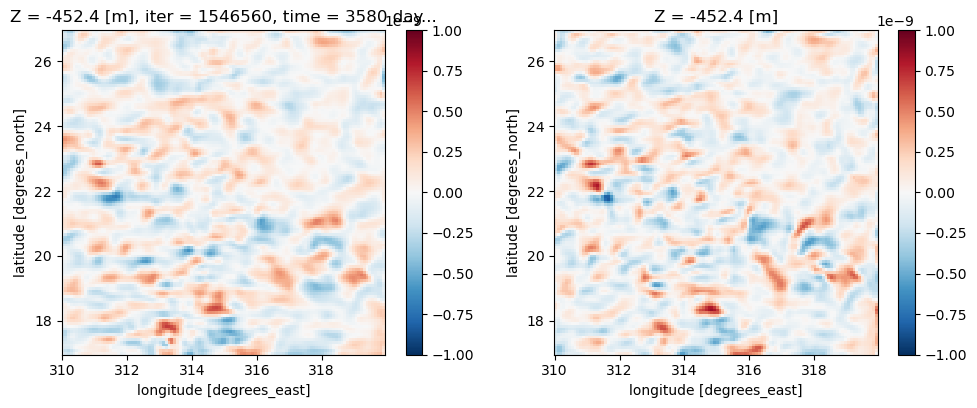

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1546560


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


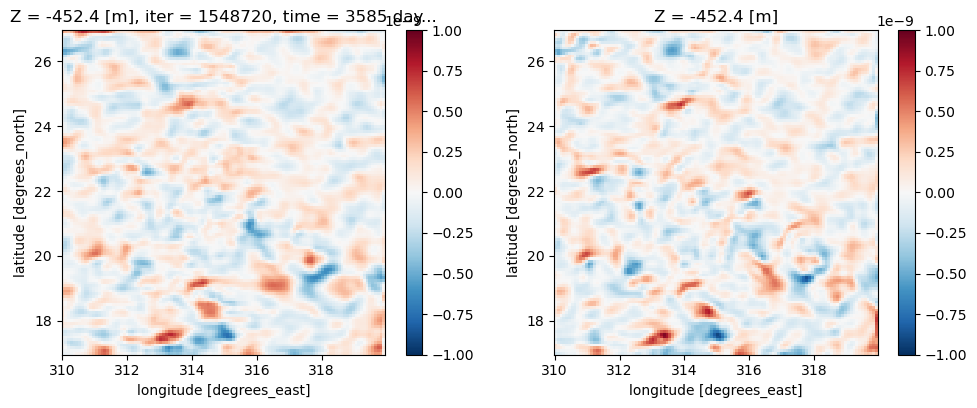

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1548720


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


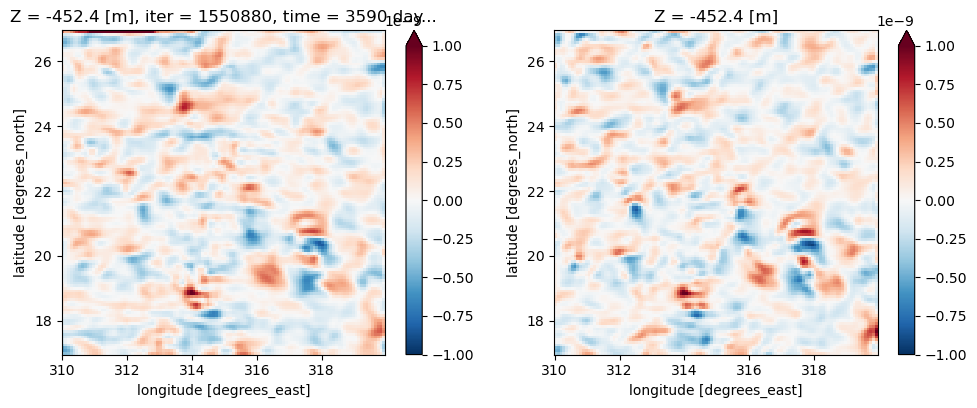

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1550880


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


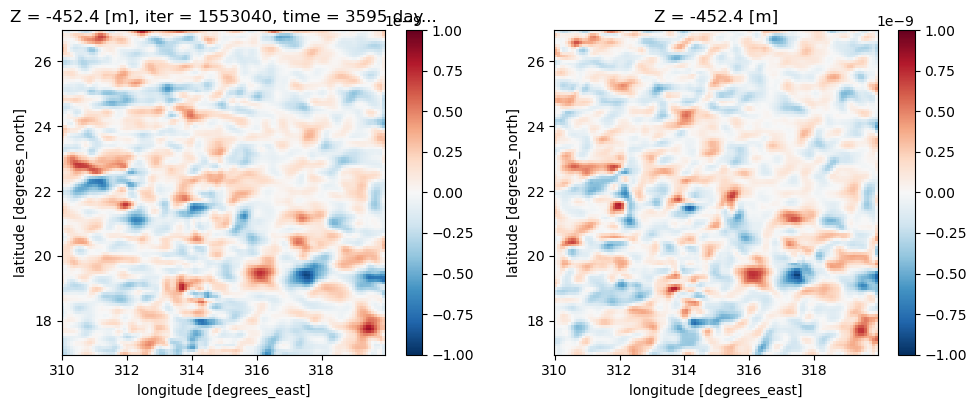

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1553040


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


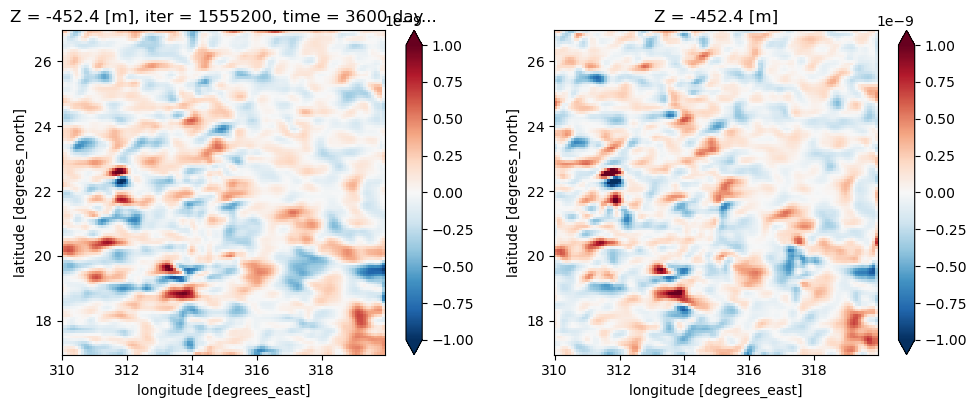

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1555200


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


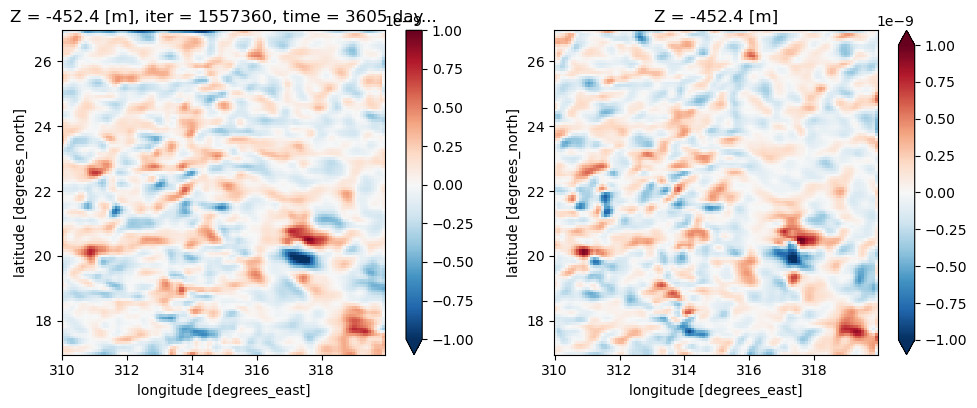

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1557360


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


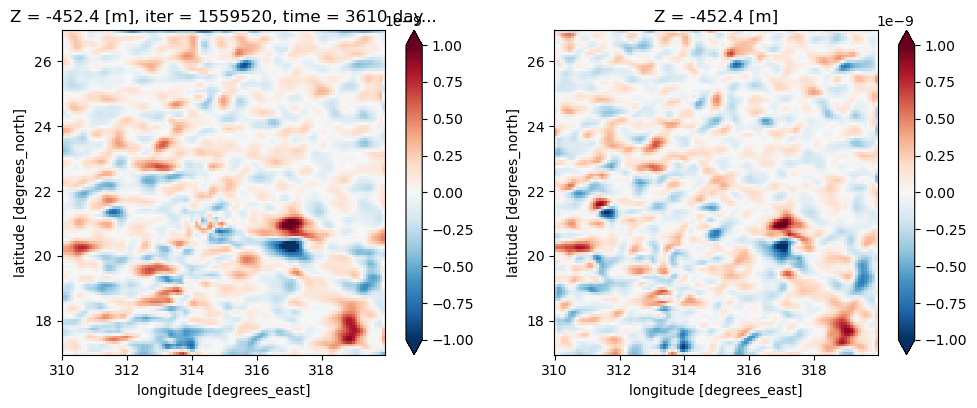

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1559520


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


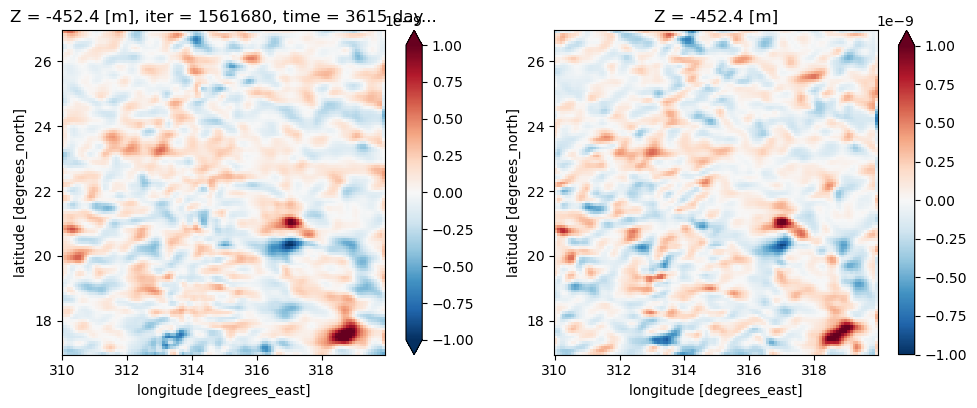

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1561680


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


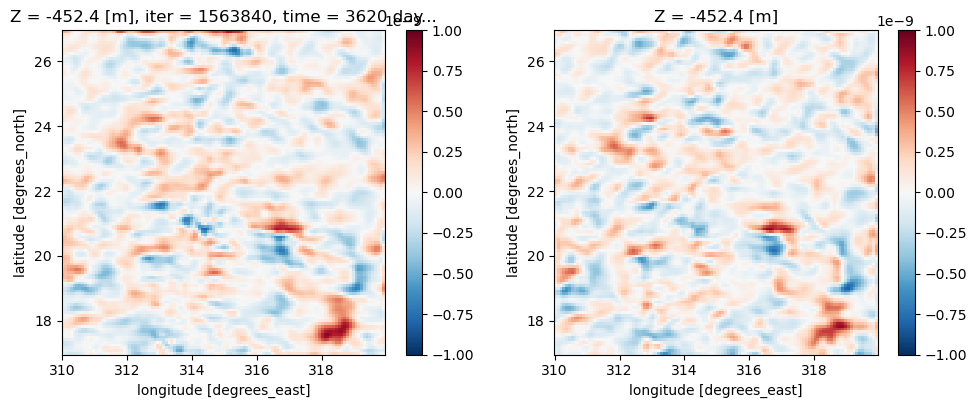

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1563840


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


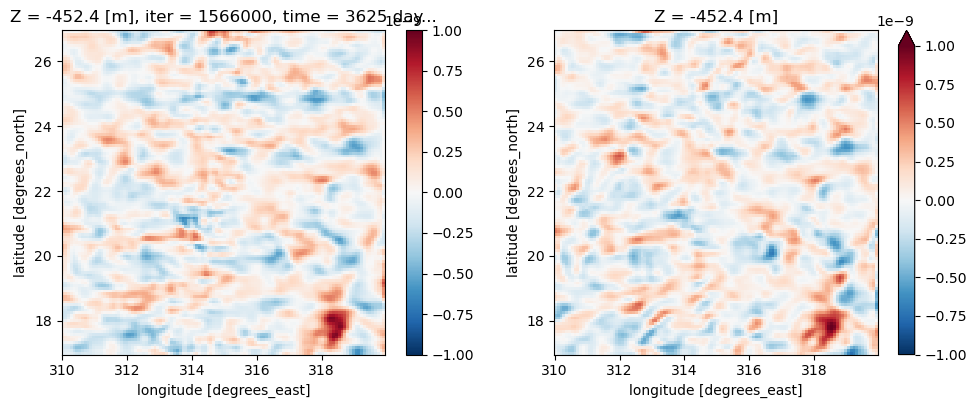

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1566000


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


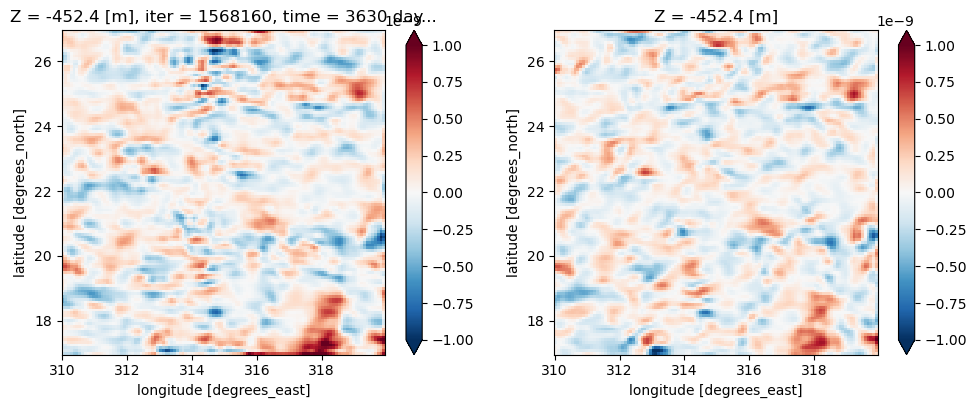

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1568160


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


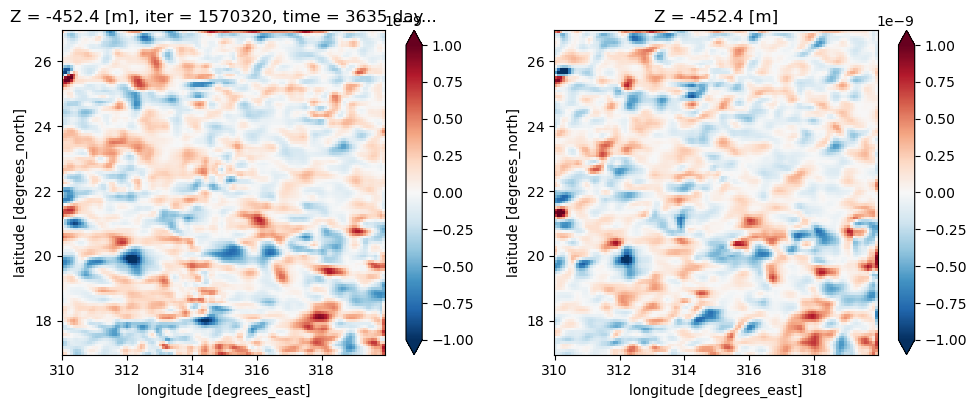

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1570320


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


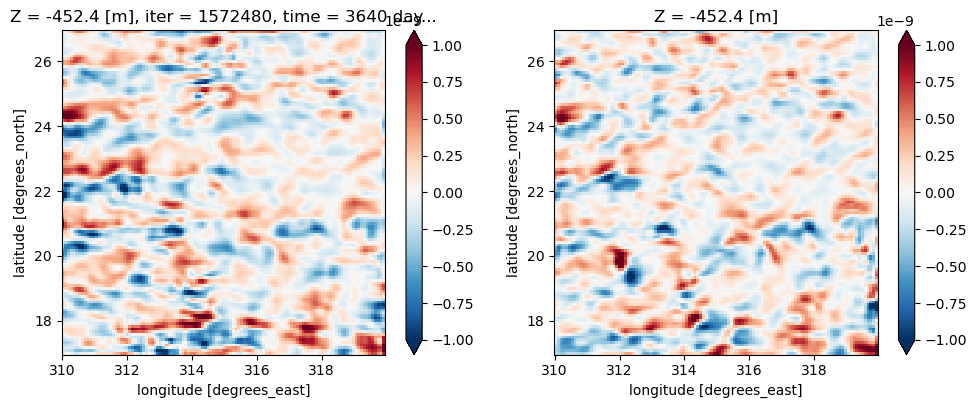

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1572480


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 48
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


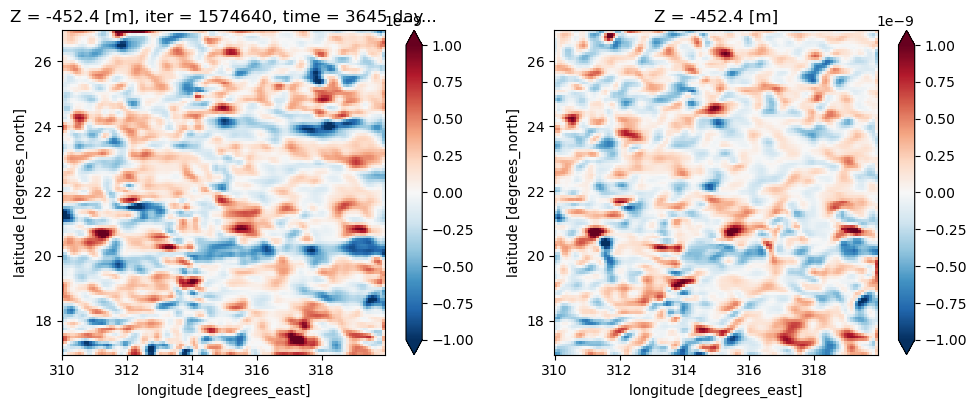

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1574640


In [8]:
reg = 5
dg = 0

for iiter in ntimes[0,dd+1:]:
    dsb = open_mdsdataset(op.join(ddir,'ensm/run1967/ocn'), 
                          grid_dir=gdir,
                          prefix=['snap_diagOcn'], delta_t=2e2,
                          iters=iiter, 
                         ).sel(YC=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                               YG=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                               XC=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12),
                               XG=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12)
                              ).chunk({'Z':1,'Zl':1,'Zu':1,'Zp1':1}).isel(time=0)
    dsUmb = open_mdsdataset(op.join(ddir,'ensm/run1967/ocn'), 
                            grid_dir=gdir,
                            prefix=['diagUm'], delta_t=2e2,
                            iters=iiter, 
                            ignore_unknown_vars=True
                           ).sel(YC=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                                 YG=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                                 XC=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12),
                                 XG=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12)
                                ).chunk({'Z':1,'Zl':1,'Zu':1,'Zp1':1}).isel(time=0)
    dsVmb = open_mdsdataset(op.join(ddir,'ensm/run1967/ocn'), 
                            grid_dir=gdir,
                            prefix=['diagVm'], delta_t=2e2,
                            iters=iiter, 
                            ignore_unknown_vars=True
                           ).sel(YC=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                                 YG=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                                 XC=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12),
                                 XG=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12)
                                ).chunk({'Z':1,'Zl':1,'Zu':1,'Zp1':1}).isel(time=0)

    dsm = xr.open_zarr(op.join(spec,'Snaps_Tot-Adv_EnsMean/%010d.zarr' % iiter)
                      ).sel(YC=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                            YG=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                            XC=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12),
                            XG=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12)
                           ).chunk({'Z':1})

    if len(dsb.XG) > len(dsb.XC):
         dsb = dsb.isel(XG=slice(None,-1))
    if len(dsUmb.XG) > len(dsUmb.XC):
         dsUmb = dsUmb.isel(XG=slice(None,-1))
    if len(dsVmb.XG) > len(dsVmb.XC):
         dsVmb = dsVmb.isel(XG=slice(None,-1))

    grid = Grid(dsb, periodic=[], 
                # coords={'Z': {'center': 'Z', 'outer': 'Zp1', 'left':'Zl', 'right':'Zu'},
                #         'Y': {'center': 'YC', 'left': 'YG'},
                #         'X': {'center': 'XC', 'left': 'XG'}}
               )

    for nmemb in nmembs:
        if nmemb == 100:
            ds = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['snap_diagOcn'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                                   YG=slice(ys[reg]-5,ys[reg]+5),
                                                   XC=slice(xs[reg]-5,xs[reg]+5),
                                                   XG=slice(xs[reg]-5,xs[reg]+5)
                                                  )
            dsU = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['diagUm'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                                   YG=slice(ys[reg]-5,ys[reg]+5),
                                                   XC=slice(xs[reg]-5,xs[reg]+5),
                                                   XG=slice(xs[reg]-5,xs[reg]+5)
                                                  )
            dsV = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['diagVm'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                                   YG=slice(ys[reg]-5,ys[reg]+5),
                                                   XC=slice(xs[reg]-5,xs[reg]+5),
                                                   XG=slice(xs[reg]-5,xs[reg]+5)
                                                  )
        else:
            ds1 = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['snap_diagOcn'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                                   YG=slice(ys[reg]-5,ys[reg]+5),
                                                   XC=slice(xs[reg]-5,xs[reg]+5),
                                                   XG=slice(xs[reg]-5,xs[reg]+5)
                                                  )
            ds = xr.concat([ds, ds1], dim='nmemb')
            ds1.close()
            ds2 = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['diagUm'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                                   YG=slice(ys[reg]-5,ys[reg]+5),
                                                   XC=slice(xs[reg]-5,xs[reg]+5),
                                                   XG=slice(xs[reg]-5,xs[reg]+5)
                                                  )
            dsU = xr.concat([dsU, ds2], dim='nmemb')
            ds2.close()
            ds3 = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['diagVm'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                                   YG=slice(ys[reg]-5,ys[reg]+5),
                                                   XC=slice(xs[reg]-5,xs[reg]+5),
                                                   XG=slice(xs[reg]-5,xs[reg]+5)
                                                  )
            dsV = xr.concat([dsV, ds3], dim='nmemb')
            ds3.close()

                # ds = ds.chunk({'nmemb':6})
    ds.coords['nmemb'] = ('nmemb',nmembs)
    dsV.coords['nmemb'] = ('nmemb',nmembs)
    dsU.coords['nmemb'] = ('nmemb',nmembs)
    if len(ds.XG) > len(ds.XC):
         ds = ds.isel(XG=slice(None,-1))
    if len(dsU.XG) > len(dsU.XC):
         dsU = dsU.isel(XG=slice(None,-1))
    if len(dsV.XG) > len(dsV.XC):
         dsV = dsV.isel(XG=slice(None,-1))
            
    dAuup_true = grid.interp(dsU.Um_Advec - dsU.Um_Cori
                             - dsm.Um_Advec + dsUmb.Um_Cori,
                             'X',boundary='extend'
                            ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).compute()
    dAuvp_true = grid.interp(dsV.Vm_Advec - dsV.Vm_Cori
                             - dsm.Vm_Advec + dsVmb.Vm_Cori,
                             'Y',boundary='extend'
                            ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).compute()
    
    ub = dsb.UVEL
    vb = dsb.VVEL
    wb = dsb.WVEL
    up = ds.UVEL - ub
    vp = ds.VVEL - vb
    wp = ds.WVEL - wb
    
    upC = grid.interp(up,'X',boundary='extend'
                     ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).load()
    vpC = grid.interp(vp,'Y',boundary='extend'
                     ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).load()

    xA = (ds.dyG * ds.drF).reset_coords(drop=True)
    yA = (ds.dxG * ds.drF).reset_coords(drop=True)

    uTrans = up * xA
    vTrans = vp * yA
    rTrans = grid.interp(wp,'X',boundary='extend') * ds.rAw
    Auub = (grid.interp(uTrans,'X',boundary='extend')
            * grid.interp(ub,'X',boundary='extend')
           )
    Avub = (grid.interp(vTrans,'X',boundary='extend')
            * grid.interp(ub,'Y',boundary='extend')
           )
    Awub = (rTrans
            * grid.interp(ub,'Z',boundary='extend')
           )

    rTrans = grid.interp(wp,'Y',boundary='extend') * ds.rAs
    Auvb = (grid.interp(uTrans,'Y',boundary='extend')
            * grid.interp(vb,'X',boundary='extend')
           )
    Avvb = (grid.interp(vTrans,'Y',boundary='extend')
            * grid.interp(vb,'Y',boundary='extend')
           )
    Awvb = (rTrans
            * grid.interp(vb,'Z',boundary='extend')
           )
    Aut = grid.interp(((grid.diff(Auub,'X',boundary='extend')
                        + grid.diff(Avub,'Y',boundary='extend')
                        - grid.diff(Awub,'Z',boundary='extend')
                       ) / ds.drF/ds.rAw
                      ).reset_coords(drop=True),
                      'X',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18]).compute()
    Avt = grid.interp(((grid.diff(Auvb,'X',boundary='extend')
                        + grid.diff(Avvb,'Y',boundary='extend')
                        - grid.diff(Awvb,'Z',boundary='extend')
                       ) / ds.drF/ds.rAs
                      ).reset_coords(drop=True),
                      'Y',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18]).compute()
    
    UTrans = ub * xA
    VTrans = vb * yA
    RTrans = wb * ds.rA
    AUup = (UTrans
            * up
           )
    AVup = (VTrans
            * grid.interp(grid.interp(up,'Y',boundary='extend'),'X',boundary='extend')
           )
    AWup = (RTrans
            * grid.interp(grid.interp(up,'Z',boundary='extend'),'X',boundary='extend')
           )
    dAUup = ((grid.diff(AUup,'X',boundary='extend')
              + grid.diff(AVup,'Y',boundary='extend')
              - grid.diff(AWup,'Z',boundary='extend')
             ) / ds.drF/ds.rA
            ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).load()

    rTrans = wp * ds.rA
    Auup = (uTrans
            * up
           )
    Avup = (vTrans
            * grid.interp(grid.interp(up,'Y',boundary='extend'),'X',boundary='extend')
           )
    Awup = (rTrans
            * grid.interp(grid.interp(up,'Z',boundary='extend'),'X',boundary='extend')
           )
    dAuup = ((grid.diff(Auup,'X',boundary='extend')
              + grid.diff(Avup,'Y',boundary='extend')
              - grid.diff(Awup,'Z',boundary='extend')
             ) / ds.drF/ds.rA
            ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).load()
    dAuup_true = dAuup_true + (Aut + dAUup)
    
    AUvp = (UTrans
            * grid.interp(grid.interp(vp,'Y',boundary='extend'),'X',boundary='extend')
           )
    AVvp = (VTrans
            * vp
           )
    AWvp = (RTrans
            * grid.interp(grid.interp(vp,'Z',boundary='extend'),'Y',boundary='extend')
           )
    dAUvp = ((grid.diff(AUvp,'X',boundary='extend')
              + grid.diff(AVvp,'Y',boundary='extend')
              - grid.diff(AWvp,'Z',boundary='extend')
             ) / ds.drF/ds.rA
            ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).load()

    Auvp = (uTrans
            * grid.interp(grid.interp(vp,'Y',boundary='extend'),'X',boundary='extend')
           )
    Avvp = (vTrans
            * vp
           )
    Awvp = (rTrans
            * grid.interp(grid.interp(vp,'Z',boundary='extend'),'Y',boundary='extend')
           )
    dAuvp = ((grid.diff(Auvp,'X',boundary='extend')
              + grid.diff(Avvp,'Y',boundary='extend')
              - grid.diff(Awvp,'Z',boundary='extend')
             ) / ds.drF/ds.rA
            ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).load()
    dAuvp_true = dAuvp_true + (Avt + dAUvp)
    
    fig, (ax1,ax2) = plt.subplots(figsize=(10,4), nrows=1, ncols=2)
    fig.set_tight_layout(True)

    (vpC*dAuvp_true).isel(Z=1).mean('nmemb').plot(ax=ax1, rasterized=True, vmax=1e-9)
    (-vpC*dAuvp).mean('nmemb').isel(Z=1).plot(ax=ax2, rasterized=True, vmax=1e-9)

    ax1.set_aspect('equal')
    ax2.set_aspect('equal')
    plt.show()
    
    xT = grid.cumsum(ds.dxC,'X',boundary='extend'
                    )
    yT = grid.cumsum(ds.dyC,'Y',boundary='extend'
                    )
    ny, nx = xT.shape
    xT = xT - xT.isel(XC=nx//2)
    xT = (xT - xT.isel(YC=-1,XC=0)).values.flatten()
    yT = (yT - yT.isel(YC=0)).values.flatten()
    dx = ds.dxC.min().values
    dy = ds.dyC.min().values
    N = ds.THETA.isel(nmemb=0,Z=0).shape

    xxx, yyy = np.mgrid[0:N[-1]*dx:dx, 0:N[-2]*dy:dy]
    ntheta = 36
    ss = xr.open_zarr(
        '/tank/topog/tuchida/Wavelet-spectrum/isoDiags_KE_region%02d_1967-01-01.zarr' 
                      % reg).scale/xo
    
    rAterp = griddata((xT, yT), ds.rA.values.flatten(),
                  (xxx, yyy) 
                 ).T
    
    uterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                         coords={'nmemb':nmembs,'Z':upC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )
    vterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                         coords={'nmemb':nmembs,'Z':vpC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )

    for iz in range(len(upC.Z)):
        for nn in range(len(nmembs)):
            uterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT),
                                                  (upC*ds.rA
                                                  ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 
            vterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                  (vpC*ds.rA
                                                  ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 

    uterp = uterp / rAterp
    vterp = vterp / rAterp
    
    duuterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                         coords={'nmemb':nmembs,'Z':upC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )
    duvterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                          coords={'nmemb':nmembs,'Z':upC.Z,
                                  'YC':np.arange(0,N[-2]*dy,dy),
                                  'XC':np.arange(0,N[-1]*dx,dx)}
                         )

    for iz in range(len(upC.Z)):
        for nn in range(len(nmembs)): 
            duuterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                    (dAuup_true*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T
            duvterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                    (dAuvp_true*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T 

    duuterp = duuterp / rAterp
    duvterp = duvterp / rAterp

    iso_uuu = xwavelet.wvlt_cross_spectrum(
                        uterp, duuterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
            )
    iso_vuv = xwavelet.wvlt_cross_spectrum(
                        vterp, duvterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
            )

    dsave = iso_uuu.to_dataset(name='iso_uuu')
    dsave['iso_vuv'] = iso_vuv
    dsave.encoding = {}
    fname = op.join(spec,'Points/%s/%010d/isoDiags_u-v-adv_eddies-as-residual.zarr' 
                    % (sreg[reg],iiter))
    dsave.to_zarr(fname, mode='w')
    dsave.close()
    print(iiter)

In [10]:
reg = 5
dg = 0
iZ = 1

pAs = []
mAs = []
pAm = []
mAm = []
pAl = []
mAl = []

for iiter in ntimes[0,:]:
    
    if iiter < ntimes[0,3]:
        if iiter == ntimes[0,0]:
            ds0 = xr.open_dataset(op.join(savedir,
                                          'isoDiags_u_region%02d_1967-01-01.zarr' 
                                          % reg)).isel(Z=iZ)
            ds1 = xr.open_dataset(op.join(savedir,
                                          'isoDiags_v_region%02d_1967-01-01.zarr' 
                                          % reg)).isel(Z=iZ)
        else:
            if reg == 0:
                ds0 = xr.open_dataset(op.join(savedir,
                                              'isoDiags_u_region%02d_%010d.zarr' 
                                              % (reg,iiter))
                                     ).isel(Z=iZ)
                ds1 = xr.open_dataset(op.join(savedir,
                                              'isoDiags_v_region%02d_%010d.zarr' 
                                              % (reg,iiter))
                                     ).isel(Z=iZ)
            else:
                ds0 = xr.open_dataset(op.join(spec,
                                              'Points/%s/%010d/isoDiags_u.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)
                ds1 = xr.open_dataset(op.join(spec,
                                              'Points/%s/%010d/isoDiags_v.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)
        if reg == 0:
            ds4 = xr.open_dataset(op.join(spec,
                                          'Z0452/Points/%s/%010d/isoDiags-SP.zarr' 
                                          % (sreg[reg],iiter))
                                 ).isel(Z=iZ)
        else:
            ds4 = xr.open_dataset(op.join(spec,
                                          'Points/%s/%010d/isoDiags-SP.zarr' 
                                          % (sreg[reg],iiter))
                                 ).isel(Z=iZ)
    else:
        ds0 = xr.open_dataset(op.join(spec,
                                      'Points/%s/%010d/isoDiags_u.zarr' 
                                      % (sreg[reg],iiter))
                             ).isel(Z=iZ)
        ds1 = xr.open_dataset(op.join(spec,
                                      'Points/%s/%010d/isoDiags_v.zarr' 
                                      % (sreg[reg],iiter))
                             ).isel(Z=iZ)
        ds4 = xr.open_dataset(op.join(spec,
                                      'Points/%s/%010d/isoDiags-SP.zarr' 
                                      % (sreg[reg],iiter))
                             ).isel(Z=iZ)
    dtau = xr.open_zarr(op.join(spec,'Points/%s/%010d/isoDiags_u_tend-adv.zarr' 
                                % (sreg[reg],iiter))
                       ).isel(Z=iZ)
    dtav = xr.open_zarr(op.join(spec,'Points/%s/%010d/isoDiags_v_tend-adv.zarr' 
                                % (sreg[reg],iiter))
                       ).isel(Z=iZ)
    
    dks = xr.DataArray(np.abs(np.diff(ds4.scale**-1)).data, dims='scale',
                       coords={'scale':.5*(ds4.scale[1:].data + ds4.scale[:-1].data)}
                      ).interp(scale=ds4.scale, kwargs={"fill_value": "extrapolate"})
    
    SPu = ds4.iso_SPu
    SPv = ds4.iso_SPv
    SP = (SPu + SPv)
    Ak = (dtau.iso_uA + dtav.iso_vA
          # ds0.iso_uA + ds1.iso_vA
          # - MtE
          + SP
         )
    
    piw = ((Ak * dks).sum('angle').where(Ak.scale<80e3).sum('scale').mean('nmemb').compute() 
           * np.diff(ds0.angle)[0]*2)
    MtE = ((-SP * dks).sum('angle').where(SP.scale<80e3).sum('scale').mean('nmemb').compute() 
           * np.diff(ds0.angle)[0]*2)
    
    pAs.append(piw.values)
    mAs.append(MtE.values)
    piw = ((Ak * dks).sum('angle').where(Ak.scale<250e3).sum('scale').mean('nmemb').compute() 
           * np.diff(ds0.angle)[0]*2)
    MtE = ((-SP * dks).sum('angle').where(SP.scale<250e3).sum('scale').mean('nmemb').compute() 
           * np.diff(ds0.angle)[0]*2)
    
    pAm.append(piw.values)
    mAm.append(MtE.values)
    piw = ((Ak * dks).sum('angle').sum('scale').mean('nmemb').compute() 
           * np.diff(ds0.angle)[0]*2)
    MtE = ((-SP * dks).sum('angle').sum('scale').mean('nmemb').compute() 
           * np.diff(ds0.angle)[0]*2)
    
    pAl.append(piw.values)
    mAl.append(MtE.values)
    
    del piw, MtE
    ds0.close()
    ds1.close()
    ds4.close()
mAs

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'scipy' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'scipy' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails wh

[array(-3.44184627e-12),
 array(-1.76265206e-12),
 array(-5.36294716e-12),
 array(-7.98964921e-13),
 array(4.78179532e-13),
 array(-1.29682223e-12),
 array(-1.20438136e-12),
 array(-1.16992208e-12),
 array(-3.24772284e-12),
 array(-1.48581743e-12),
 array(1.78954371e-12),
 array(-7.29299864e-13),
 array(3.63000909e-13),
 array(-9.32622925e-13),
 array(2.00001777e-12),
 array(-4.10542504e-14),
 array(7.42651164e-13),
 array(-1.49602501e-13),
 array(-2.52093857e-12),
 array(-2.2244322e-12),
 array(-3.72427721e-12),
 array(-9.27442077e-13),
 array(-3.67673368e-12),
 array(-3.45517104e-12),
 array(-1.94706551e-12),
 array(-2.2712108e-12),
 array(-2.74269563e-12),
 array(-4.33496467e-12),
 array(-1.84113795e-12),
 array(-1.66006445e-12),
 array(-2.208054e-12),
 array(-2.48069396e-12),
 array(-2.58160123e-12),
 array(-1.24593293e-12),
 array(-1.43423406e-12),
 array(-2.30936616e-12),
 array(1.01811646e-13),
 array(-1.95415024e-12),
 array(-1.27931509e-13),
 array(-4.3898871e-13),
 array(-1.1

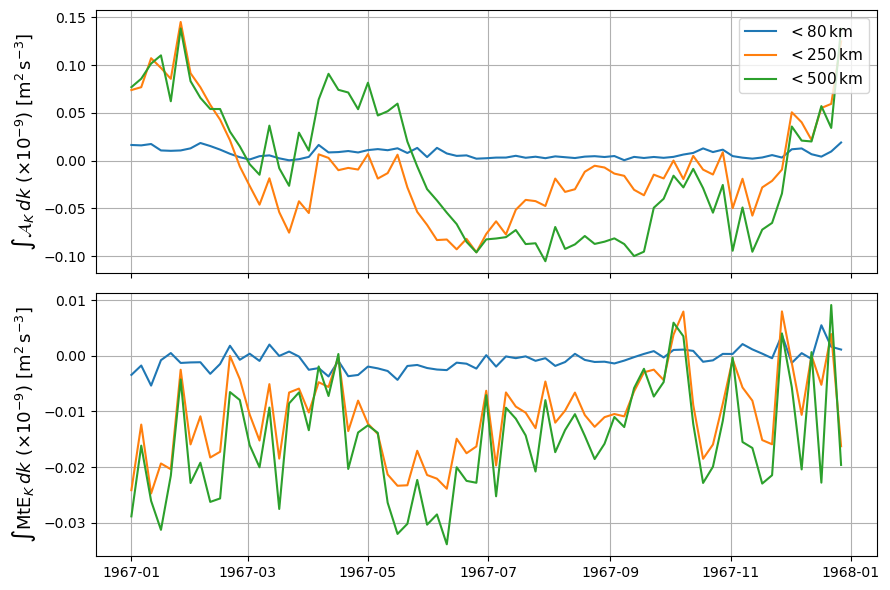

In [11]:
from datetime import datetime, timedelta
time = np.arange(datetime(1967,1,1), datetime(1967,12,31), timedelta(days=5)).astype(datetime)

prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

fig, (ax,ax2) = plt.subplots(figsize=(9,6), nrows=2, ncols=1)
fig.set_tight_layout(True)
# ax2 = ax.twinx()
ax.plot(time, np.asarray(pAs)*1e9, label=r"$<$80$\,$km")
ax.plot(time, np.asarray(pAm)*1e9, label=r"$<$250$\,$km")
# ax.plot(time, sB, label=r"B")
# ax.plot(time, sC, label=r"C")
# ax.plot(time, sD, label=r"D")
# ax.plot(time, sE, label=r"E")
ax.plot(time, np.asarray(pAl)*1e9, label=r"$<$500$\,$km")

ax2.plot(time, np.asarray(mAs)*1e9, label=r"$<$80$\,$km")
ax2.plot(time, np.asarray(mAm)*1e9, label=r"$<$250$\,$km")
# ax.plot(time, sB, label=r"B")
# ax.plot(time, sC, label=r"C")
# ax.plot(time, sD, label=r"D")
# ax.plot(time, sE, label=r"E")
ax2.plot(time, np.asarray(mAl)*1e9, label=r"$<$500$\,$km")

# ax.legend(loc='lower left', fontsize=11)
ax.legend(loc='upper right', fontsize=11)

# ax.spines['left'].set_color(colors[0])
# for t in ax.yaxis.get_ticklines(): t.set_color(colors[0])
# ax.yaxis.label.set_color(colors[0])
# ax.tick_params(axis='y', colors=colors[0])

# ax2.spines['right'].set_color(colors[1])
# for t in ax2.yaxis.get_ticklines(): t.set_color(colors[1])
# ax2.yaxis.label.set_color(colors[1])
# ax2.tick_params(axis='y', colors=colors[1])

# ax.set_ylim([-4.4,-2.5])
# ax2.set_ylim([-4.4,-2.5])
ax.set_xticklabels([])

ax.set_ylabel(r"$\int\mathcal{A}_K\, dk\ (\times10^{-9})$ [m$^2\,$s$^{-3}$]", fontsize=13)
ax2.set_ylabel(r"$\int$MtE$_K\, dk\ (\times10^{-9})$ [m$^2\,$s$^{-3}$]", fontsize=13)
ax.grid(True)
ax2.grid(True)

plt.savefig(op.join(savedir, 'Figs/EKEfluxes_B.pdf'))

In [36]:
reg = 0
dg = 0
iZ = 1


for iiter in ntimes[0,::3]:
    
    if iiter < ntimes[0,3]:
        if iiter == ntimes[0,0]:
            if reg == 0:
                ds0 = xr.open_dataset(op.join(savedir,
                                              'isoDiags_u_region%02d_1967-01-01.zarr' 
                                              % reg)).isel(Z=iZ)
                ds1 = xr.open_dataset(op.join(savedir,
                                              'isoDiags_v_region%02d_1967-01-01.zarr' 
                                              % reg)).isel(Z=iZ)
                ds2 = xr.open_dataset(op.join(savedir,'isoDiags-ext_u_region%02d_1967-01-01.zarr' 
                                              % reg)
                                     ).isel(Z=iZ)
                ds3 = xr.open_dataset(op.join(savedir,'isoDiags-ext_v_region%02d_1967-01-01.zarr' 
                                              % reg)
                                     ).isel(Z=iZ)
                ds4 = xr.open_dataset(op.join(spec,
                                              'Z0452/Points/%s/%010d/isoDiags-SP.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)
            else:
                ds0 = xr.open_dataset(op.join(spec,'Points/%s/%010d/isoDiags_u.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)
                ds1 = xr.open_dataset(op.join(spec,'Points/%s/%010d/isoDiags_v.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)
                ds2 = xr.open_dataset(op.join(spec,'Points/%s/%010d/isoDiags-ext_u.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)
                ds3 = xr.open_dataset(op.join(spec,'Points/%s/%010d/isoDiags-ext_v.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)
                ds4 = xr.open_dataset(op.join(spec,
                                              'Points/%s/%010d/isoDiags-SP.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)
        else:
            if reg == 0:
                ds0 = xr.concat([ds0,xr.open_dataset(op.join(savedir,
                                              'isoDiags_u_region%02d_%010d.zarr' 
                                              % (reg,iiter))
                                     ).isel(Z=iZ)], 'time')
                ds1 = xr.concat([ds1,xr.open_dataset(op.join(savedir,
                                              'isoDiags_v_region%02d_%010d.zarr' 
                                              % (reg,iiter))
                                     ).isel(Z=iZ)], 'time')
                ds2 = xr.concat([ds2,xr.open_dataset(op.join(savedir,
                                                             'isoDiags-ext_u_region%02d_%010d.zarr' 
                                              % (reg,iiter))
                                     ).isel(Z=iZ)], 'time')
                ds3 = xr.concat([ds3,xr.open_dataset(op.join(savedir,
                                                             'isoDiags-ext_v_region%02d_%010d.zarr' 
                                              % (reg,iiter))
                                     ).isel(Z=iZ)], 'time')
                ds4 = xr.concat([ds4,xr.open_dataset(op.join(spec,
                                              'Z0452/Points/%s/%010d/isoDiags-SP.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)], 'time')
            else:
                ds0 = xr.concat([ds0,xr.open_dataset(op.join(spec,
                                              'Points/%s/%010d/isoDiags_u.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)], 'time')
                ds1 = xr.concat([ds1,xr.open_dataset(op.join(spec,
                                              'Points/%s/%010d/isoDiags_v.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)], 'time')
                ds2 = xr.concat([ds2,xr.open_dataset(op.join(spec,
                                                             'Points/%s/%010d/isoDiags-ext_u.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)], 'time')
                ds3 = xr.concat([ds3,xr.open_dataset(op.join(spec,
                                                             'Points/%s/%010d/isoDiags-ext_v.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)], 'time')
                ds4 = xr.concat([ds4,xr.open_dataset(op.join(spec,
                                              'Points/%s/%010d/isoDiags-SP.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)], 'time')
    else:
        ds0 = xr.concat([ds0,xr.open_dataset(op.join(spec,
                                      'Points/%s/%010d/isoDiags_u.zarr' 
                                      % (sreg[reg],iiter))
                             ).isel(Z=iZ)], 'time')
        ds1 = xr.concat([ds1,xr.open_dataset(op.join(spec,
                                      'Points/%s/%010d/isoDiags_v.zarr' 
                                      % (sreg[reg],iiter))
                             ).isel(Z=iZ)], 'time')
        ds2 = xr.concat([ds2,xr.open_dataset(op.join(spec,
                                                    'Points/%s/%010d/isoDiags-ext_u.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)], 'time')
        ds3 = xr.concat([ds3,xr.open_dataset(op.join(spec,
                                                    'Points/%s/%010d/isoDiags-ext_v.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)], 'time')
        ds4 = xr.concat([ds4,xr.open_dataset(op.join(spec,
                                      'Points/%s/%010d/isoDiags-SP.zarr' 
                                      % (sreg[reg],iiter))
                             ).isel(Z=iZ)], 'time')
        
    if iiter == ntimes[0,0]:
        dtau = xr.open_zarr(op.join(spec,'Points/%s/%010d/isoDiags_u_tend-adv.zarr' 
                                        % (sreg[reg],iiter))
                               ).isel(Z=iZ)
        dtav = xr.open_zarr(op.join(spec,'Points/%s/%010d/isoDiags_v_tend-adv.zarr' 
                                        % (sreg[reg],iiter))
                               ).isel(Z=iZ)
    else:
        dtau = xr.concat([dtau,xr.open_zarr(op.join(spec,
                                                    'Points/%s/%010d/isoDiags_u_tend-adv.zarr' 
                                            % (sreg[reg],iiter))
                                   ).isel(Z=iZ)], 'time')
        dtav = xr.concat([dtav,xr.open_zarr(op.join(spec,
                                                    'Points/%s/%010d/isoDiags_v_tend-adv.zarr' 
                                            % (sreg[reg],iiter))
                                   ).isel(Z=iZ)], 'time')

ds0

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'scipy' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'scipy' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails wh

<xarray.Dataset>
Dimensions:  (angle: 18, time: 25, nmemb: 48, scale: 47)
Coordinates:
    Z        float32 -452.4
  * angle    (angle) float64 0.0 0.1745 0.3491 0.5236 ... 2.618 2.793 2.967
  * nmemb    (nmemb) int64 100 101 102 103 104 105 ... 142 143 144 145 146 147
  * scale    (scale) float64 4.624e+05 4.511e+05 ... 2.109e+04 1.983e+04
Dimensions without coordinates: time
Data variables:
    iso_uA   (time, nmemb, angle, scale) float64 0.01641 0.01277 ... -3.745e-09
    iso_uAB  (time, nmemb, angle, scale) float64 -3.438e-05 ... -1.041e-10
    iso_uP   (time, nmemb, angle, scale) float64 0.005255 0.001387 ... 2.46e-08
    iso_uT   (time, nmemb, angle, scale) float64 -202.4 -214.5 ... -4.038e-05

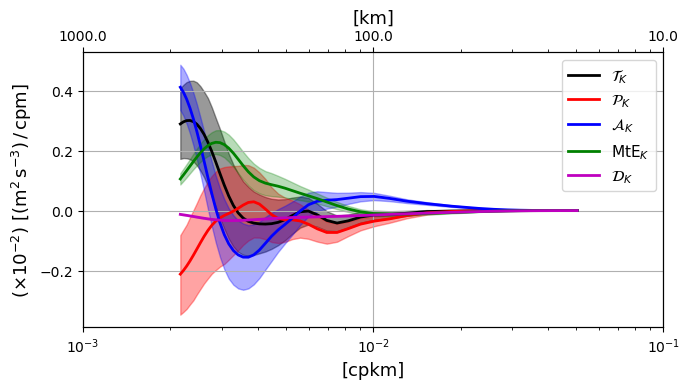

In [37]:
nz = 0

datas = ((dtau.iso_uT + dtav.iso_vT
        # ds0.iso_uT + ds1.iso_vT
    ).sum('angle').stack(zeta=("time", "nmemb")).transpose('zeta','scale')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
rng = np.random.default_rng()
Tres = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
# datas = ((ds0.iso_uAB + ds1.iso_vAB).isel(Z=nz).sum('angle')
#              * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
#     rng = np.random.default_rng()
#     ABres = bootstrap(datas, np.mean, confidence_level=0.95,
#                       random_state=rng)
datas = ((ds0.iso_uP + ds1.iso_vP + ds2.iso_uE + ds3.iso_vE
         ).sum('angle').stack(zeta=("time", "nmemb")).transpose('zeta','scale')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
rng = np.random.default_rng()
Pres = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
datas = ((ds2.iso_uD + ds3.iso_vD
         ).sum('angle').stack(zeta=("time", "nmemb")).transpose('zeta','scale')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
rng = np.random.default_rng()
Dres = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
        
    
Tk = (dtau.iso_uT + dtav.iso_vT
          # ds0.iso_uT + ds1.iso_vT
         ).mean(['nmemb','time']).sum('angle').compute()
# ABk = (ds0.iso_uAB + ds1.iso_vAB).isel(Z=nz).mean(['nmemb']).sum('angle').compute()
    
Pk = (ds0.iso_uP + ds1.iso_vP + ds2.iso_uE + ds3.iso_vE
         ).mean(['nmemb','time']).sum('angle').compute()
Dk = (ds2.iso_uD + ds3.iso_vD).mean(['nmemb','time']).sum('angle').compute()
    
SPu = ds4.iso_SPu
SPv = ds4.iso_SPv
SP = (SPu + SPv)
    
    # ds5 = xr.open_dataset(op.join(spec,'Points/%s/%010d/isoDiags_u_forcing.zarr' 
    #                               % (sreg[reg],iiter))
    #                      )
    # ds6 = xr.open_dataset(op.join(spec,'Points/%s/%010d/isoDiags_v_forcing.zarr' 
    #                               % (sreg[reg],iiter))
    #                      )
    # if nz == 0:
    #     datas = ((ds5.iso_uF + ds6.iso_vF).isel(Z=nz).sum('angle')
    #              * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
    #     rng = np.random.default_rng()
    #     Fres = bootstrap(datas, np.mean, confidence_level=0.95,
    #                      random_state=rng)
    #     Fk = (ds5.iso_uF + ds6.iso_vF).mean(['nmemb']).isel(Z=nz).sum('angle').compute()

datas = (SP.sum('angle').stack(zeta=("time", "nmemb")).transpose('zeta','scale')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
rng = np.random.default_rng()
SPres = bootstrap(datas, np.mean, confidence_level=0.95,
                      random_state=rng)
    # datas = ((ds0.iso_uA + ds1.iso_vA - MtE).isel(Z=nz).sum('angle')
    #          * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
datas = (((dtau.iso_uA + dtav.iso_vA
        # ds0.iso_uA + ds1.iso_vA
    ) + SP).sum('angle').stack(zeta=("time", "nmemb")).transpose('zeta','scale')
             * np.diff(ds0.angle)[0]*2*1e2,)  # samples must be in a sequence
rng = np.random.default_rng()
Ares = bootstrap(datas, np.mean, confidence_level=0.95,
                     random_state=rng)
    
Ak = ((dtau.iso_uA + dtav.iso_vA
           # ds0.iso_uA + ds1.iso_vA
          )
          # - MtE
          + SP
         ).mean(['nmemb','time']).sum('angle').compute()
    # MtEk = MtE.mean(['nmemb']).sum('angle').compute()
SPk = SP.mean(['nmemb','time']).sum('angle').compute()
    
# res = Tk/86400. - (Pk + (dtau.iso_uA + dtav.iso_vA
#                              # ds0.iso_uA + ds1.iso_vA
#                             ).isel(Z=nz).mean(['nmemb']).sum('angle').compute() 
#                        + Dk + ABk
#                       )
#     if nz == 0:
#         res -= Fk
            
fig, ax = plt.subplots(figsize=(7,4))
    # fig, ax = plt.subplots(figsize=(7,6))
fig.set_tight_layout(True)
ax2 = ax.twiny()
    
ax.fill_between((ds0.scale)**-1*1e3, Tres.confidence_interval.low/86400., 
                    Tres.confidence_interval.high/86400., 
                    alpha=.4, color='k')
ax.fill_between((ds0.scale)**-1*1e3, Pres.confidence_interval.low, 
                    Pres.confidence_interval.high, 
                    alpha=.36, color='r')
ax.fill_between((ds0.scale)**-1*1e3, Ares.confidence_interval.low, 
                    Ares.confidence_interval.high, 
                    alpha=.32, color='b')
ax.fill_between((ds0.scale)**-1*1e3, -SPres.confidence_interval.high, 
                    -SPres.confidence_interval.low, 
                    alpha=.28, color='g')
ax.fill_between((ds0.scale)**-1*1e3, Dres.confidence_interval.low, 
                    Dres.confidence_interval.high, 
                    alpha=.26, color='m')
# if nz == 0:
#     ax.fill_between((ds0.scale)**-1*1e3, Fres.confidence_interval.low, 
#                         Fres.confidence_interval.high, 
#                         alpha=.26, color='c')
# ax.fill_between((ds0.scale)**-1*1e3, ABres.confidence_interval.low, 
#                     ABres.confidence_interval.high, 
#                     alpha=.24, color='orange')
    
ax.plot((ds0.scale)**-1*1e3, Tk*np.diff(ds0.angle)[0]*2*1e2/86400.,
            'k', lw=2, label=r"$\mathcal{T}_K$")
ax.plot((ds0.scale)**-1*1e3, Pk*np.diff(ds0.angle)[0]*2*1e2,
            'r', lw=2, label=r"$\mathcal{P}_K$")
ax.plot((ds0.scale)**-1*1e3, Ak*np.diff(ds0.angle)[0]*2*1e2,
            'b', lw=2, label=r"$\mathcal{A}_K$")
ax.plot((ds0.scale)**-1*1e3, -SPk*np.diff(ds0.angle)[0]*2*1e2,
            'g', lw=2, label=r"MtE$_K$")
ax.plot((ds0.scale)**-1*1e3, Dk*np.diff(ds0.angle)[0]*2*1e2,
            'm', lw=2, label=r"$\mathcal{D}_K$")
# if nz == 0:
#     ax.plot((ds0.scale)**-1*1e3, Fk*np.diff(ds0.angle)[0]*2*1e2,
#                 'c', lw=3, label=r"$\mathcal{F}_K$")
# ax.plot((ds0.scale)**-1*1e3, ABk*np.diff(ds0.angle)[0]*2*1e2,
#             c='orange', lw=3, label=r"$AB_K$")
# ax.plot((ds0.scale)**-1*1e3, res*np.diff(ds0.angle)[0]*2*1e2, 
#             c='grey', ls='--', lw=2, label=r"Res.")

ax.set_xscale('log')
#             ax.set_yscale('log')
ax2.set_xscale('log')
#             ax2.set_yscale('log')
ax.set_xlim([1e-3,1e-1])
ax2.set_xlim([1e-3,1e-1])
ax2.set_xticks([1e-3,1e-2,1e-1])
ax2.set_xticklabels([1e3,1e2,1e1])
# Meta = np.abs(Pk.isel(Z=0)).max(skipna=True).values*1e3
# ax.set_ylim([-Meta*.7, Meta*.7])
ax.set_xlabel(r"[cpkm]", fontsize=13)
ax2.set_xlabel(r"[km]", fontsize=13)
ax.set_ylabel(r"($\times 10^{-2}$) [(m$^2\,$s$^{-3})\,/\,$cpm]", fontsize=13)
ax.grid(True)
# if reg % 5 == 0:
ax.legend(loc='upper right', fontsize=11)
plt.savefig(op.join(spec,'Figs/SpecKEbudget_Region%02d_Z452_1967.pdf' 
                        % (reg)))
plt.show()

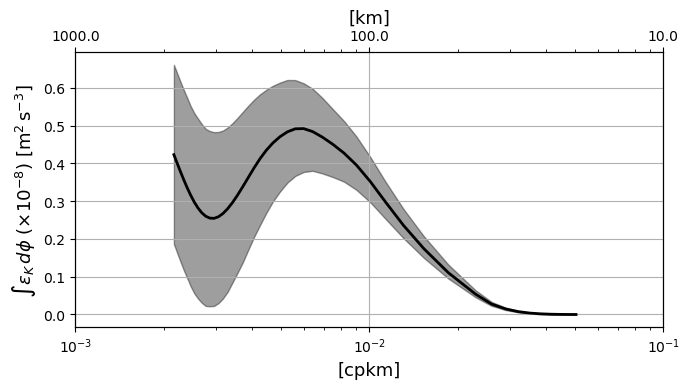

In [38]:
iZ = 1
# iiter = 1419120

     
dks = xr.DataArray(np.abs(np.diff(ds4.scale**-1)).data, dims='scale',
                       coords={'scale':.5*(ds4.scale[1:].data + ds4.scale[:-1].data)}
                      ).interp(scale=ds4.scale, kwargs={"fill_value": "extrapolate"})
    # MtE = (ds4.iso_uA + ds4.iso_vA)
SPu = ds4.iso_SPu
SPv = ds4.iso_SPv
SP = (SPu + SPv)
Ak = (dtau.iso_uA + dtav.iso_vA
      # ds0.iso_uA + ds1.iso_vA
      # - MtE
      + SP
)

piw = ((Ak * dks
       ).sum('angle').stack(zeta=("time", "nmemb")
                           ).transpose('zeta','scale'
                                      )[...,::-1].cumsum('scale')[...,::-1].compute() 
       * np.diff(ds0.angle)[0]*2)
datas = (piw, )  # samples must be in a sequence
rng = np.random.default_rng()
Pwres = bootstrap(datas, np.mean, confidence_level=0.95,
                      # n_resamples=100,
                      random_state=rng)
    
    
fig, ax = plt.subplots(figsize=(7,4))
fig.set_tight_layout(True)
    # ax2 = ax.twinx()
ax3 = ax.twiny()
    
ax.fill_between((ds0.scale)**-1*1e3, Pwres.confidence_interval.low*1e8, 
                    Pwres.confidence_interval.high*1e8, 
                    alpha=.38, color='k')
    
ax.plot((ds0.scale)**-1*1e3, piw.mean(['zeta'])*1e8,
            'k', lw=2,)
    
ax.set_xscale('log')
ax3.set_xscale('log')
ax.set_xlim([1e-3,1e-1])

ax3.set_xlim([1e-3,1e-1])
ax3.set_xticks([1e-3,1e-2,1e-1])
ax3.set_xticklabels([1e3,1e2,1e1])
ax.set_xlabel(r"[cpkm]", fontsize=13)
ax3.set_xlabel(r"[km]", fontsize=13)

ax.set_ylabel(r"$\int\epsilon_K\,d\phi$ ($\times 10^{-8}$) [m$^2\,$s$^{-3}$]", 
                  fontsize=13)

ax.grid(True)
plt.savefig(op.join(spec,'Figs/WKE-specflux_Region%02d_Z452_1967.pdf' % reg))
plt.show()